###  <p align = "center"> TRABAJO DE FIN DE MÁSTER EN BIG DATA Y DATA SCIENCE. APLICACIONES AL COMERCIO, EMPRESA Y FINANZAS </p>

# <p align = "center"> **CUADRO DE MANDO PARA MONITORIZAR UNA CARTERA DE FONDOS DE INVERSION Y HACER PREDICCIONES MEDIANTE ALGORITMOS DE MACHINE LEARNING** </p>

 <p align = "left"> Presentado por: GONZALO ÁLVAREZ SÁNCHEZ </p>

<p align = "left"> Tutorizado por: CARLOS ORTEGA y SANTIAGO MOTA HERCE </p>



-------------------------------------------------------------

Para la creación de las diferentes carteras de Fondos de Inversión, las cuáles han sido previamente configuradas, se va a realizar la carga de los archivos .CSV que previamente se han descargado de la web de CAIXABANK de donde se han seleccionado diferentes fondos que podrían complementar bien nuestras carteras según el tipo de fondo que queremos incluir. Posteriormente, se analizarán y compondrán las diferentes carteras, que estarán formadas por dichos fondos en diferentes porcentajes.

Se han subido los diferentes archivos que se van a usar a un repositorio creado para la ocasión, y que se irá enumerando a medida que se importen cada fondo:

*Nota*: Antes de la carga se procederá a la importación de librerías apropiadas para esta primera parte:

In [1]:
# Importación librerías típicas
import pandas as pd # Con Pandas realizaremos la lectura de los difentes dataset
import numpy as np
import matplotlib.pyplot as plt # Matplotlib va a permitir el graficado de nuestros datos
from bokeh.plotting import figure, output_file, show # Bokeh nos permite graficar coronas circulares para mostrar los porcentajes de Fondo por Cartera
from itertools import accumulate # Permite realizar la suma acumulada de cifras
from datetime import datetime, timedelta

1.   Fondo de Renta Fija Euro: CaixaBank Duración Flexible 0-2, FI Clase Universal - ES0147507034

In [2]:
# Importación de dataset Fondo de Renta Fija Euro
FI_RF_Eur_url = 'https://raw.githubusercontent.com/gonzaloalvsan/TFM_Gonzalo/main/CaixaBank%20Duraci%C3%B3n%20Flexible%200-2%2C%20FI%20Clase%20Universal%20-%20ES0147507034.csv'

# Lectura del dataset con pandas read_csv (separador ;) 
FI_RF_Eur_df = pd.read_csv(FI_RF_Eur_url, sep = ';',decimal=',')

# Cambio formato de dato VLP de object a float y Fecha de object a datetime
FI_RF_Eur_df['VLP'] = FI_RF_Eur_df['VLP'].astype(float)
FI_RF_Eur_df['Fecha'] = pd.to_datetime(FI_RF_Eur_df['Fecha'], format="%d/%m/%Y")

# Visualización del dataset
FI_RF_Eur_df

,Fecha,VLP
0,2018-01-01,10.686478
1,2018-01-02,10.686761
2,2018-01-03,10.690516
3,2018-01-04,10.691399
4,2018-01-05,10.692004
...,...,...
1334,2021-08-27,10.597455
1335,2021-08-28,10.597792
1336,2021-08-29,10.598128
1337,2021-08-30,10.597909


Vamos a representarlo gráficamente. Para ello, vamos a usar conjuntamente las librerás *numpy* y *matplotlib*.

En primer lugar, vamos a importar de *matplotlib* los diferentes estilos mediante *style*. Vamos a  usar *'ggplot'*, para que nos de un gráfico de evolución.

A continuación, definiremos la variable **X** que será el conjunto de *Fechas* y la variable **Y** para los *Valores liquidativos* dada cada una de las fechas. Se trata de valores diarios.

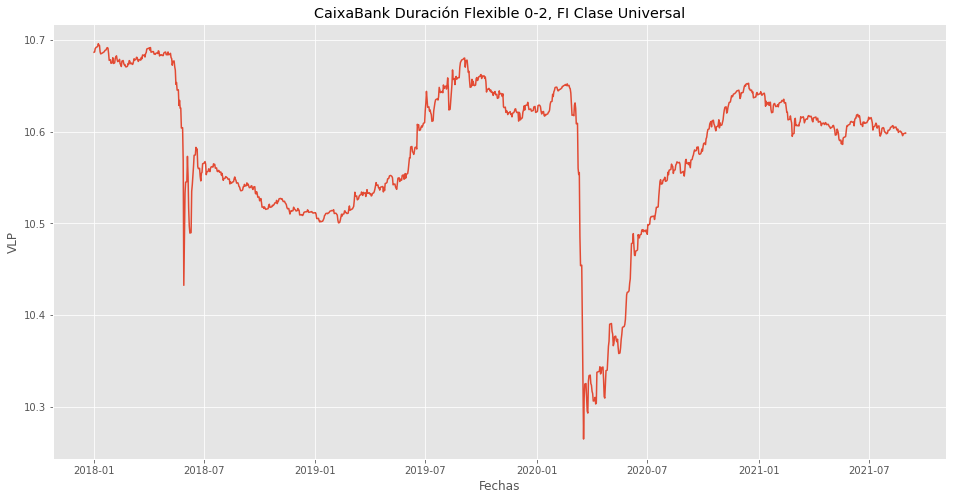

In [3]:
# División entre X e Y y graficado
x,y=FI_RF_Eur_df.Fecha,FI_RF_Eur_df.VLP

from matplotlib import style

style.use('ggplot')

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Duración Flexible 0-2, FI Clase Universal')
plt.ylabel('VLP')
plt.xlabel('Fechas')
plt.show()

A continuación, se va a calcular la rentabilidad diaria y la acumulada acumulada.

In [4]:
# Calculo Rentabilidad diaria
Rentabilidad_incial = FI_RF_Eur_df.loc[0,'VLP']
for i in range(1,len(FI_RF_Eur_df)):
  FI_RF_Eur_df.loc[i,'Rentabilidad_diaria'] = (((FI_RF_Eur_df.VLP[i] - FI_RF_Eur_df.VLP[i-1])/FI_RF_Eur_df.VLP[i-1])*100)

FI_RF_Eur_df.Rentabilidad_diaria[0] = 0

FI_RF_Eur_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Fecha,VLP,Rentabilidad_diaria
0,2018-01-01,10.686478,0.000000
1,2018-01-02,10.686761,0.002650
2,2018-01-03,10.690516,0.035135
3,2018-01-04,10.691399,0.008259
4,2018-01-05,10.692004,0.005656
...,...,...,...
1334,2021-08-27,10.597455,0.018788
1335,2021-08-28,10.597792,0.003175
1336,2021-08-29,10.598128,0.003175
1337,2021-08-30,10.597909,-0.002067


In [5]:
# Calculo Rentabilidad diaria acumulada
FI_RF_Eur_df.loc[:,'Rentabilidad'] = list(accumulate(FI_RF_Eur_df.Rentabilidad_diaria))

FI_RF_Eur_df

,Fecha,VLP,Rentabilidad_diaria,Rentabilidad
0,2018-01-01,10.686478,0.000000,0.000000
1,2018-01-02,10.686761,0.002650,0.002650
2,2018-01-03,10.690516,0.035135,0.037784
3,2018-01-04,10.691399,0.008259,0.046043
4,2018-01-05,10.692004,0.005656,0.051699
...,...,...,...,...
1334,2021-08-27,10.597455,0.018788,-0.801995
1335,2021-08-28,10.597792,0.003175,-0.798821
1336,2021-08-29,10.598128,0.003175,-0.795646
1337,2021-08-30,10.597909,-0.002067,-0.797713


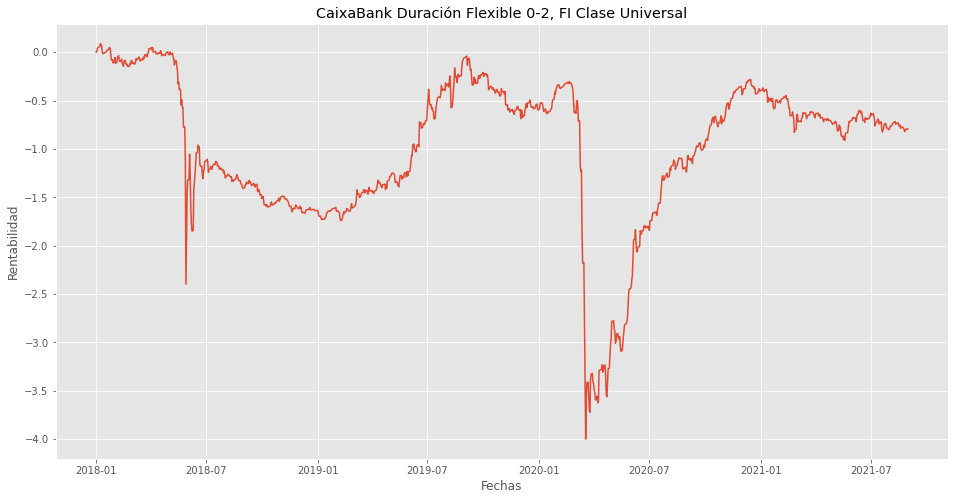

In [6]:
# Representación gráfica del Fondo de Renta Fija Euro
x,y=FI_RF_Eur_df.Fecha,FI_RF_Eur_df.Rentabilidad

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Duración Flexible 0-2, FI Clase Universal')
plt.ylabel('Rentabilidad')
plt.xlabel('Fechas')
plt.show()



2.   Fondo de Renta Fija Internacional: CaixaBank Bonos Internacional, FI Clase Universal - ES0159178039



In [7]:
# Importación de dataset Fondo de Renta Fija Internacional
FI_RF_Int_url = 'https://raw.githubusercontent.com/gonzaloalvsan/TFM_Gonzalo/main/CaixaBank%20Bonos%20Internacional%2C%20FI%20Clase%20Universal%20-%20ES0159178039.csv'

# Lectura del dataset con pandas read_csv (separador ;) 
FI_RF_Int_df = pd.read_csv(FI_RF_Int_url, sep = ';',decimal=',')

# Cambio formato de dato VLP de object a float y Fecha de object a datetime
FI_RF_Int_df['VLP'] = FI_RF_Int_df['VLP'].astype(float)
FI_RF_Int_df['Fecha'] = pd.to_datetime(FI_RF_Int_df['Fecha'], format="%d/%m/%Y")

# Visualización del dataset
FI_RF_Int_df

,Fecha,VLP
0,2018-01-01,9.852598
1,2018-01-02,9.847738
2,2018-01-03,9.864722
3,2018-01-04,9.855346
4,2018-01-05,9.864678
...,...,...
1334,2021-08-27,10.211331
1335,2021-08-28,10.211084
1336,2021-08-29,10.210837
1337,2021-08-30,10.215289


A continuación, definiremos la variable **X** que será el conjunto de *Fechas* y la variable **Y** para los *Valores liquidativos* dada cada una de las fechas. Se trata de valores diarios.

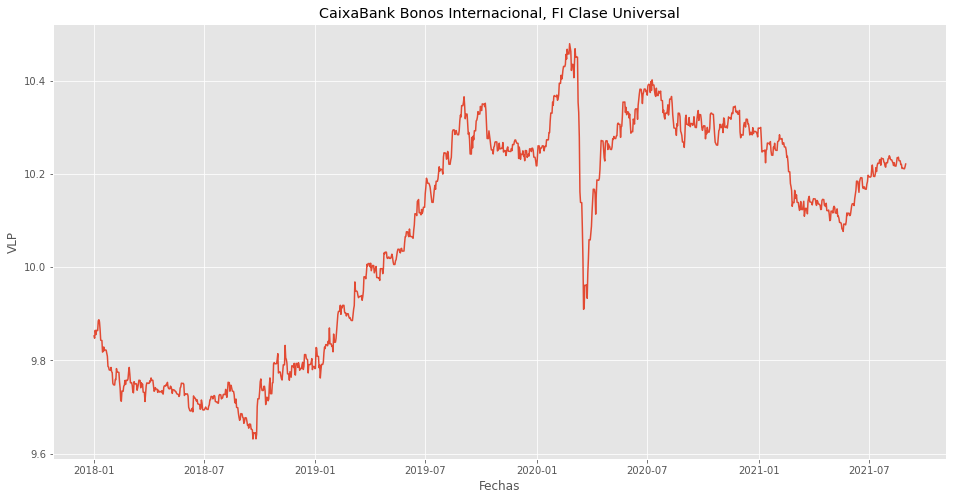

In [8]:
# Representación gráfica de los VLP del Fondo Renta Fija Internacional
style.use('ggplot')

x,y=FI_RF_Int_df.Fecha,FI_RF_Int_df.VLP

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Bonos Internacional, FI Clase Universal')
plt.ylabel('VLP')
plt.xlabel('Fechas')
plt.show()

A continuación, se va a calcular la rentabilidad diaria y la acumulada.

In [9]:
# Calculo Rentabilidad diaria
Rentabilidad_incial = FI_RF_Int_df.loc[0,'VLP']
for i in range(1,len(FI_RF_Int_df)):
  FI_RF_Int_df.loc[i,'Rentabilidad_diaria'] = (((FI_RF_Int_df.VLP[i] - FI_RF_Int_df.VLP[i-1])/FI_RF_Int_df.VLP[i-1])*100)

FI_RF_Int_df.Rentabilidad_diaria[0] = 0

FI_RF_Int_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Fecha,VLP,Rentabilidad_diaria
0,2018-01-01,9.852598,0.000000
1,2018-01-02,9.847738,-0.049328
2,2018-01-03,9.864722,0.172470
3,2018-01-04,9.855346,-0.095046
4,2018-01-05,9.864678,0.094683
...,...,...,...
1334,2021-08-27,10.211331,-0.015280
1335,2021-08-28,10.211084,-0.002418
1336,2021-08-29,10.210837,-0.002418
1337,2021-08-30,10.215289,0.043603


In [10]:
# Calculo Rentabilidad diaria acumulada
FI_RF_Int_df.loc[:,'Rentabilidad'] = list(accumulate(FI_RF_Int_df.Rentabilidad_diaria))

FI_RF_Int_df

,Fecha,VLP,Rentabilidad_diaria,Rentabilidad
0,2018-01-01,9.852598,0.000000,0.000000
1,2018-01-02,9.847738,-0.049328,-0.049328
2,2018-01-03,9.864722,0.172470,0.123141
3,2018-01-04,9.855346,-0.095046,0.028095
4,2018-01-05,9.864678,0.094683,0.122778
...,...,...,...,...
1334,2021-08-27,10.211331,-0.015280,3.688312
1335,2021-08-28,10.211084,-0.002418,3.685894
1336,2021-08-29,10.210837,-0.002418,3.683476
1337,2021-08-30,10.215289,0.043603,3.727079


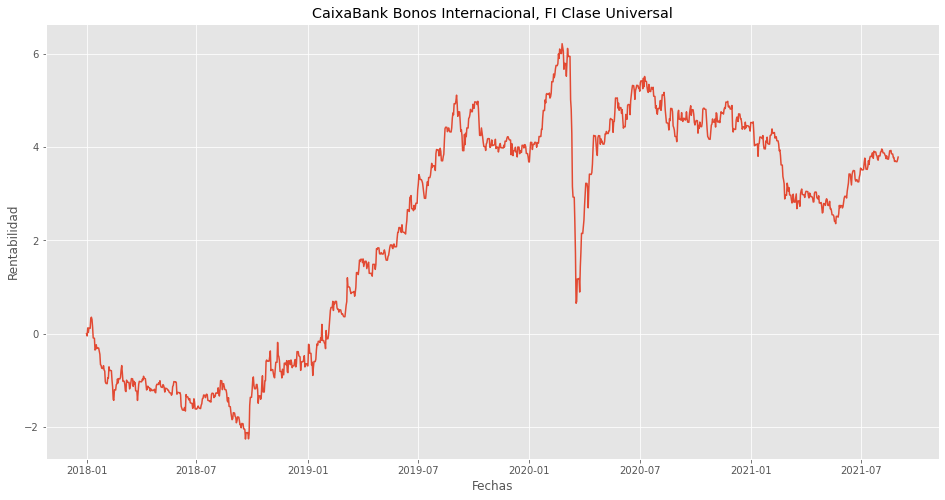

In [11]:
# Representación gráfica de la rentabilidad acumulada Fondo de Renta Fija Internacional
x,y=FI_RF_Int_df.Fecha,FI_RF_Int_df.Rentabilidad

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Bonos Internacional, FI Clase Universal')
plt.ylabel('Rentabilidad')
plt.xlabel('Fechas')
plt.show()

3.   Fondo de Gestión Alternativa: CaixaBank Gestion Activa, FI - ES0113386009

In [12]:
# Importación de dataset Fondo de Gestión Alternativa
FI_Gest_Alt_url = 'https://raw.githubusercontent.com/gonzaloalvsan/TFM_Gonzalo/main/CaixaBank%20Gestion%20Activa%2C%20FI%20-%20ES0113386009.csv'

# Lectura del dataset con pandas read_csv (separador ;) 
FI_Gest_Alt_df = pd.read_csv(FI_Gest_Alt_url, sep = ';',decimal=',')

# Cambio formato de dato VLP de object a float y Fecha de object a datetime
FI_Gest_Alt_df['VLP'] = FI_Gest_Alt_df['VLP'].astype(float)
FI_Gest_Alt_df['Fecha'] = pd.to_datetime(FI_Gest_Alt_df['Fecha'], format="%d/%m/%Y")

# Visualización del dataset
FI_Gest_Alt_df

,Fecha,VLP
0,2018-01-01,98.921245
1,2018-01-02,98.947850
2,2018-01-03,99.027256
3,2018-01-04,99.075056
4,2018-01-05,99.118364
...,...,...
1334,2021-08-27,98.802627
1335,2021-08-28,98.801194
1336,2021-08-29,98.799762
1337,2021-08-30,98.822273


A continuación, definiremos la variable **X** que será el conjunto de *Fechas* y la variable **Y** para los *Valores liquidativos* dada cada una de las fechas. Se trata de valores diarios.

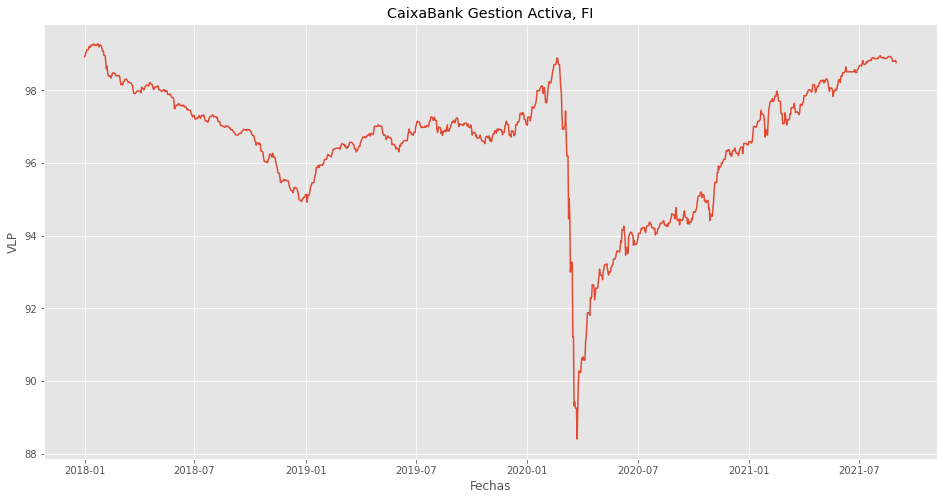

In [13]:
# Representación gráfica de VLP de Fondo de Gestión Alternativa
x,y=FI_Gest_Alt_df.Fecha,FI_Gest_Alt_df.VLP

style.use('ggplot')

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Gestion Activa, FI')
plt.ylabel('VLP')
plt.xlabel('Fechas')
plt.show()

A continuación, se va a calcular la rentabilidad diaria y la acumulada.

In [14]:
Rentabilidad_incial = FI_Gest_Alt_df.loc[0,'VLP']
for i in range(1,len(FI_Gest_Alt_df)):
  FI_Gest_Alt_df.loc[i,'Rentabilidad_diaria'] = (((FI_Gest_Alt_df.VLP[i] - FI_Gest_Alt_df.VLP[i-1])/FI_Gest_Alt_df.VLP[i-1])*100)

FI_Gest_Alt_df.Rentabilidad_diaria[0] = 0

FI_Gest_Alt_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,Fecha,VLP,Rentabilidad_diaria
0,2018-01-01,98.921245,0.000000
1,2018-01-02,98.947850,0.026895
2,2018-01-03,99.027256,0.080250
3,2018-01-04,99.075056,0.048270
4,2018-01-05,99.118364,0.043712
...,...,...,...
1334,2021-08-27,98.802627,0.011859
1335,2021-08-28,98.801194,-0.001450
1336,2021-08-29,98.799762,-0.001449
1337,2021-08-30,98.822273,0.022784


In [15]:
# Calculo Rentabilidad diaria acumulada
FI_Gest_Alt_df.loc[:,'Rentabilidad'] = list(accumulate(FI_Gest_Alt_df.Rentabilidad_diaria))

FI_Gest_Alt_df

,Fecha,VLP,Rentabilidad_diaria,Rentabilidad
0,2018-01-01,98.921245,0.000000,0.000000
1,2018-01-02,98.947850,0.026895,0.026895
2,2018-01-03,99.027256,0.080250,0.107145
3,2018-01-04,99.075056,0.048270,0.155415
4,2018-01-05,99.118364,0.043712,0.199127
...,...,...,...,...
1334,2021-08-27,98.802627,0.011859,0.025637
1335,2021-08-28,98.801194,-0.001450,0.024187
1336,2021-08-29,98.799762,-0.001449,0.022737
1337,2021-08-30,98.822273,0.022784,0.045522


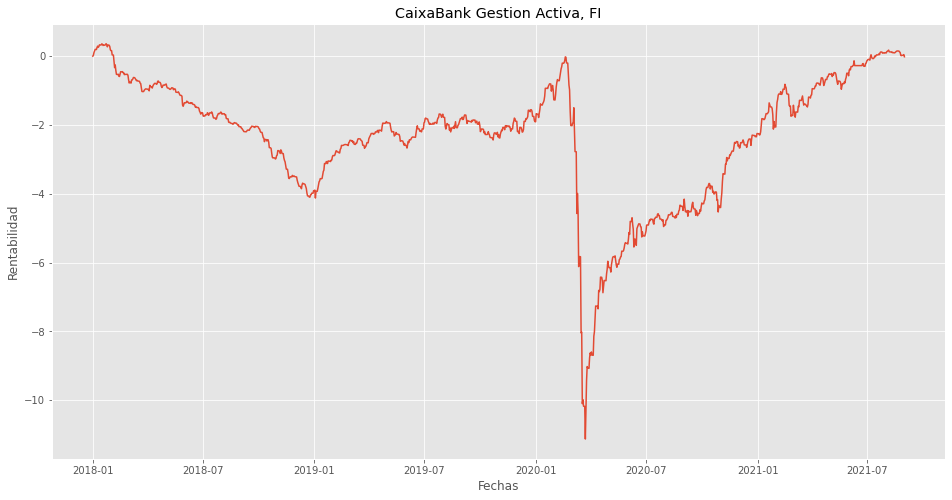

In [16]:
# Representación gráfica de la rentabilidad acumulada Fondo de Renta Gestión Alternativa
x,y=FI_Gest_Alt_df.Fecha,FI_Gest_Alt_df.Rentabilidad

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Gestion Activa, FI')
plt.ylabel('Rentabilidad')
plt.xlabel('Fechas')
plt.show()

4.   Fondo de Renta Variable Internacional: CaixaBank Renta Variable Global, FI Clase Universal - ES0159037037



In [17]:
# Importación de dataset Fondo de Renta Variable Internacional
FI_RV_Int_url = 'https://raw.githubusercontent.com/gonzaloalvsan/TFM_Gonzalo/main/CaixaBank%20Renta%20Variable%20Global%2C%20FI%20Clase%20Universal%20-%20ES0159037037.csv'

# Lectura del dataset con pandas read_csv (separador ;) 
FI_RV_Int_df = pd.read_csv(FI_RV_Int_url,sep = ';',decimal=',')

# Cambio formato de dato VLP de object a float y Fecha de object a datetime
FI_RV_Int_df['VLP'] = FI_RV_Int_df['VLP'].astype(float)
FI_RV_Int_df['Fecha'] = pd.to_datetime(FI_RV_Int_df['Fecha'], format="%d/%m/%Y")

# Visualización del dataset
FI_RV_Int_df

,Fecha,VLP
0,2018-01-01,105.942875
1,2018-01-02,105.946484
2,2018-01-03,106.647447
3,2018-01-04,107.574969
4,2018-01-05,108.414822
...,...,...
1334,2021-08-27,139.538966
1335,2021-08-28,139.530758
1336,2021-08-29,139.522554
1337,2021-08-30,140.202851


A continuación, definiremos la variable **X** que será el conjunto de *Fechas* y la variable **Y** para los *Valores liquidativos* dada cada una de las fechas. Se trata de valores diarios.

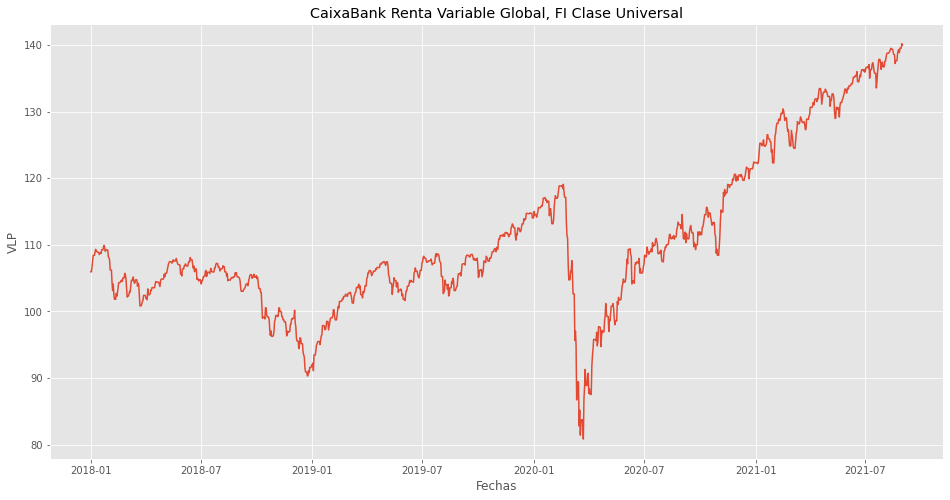

In [18]:
# Representación gráfica de VLP de Fondo Renta Variable Internacional
style.use('ggplot')

x,y=FI_RV_Int_df.Fecha,FI_RV_Int_df.VLP

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Renta Variable Global, FI Clase Universal')
plt.ylabel('VLP')
plt.xlabel('Fechas')
plt.show()

A continuación, se va a calcular la rentabilidad diaria y la acumulada.

In [19]:
# Calculo Rentabilidad diaria
Rentabilidad_incial = FI_RV_Int_df.loc[0,'VLP']
for i in range(1,len(FI_RV_Int_df)):
  FI_RV_Int_df.loc[i,'Rentabilidad_diaria'] = (((FI_RV_Int_df.VLP[i] - FI_RV_Int_df.VLP[i-1])/FI_RV_Int_df.VLP[i-1])*100)

FI_RV_Int_df.Rentabilidad_diaria[0] = 0

FI_RV_Int_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Fecha,VLP,Rentabilidad_diaria
0,2018-01-01,105.942875,0.000000
1,2018-01-02,105.946484,0.003407
2,2018-01-03,106.647447,0.661620
3,2018-01-04,107.574969,0.869709
4,2018-01-05,108.414822,0.780714
...,...,...,...
1334,2021-08-27,139.538966,0.480334
1335,2021-08-28,139.530758,-0.005882
1336,2021-08-29,139.522554,-0.005880
1337,2021-08-30,140.202851,0.487589


In [20]:
# Calculo Rentabilidad acumulada diaria
FI_RV_Int_df.loc[:,'Rentabilidad'] = list(accumulate(FI_RV_Int_df.Rentabilidad_diaria))

FI_RV_Int_df

,Fecha,VLP,Rentabilidad_diaria,Rentabilidad
0,2018-01-01,105.942875,0.000000,0.000000
1,2018-01-02,105.946484,0.003407,0.003407
2,2018-01-03,106.647447,0.661620,0.665026
3,2018-01-04,107.574969,0.869709,1.534735
4,2018-01-05,108.414822,0.780714,2.315449
...,...,...,...,...
1334,2021-08-27,139.538966,0.480334,31.911274
1335,2021-08-28,139.530758,-0.005882,31.905391
1336,2021-08-29,139.522554,-0.005880,31.899512
1337,2021-08-30,140.202851,0.487589,32.387101


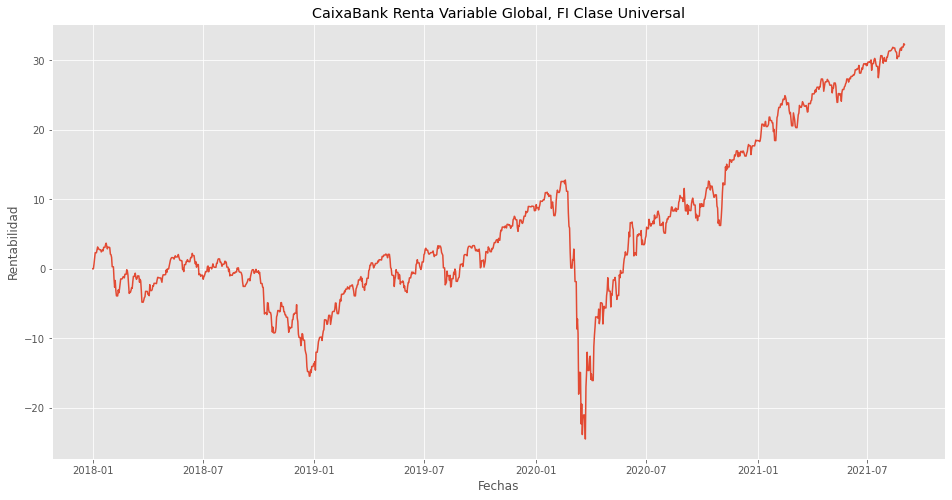

In [21]:
# Representación gráfica de la rentabilidad acumulada Fondo de Renta Variable Internacional
x,y=FI_RV_Int_df.Fecha,FI_RV_Int_df.Rentabilidad

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Renta Variable Global, FI Clase Universal')
plt.ylabel('Rentabilidad')
plt.xlabel('Fechas')
plt.show()

5.   Fondo de Renta Variable Global: CaixaBank Global Flexible, FI - ES0164381008

In [22]:
# Importación de dataset Fondo de Renta Variable Global
FI_RV_Glob_url = 'https://raw.githubusercontent.com/gonzaloalvsan/TFM_Gonzalo/main/CaixaBank%20Global%20Flexible%2C%20FI%20-%20ES0164381008.csv'

# Lectura del dataset con pandas read_csv (separador ;) 
FI_RV_Glob_df = pd.read_csv(FI_RV_Glob_url, sep = ';',decimal=',')

# Cambio formato de dato VLP de object a float y Fecha de object a datetime
FI_RV_Glob_df['VLP'] = FI_RV_Glob_df['VLP'].astype(float)
FI_RV_Glob_df['Fecha'] = pd.to_datetime(FI_RV_Glob_df['Fecha'], format="%d/%m/%Y")

# Visualización del dataset
FI_RV_Glob_df

,Fecha,VLP
0,2018-01-01,99.015743
1,2018-01-02,99.026838
2,2018-01-03,99.514758
3,2018-01-04,100.010021
4,2018-01-05,100.555147
...,...,...
1334,2021-08-27,110.285461
1335,2021-08-28,110.282573
1336,2021-08-29,110.279686
1337,2021-08-30,110.645356


Vamos a representarlo gráficamente. En primer lugar, vamos a importar de *matplotlib* los diferentes estilos mediante *style*. Vamos a  usar *'ggplot'*, para que nos de un gráfico de evolución.

A continuación, definiremos la variable **X** que será el conjunto de *Fechas* y la variable **Y** para los *Valores liquidativos* dada cada una de las fechas. Se trata de valores diarios.

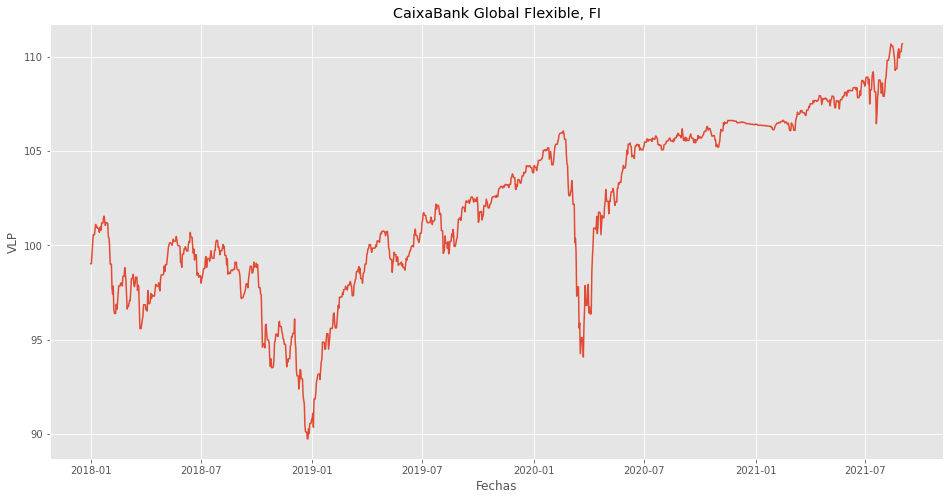

In [23]:
# Representación gráfica
style.use('ggplot')

x,y=FI_RV_Glob_df.Fecha,FI_RV_Glob_df.VLP

plt.figure(figsize=(16,8))
plt.plot(x,y)
plt.title('CaixaBank Global Flexible, FI')
plt.ylabel('VLP')
plt.xlabel('Fechas')
plt.show()

A continuación, vamos a calcular la rentabilidad diaria y su acumulada

In [24]:
# Rentabilidad diaria
Rentabilidad_incial = FI_RV_Glob_df.loc[0,'VLP']
for i in range(1,len(FI_RV_Glob_df)):
  FI_RV_Glob_df.loc[i,'Rentabilidad_diaria'] = (((FI_RV_Glob_df.VLP[i] - FI_RV_Glob_df.VLP[i-1])/FI_RV_Glob_df.VLP[i-1])*100)

FI_RV_Glob_df.Rentabilidad_diaria[0] = 0

FI_RV_Glob_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Fecha,VLP,Rentabilidad_diaria
0,2018-01-01,99.015743,0.000000
1,2018-01-02,99.026838,0.011205
2,2018-01-03,99.514758,0.492715
3,2018-01-04,100.010021,0.497678
4,2018-01-05,100.555147,0.545071
...,...,...,...
1334,2021-08-27,110.285461,0.313861
1335,2021-08-28,110.282573,-0.002619
1336,2021-08-29,110.279686,-0.002618
1337,2021-08-30,110.645356,0.331584


In [25]:
# Calculo Rentabilidad acumulada diaria
FI_RV_Glob_df.loc[:,'Rentabilidad'] = list(accumulate(FI_RV_Glob_df.Rentabilidad_diaria))

FI_RV_Glob_df

,Fecha,VLP,Rentabilidad_diaria,Rentabilidad
0,2018-01-01,99.015743,0.000000,0.000000
1,2018-01-02,99.026838,0.011205,0.011205
2,2018-01-03,99.514758,0.492715,0.503920
3,2018-01-04,100.010021,0.497678,1.001598
4,2018-01-05,100.555147,0.545071,1.546670
...,...,...,...,...
1334,2021-08-27,110.285461,0.313861,11.482260
1335,2021-08-28,110.282573,-0.002619,11.479641
1336,2021-08-29,110.279686,-0.002618,11.477023
1337,2021-08-30,110.645356,0.331584,11.808607


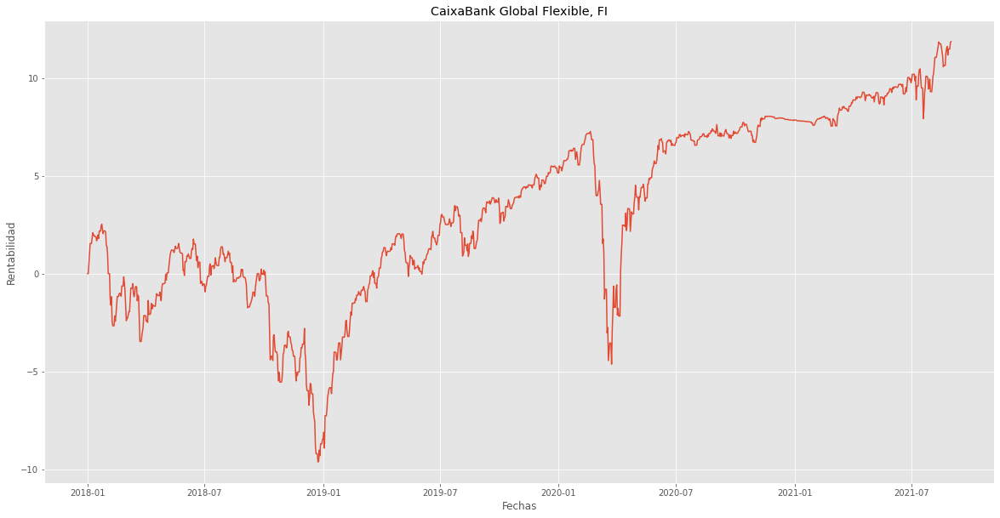

In [26]:
# Representación gráfica de la rentabildiad acumulada del fondo
x,y=FI_RV_Glob_df.Fecha,FI_RV_Glob_df.Rentabilidad

plt.figure(figsize=(20,10))
plt.plot(x,y)
plt.title('CaixaBank Global Flexible, FI')
plt.ylabel('Rentabilidad')
plt.xlabel('Fechas')
plt.show()

A continuación, vamos a graficar un resumen de la evolución de la rentabilidad acumulada de cada uno de los fondos seleccionados. Obtendremos evoluciones muy diferentes debido al riesgo asumido (más riesgo más movimiento), pero si se podrá observar que debido a diferentes situaciones que afectan a la economía, habrá un movimiento parecido en dichas evoluciones.

Para ello, en primer lugar vamos a unificar las *Rentabilidades acumuladas* de cada fondo en un mismo dataframe al que vamos a denominar **Cartera_fondos**

In [27]:
Cartera_fondos = pd.DataFrame(FI_RF_Eur_df,columns=['Fecha','Rentabilidad'])

Cartera_fondos = Cartera_fondos.rename(columns={'Rentabilidad':'Rentab FI RF Eur'})

In [28]:
Cartera_fondos['Rentab FI RF Int'] = FI_RF_Int_df.Rentabilidad

Cartera_fondos['Rentab FI Gest Alt'] = FI_Gest_Alt_df.Rentabilidad

Cartera_fondos['Rentab FI RV Int'] = FI_RV_Int_df.Rentabilidad

Cartera_fondos['Rentab FI RV Glob'] = FI_RV_Glob_df.Rentabilidad

Cartera_fondos

,Fecha,Rentab FI RF Eur,Rentab FI RF Int,Rentab FI Gest Alt,Rentab FI RV Int,Rentab FI RV Glob
0,2018-01-01,0.000000,0.000000,0.000000,0.000000,0.000000
1,2018-01-02,0.002650,-0.049328,0.026895,0.003407,0.011205
2,2018-01-03,0.037784,0.123141,0.107145,0.665026,0.503920
3,2018-01-04,0.046043,0.028095,0.155415,1.534735,1.001598
4,2018-01-05,0.051699,0.122778,0.199127,2.315449,1.546670
...,...,...,...,...,...,...
1334,2021-08-27,-0.801995,3.688312,0.025637,31.911274,11.482260
1335,2021-08-28,-0.798821,3.685894,0.024187,31.905391,11.479641
1336,2021-08-29,-0.795646,3.683476,0.022737,31.899512,11.477023
1337,2021-08-30,-0.797713,3.727079,0.045522,32.387101,11.808607


Graficamos

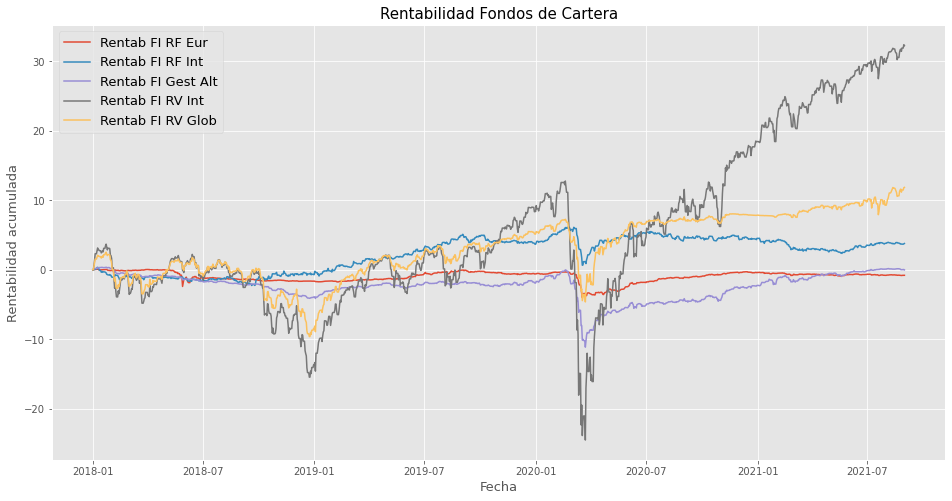

In [29]:
x = Cartera_fondos.Fecha
y1 = FI_RF_Eur_df.Rentabilidad
y2 = FI_RF_Int_df.Rentabilidad
y3 = FI_Gest_Alt_df.Rentabilidad
y4 = FI_RV_Int_df.Rentabilidad
y5 = FI_RV_Glob_df.Rentabilidad

colors=['orange', 'purple', 'green','red', 'pink']

plt.figure(figsize=(16,8))
plt.plot(x,y1,label="Rentab FI RF Eur")
plt.plot(x,y2,label="Rentab FI RF Int")
plt.plot(x,y3,label="Rentab FI Gest Alt")
plt.plot(x,y4,label="Rentab FI RV Int")
plt.plot(x,y5,label="Rentab FI RV Glob")

plt.title("Rentabilidad Fondos de Cartera",fontsize=15)
plt.xlabel("Fecha",fontsize=13)
plt.ylabel("Rentabilidad acumulada",fontsize=13)
plt.legend(fontsize=13)
plt.show()

Para la creación de nuestra cartera de fondos, a continuación vamos a cargar los porcentajes de cada tipo de fondo (elegidos aleatoriamente, pero intentando que sean razonables según riesgo con el tipo de cartera). Posteriormente, vamos a graficarlo para darle un aspecto más visual.

In [30]:
# Importación de dataset Porcentaje de fondo por cartera
Composicion_cartera_url = 'https://raw.githubusercontent.com/gonzaloalvsan/TFM_Gonzalo/main/Composici%C3%B3n%20de%20Carteras.csv'

# Lectura del dataset con pandas read_csv (separador ;) 
Composicion_cartera_df = pd.read_csv(Composicion_cartera_url, sep = ';',decimal=',')

# Visualización del dataset
Composicion_cartera_df


,Tipo Fondo,Cartera TRANQUILA,Cartera EQUILIBRADA,Cartera CRECIENTE,Cartera AVANZADA
0,LIQUIDEZ,51,39,26,8
1,RENTA FIJA,33,26,18,14
2,GESTIÓN ALTERNATIVA,4,4,2,2
3,RENTA VARIABLE INTERNACIONAL,4,11,18,26
4,RENTA VARIABLE GLOBAL,8,20,36,50


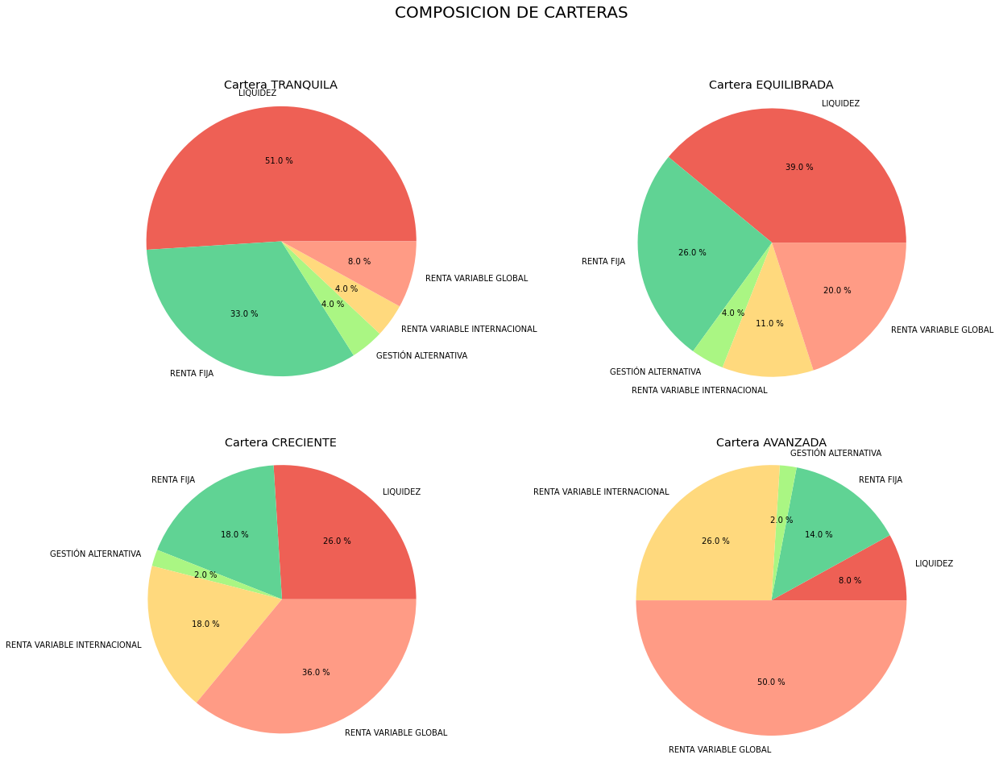

In [31]:
plt.subplots(nrows=2, ncols=2, figsize=(20,15))

plt.subplot(2,2,1)
Cartera_tranquila_grf = Composicion_cartera_df['Cartera TRANQUILA']
Tipo_fondo = Composicion_cartera_df['Tipo Fondo']
colores = ["#EE6055","#60D394","#AAF683","#FFD97D","#FF9B85"]
plt.pie(Cartera_tranquila_grf, labels=Tipo_fondo, autopct="%0.1f %%", colors=colores)
plt.title("Cartera TRANQUILA")
plt.axis("equal")

plt.subplot(2,2,2)
Cartera_equilibrada_grf = Composicion_cartera_df['Cartera EQUILIBRADA']
Tipo_fondo = Composicion_cartera_df['Tipo Fondo']
colores = ["#EE6055","#60D394","#AAF683","#FFD97D","#FF9B85"]
plt.pie(Cartera_equilibrada_grf, labels=Tipo_fondo, autopct="%0.1f %%", colors=colores)
plt.title("Cartera EQUILIBRADA")
plt.axis("equal")

plt.subplot(2,2,3)
Cartera_creciente_grf = Composicion_cartera_df['Cartera CRECIENTE']
Tipo_fondo = Composicion_cartera_df['Tipo Fondo']
colores = ["#EE6055","#60D394","#AAF683","#FFD97D","#FF9B85"]
plt.pie(Cartera_creciente_grf, labels=Tipo_fondo, autopct="%0.1f %%", colors=colores)
plt.title("Cartera CRECIENTE")
plt.axis("equal")


plt.subplot(2,2,4)
Cartera_avanzada_grf = Composicion_cartera_df['Cartera AVANZADA']
Tipo_fondo = Composicion_cartera_df['Tipo Fondo']
colores = ["#EE6055","#60D394","#AAF683","#FFD97D","#FF9B85"]
plt.pie(Cartera_avanzada_grf, labels=Tipo_fondo, autopct="%0.1f %%", colors=colores)
plt.title("Cartera AVANZADA")
plt.axis("equal")

plt.suptitle("COMPOSICION DE CARTERAS",fontsize=20)
plt.show()

Con los datos anteriores, vamos a componer las diferentes carpetas según su rentabilidad y graficaremos.



1.   **CARTERA TRANQUILA**: Cartera con muy poco riesgo (conservador) y baja rentabilidad


In [32]:
Carteras = pd.DataFrame(Cartera_fondos,columns=['Fecha'])

Carteras['Cartera TRANQUILA'] = ((Cartera_fondos['Rentab FI RF Eur']*((Composicion_cartera_df.iloc[0]['Cartera TRANQUILA'])/100))+
                     (Cartera_fondos['Rentab FI RF Int']*((Composicion_cartera_df.iloc[1]['Cartera TRANQUILA'])/100))+
                     (Cartera_fondos['Rentab FI Gest Alt']*((Composicion_cartera_df.iloc[2]['Cartera TRANQUILA'])/100))+
                     (Cartera_fondos['Rentab FI RV Int']*((Composicion_cartera_df.iloc[3]['Cartera TRANQUILA'])/100))+
                     (Cartera_fondos['Rentab FI RV Glob']*((Composicion_cartera_df.iloc[4]['Cartera TRANQUILA'])/100)))
Carteras['Cartera EQUILIBRADA']= ((Cartera_fondos['Rentab FI RF Eur']*((Composicion_cartera_df.iloc[0]['Cartera EQUILIBRADA'])/100))+
                     (Cartera_fondos['Rentab FI RF Int']*((Composicion_cartera_df.iloc[1]['Cartera EQUILIBRADA'])/100))+
                     (Cartera_fondos['Rentab FI Gest Alt']*((Composicion_cartera_df.iloc[2]['Cartera EQUILIBRADA'])/100))+
                     (Cartera_fondos['Rentab FI RV Int']*((Composicion_cartera_df.iloc[3]['Cartera EQUILIBRADA'])/100))+
                     (Cartera_fondos['Rentab FI RV Glob']*((Composicion_cartera_df.iloc[4]['Cartera EQUILIBRADA'])/100)))
Carteras['Cartera CRECIENTE'] = ((Cartera_fondos['Rentab FI RF Eur']*((Composicion_cartera_df.iloc[0]['Cartera CRECIENTE'])/100))+
                     (Cartera_fondos['Rentab FI RF Int']*((Composicion_cartera_df.iloc[1]['Cartera CRECIENTE'])/100))+
                     (Cartera_fondos['Rentab FI Gest Alt']*((Composicion_cartera_df.iloc[2]['Cartera CRECIENTE'])/100))+
                     (Cartera_fondos['Rentab FI RV Int']*((Composicion_cartera_df.iloc[3]['Cartera CRECIENTE'])/100))+
                     (Cartera_fondos['Rentab FI RV Glob']*((Composicion_cartera_df.iloc[4]['Cartera CRECIENTE'])/100)))
Carteras['Cartera AVANZADA'] = ((Cartera_fondos['Rentab FI RF Eur']*((Composicion_cartera_df.iloc[0]['Cartera AVANZADA'])/100))+
                     (Cartera_fondos['Rentab FI RF Int']*((Composicion_cartera_df.iloc[1]['Cartera AVANZADA'])/100))+
                     (Cartera_fondos['Rentab FI Gest Alt']*((Composicion_cartera_df.iloc[2]['Cartera AVANZADA'])/100))+
                     (Cartera_fondos['Rentab FI RV Int']*((Composicion_cartera_df.iloc[3]['Cartera AVANZADA'])/100))+
                     (Cartera_fondos['Rentab FI RV Glob']*((Composicion_cartera_df.iloc[4]['Cartera AVANZADA'])/100)))

Carteras

,Fecha,Cartera TRANQUILA,Cartera EQUILIBRADA,Cartera CRECIENTE,Cartera AVANZADA
0,2018-01-01,0.000000,0.000000,0.000000,0.000000
1,2018-01-02,-0.012819,-0.008100,-0.003005,0.000332
2,2018-01-03,0.131107,0.224975,0.335248,0.447272
3,2018-01-04,0.180487,0.400619,0.656964,0.910555
4,2018-01-05,0.291200,0.624083,1.013106,1.400659
...,...,...,...,...,...
1334,2021-08-27,3.004183,6.453901,10.333533,14.490778
1335,2021-08-28,3.004501,6.453281,10.331893,14.487826
1336,2021-08-29,3.004819,6.452662,10.330253,14.484874
1337,2021-08-30,3.065096,6.584056,10.545156,14.783834


Representamos graficamente las rentabilidades de las carpetas según las rentabilidades diarias acumuladas conjuntas según peso de los fondos que las componen

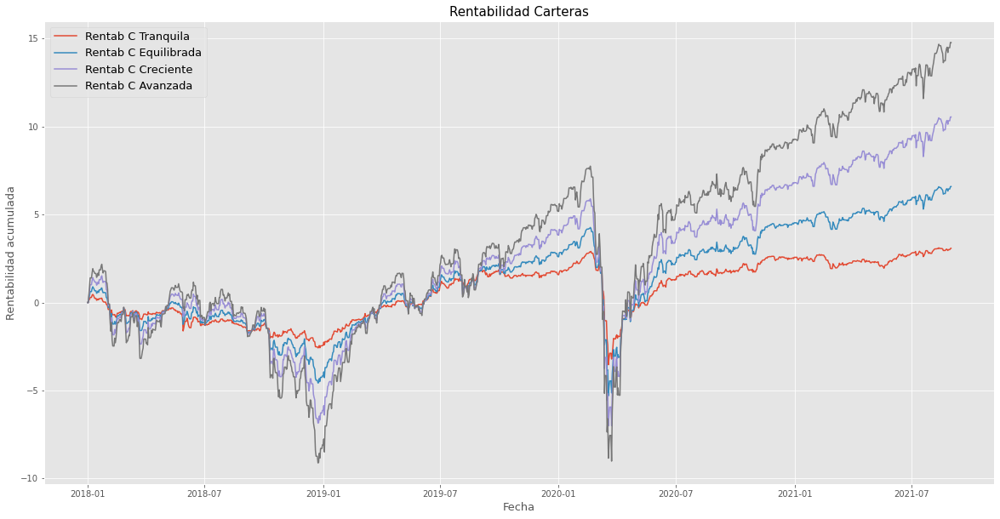

In [33]:
# Representación gráfica
x = Carteras.Fecha
y1 = Carteras['Cartera TRANQUILA']
y2 = Carteras['Cartera EQUILIBRADA']
y3 = Carteras['Cartera CRECIENTE']
y4 = Carteras['Cartera AVANZADA']

colors=['orange', 'purple', 'green', 'red']

plt.figure(figsize=(20,10))
plt.plot(x,y1,label="Rentab C Tranquila")
plt.plot(x,y2,label="Rentab C Equilibrada")
plt.plot(x,y3,label="Rentab C Creciente")
plt.plot(x,y4,label="Rentab C Avanzada")


plt.title("Rentabilidad Carteras",fontsize=15)
plt.xlabel("Fecha",fontsize=13)
plt.ylabel("Rentabilidad acumulada",fontsize=13)
plt.legend(fontsize=13)
plt.show()

# **IMPLEMENTACIÓN DE ALGORITMOS DE APRENDIZAJE SUPERVISADOS**

## **MODELOS DE REGRESIÓN**

In [34]:
# Importación librerías típicas
from datetime import datetime
import pandas as pd # Con Pandas realizaremos la lectura de los difentes dataset
import numpy as np
import matplotlib.pyplot as plt # Matplotlib va a permitir el graficado de nuestros datos
from itertools import accumulate # Permite realizar la suma acumulada de cifras
from math import sqrt  # Permite el cálculo de raíces cuadradas
from sklearn.ensemble import RandomForestRegressor # Modelo Random Forest
from sklearn.linear_model import LinearRegression # Modelo Regresión Lineal
from sklearn.linear_model import RidgeCV # Modelo Ridge
from sklearn.linear_model import LassoCV # Modelo Lasso
from sklearn.metrics import mean_squared_error #MSE
from sklearn.metrics import mean_absolute_error #MAE
from sklearn.metrics import r2_score #R2

### **1. Fondo de Renta Fija Euro: CaixaBank Duración Flexible 0-2, FI Clase Universal**

#### *PREDICCIONES A 30 DÍAS*

In [35]:
# Creación de dataset a partir del principal de Renta Fija Euro, indexando la Fecha
FI_RF_Eur_df_Reg_30 = FI_RF_Eur_df
FI_RF_Eur_df_Reg_30.set_index('Fecha', inplace=True)

In [36]:
FI_RF_Eur_df_Reg_30.head()

,VLP,Rentabilidad_diaria,Rentabilidad
Fecha,,,
2018-01-01,10.686478,0.000000,0.000000
2018-01-02,10.686761,0.002650,0.002650
2018-01-03,10.690516,0.035135,0.037784
2018-01-04,10.691399,0.008259,0.046043
2018-01-05,10.692004,0.005656,0.051699


In [37]:
FI_RF_Eur_df_Reg_30.shape

(1339, 3)

In [38]:
FI_RF_Eur_df_Reg_30.isnull().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [39]:
FI_RF_Eur_df_Reg_30.isna().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [40]:
FI_RF_Eur_df_Reg_30.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
dtypes: float64(3)
memory usage: 41.8 KB


In [41]:
FI_RF_Eur_df_Reg_30.describe()

,VLP,Rentabilidad_diaria,Rentabilidad
count,1339.000000,1339.000000,1339.000000
mean,10.579478,-0.000593,-0.987965
std,0.080031,0.071747,0.757159
min,10.264761,-1.282981,-3.998169
25%,10.534534,-0.010466,-1.416789
50%,10.603960,0.002493,-0.744953
75%,10.635159,0.011237,-0.460146
max,10.695793,0.480201,0.087143


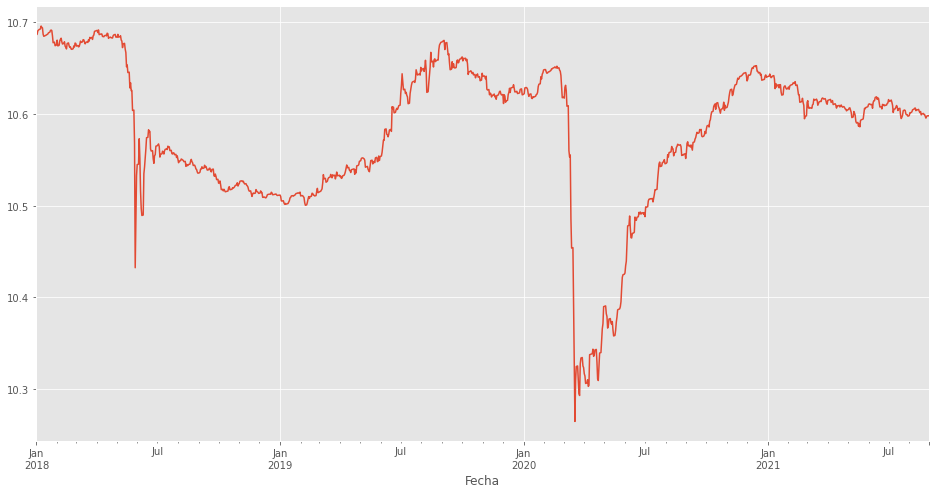

In [42]:
# Graficado inicial para visualizar los datos
FI_RF_Eur_df_Reg_30['VLP'].plot(figsize=(16,8))

In [43]:
# Creación nueva variable para predecir 30 días en el futuro
dias_futuros = 30

# Creación de nueva columna (target) desplazada 30 días más tarde
FI_RF_Eur_df_Reg_30['Prediccion']=FI_RF_Eur_df_Reg_30[['VLP']].shift(-dias_futuros)
FI_RF_Eur_df_Reg_30

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,10.686478,0.000000,0.000000,10.675100
2018-01-02,10.686761,0.002650,0.002650,10.680476
2018-01-03,10.690516,0.035135,0.037784,10.674206
2018-01-04,10.691399,0.008259,0.046043,10.674521
2018-01-05,10.692004,0.005656,0.051699,10.674836
...,...,...,...,...
2021-08-27,10.597455,0.018788,-0.801995,NaN
2021-08-28,10.597792,0.003175,-0.798821,NaN
2021-08-29,10.598128,0.003175,-0.795646,NaN


In [44]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 30 días
X = np.array(FI_RF_Eur_df_Reg_30.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [45]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 30
y = np.array(FI_RF_Eur_df_Reg_30['Prediccion'])

In [46]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [47]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [48]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[10.62086808 10.62105723 10.62124619 10.62289554 10.62113278 10.61999318
 10.62049306 10.62127818 10.62146522 10.62165229 10.6188626  10.61126536
 10.61529586 10.61249709 10.61395247 10.61413388 10.61432595 10.61188816
 10.61437003 10.6144362  10.60850027 10.60609497 10.60628829 10.60648383
 10.61219573 10.61326301 10.61344632 10.61193851 10.61095846 10.61114885
 10.61134329 10.61253726 10.61078284 10.61333589 10.61399414 10.61422177
 10.61441265 10.61460344 10.61586529 10.61580897 10.61541826 10.61684556
 10.61380697 10.61399287 10.61418077 10.6101528  10.60653446 10.60643808
 10.60040262 10.60060159 10.60077106 10.60095118 10.6035627  10.6001362
 10.59801169 10.58725729 10.5892342  10.58940583 10.58958246 10.60043202
 10.60164877 10.59582101 10.59635632 10.59568801 10.59587324 10.5960584
 10.59555875 10.59829949 10.59887613 10.60292461 10.60206839 10.60225778
 10.60245135 10.60293194 10.60182998 10.59802613 10.59931861 10.60074709
 10.60093409 10.60112688 10.60101148 10.60325379 10.6

In [49]:
# Creación de rango de fechas de dataset de testeo para incorporar al df de testeo, de cara a la grafica final
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [50]:
# Creación de los df con las predicciones según cada regresión, indexando el listado de fechas
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [51]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,10.620868
2021-01-02,10.621057
2021-01-03,10.621246
2021-01-04,10.622896
2021-01-05,10.621133
...,...
2021-08-27,10.589229
2021-08-28,10.589475
2021-08-29,10.589721
2021-08-30,10.589561


In [52]:
# Creación del df indexando a los datos de testeo las columnas con las diferente predicciones
Pred_vs_orig_df = FI_RF_Eur_df_Reg_30.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [53]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,10.640730,0.002473,-0.395395,10.627702,10.620868,10.620847,10.620868
2021-01-02,10.640988,0.002431,-0.392964,10.629335,10.621057,10.621036,10.621057
2021-01-03,10.641247,0.002429,-0.390535,10.626936,10.621246,10.621225,10.621246
2021-01-04,10.643503,0.021200,-0.369336,10.630428,10.622896,10.622873,10.622896
2021-01-05,10.641092,-0.022652,-0.391988,10.631328,10.621133,10.621111,10.621133
...,...,...,...,...,...,...,...
2021-08-27,10.597455,0.018788,-0.801995,NaN,10.589229,10.589221,10.589229
2021-08-28,10.597792,0.003175,-0.798821,NaN,10.589475,10.589467,10.589475
2021-08-29,10.598128,0.003175,-0.795646,NaN,10.589721,10.589713,10.589721
2021-08-30,10.597909,-0.002067,-0.797713,NaN,10.589561,10.589553,10.589561


Obtenidas las diferentes predicciones, vamos a visualizarlo de manera gráfica cada predicción en general respecto de la realidad para ver cómo evolucionaría, para después visualizar la predicción específicamente en los 8 primeros meses del año 2021.

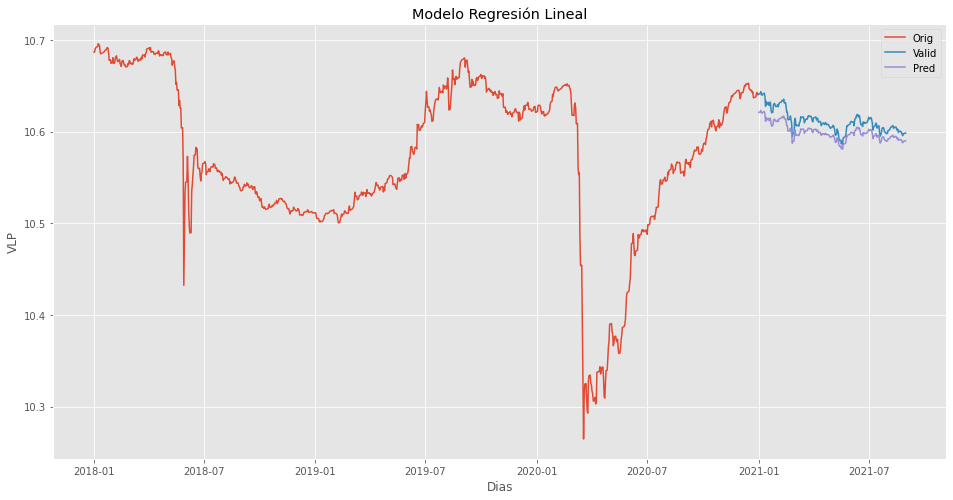

In [54]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Eur_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

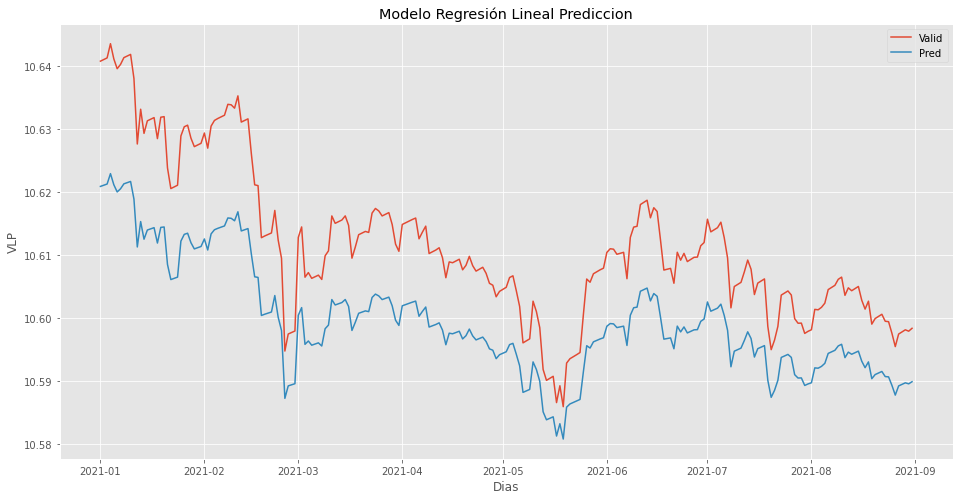

In [55]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

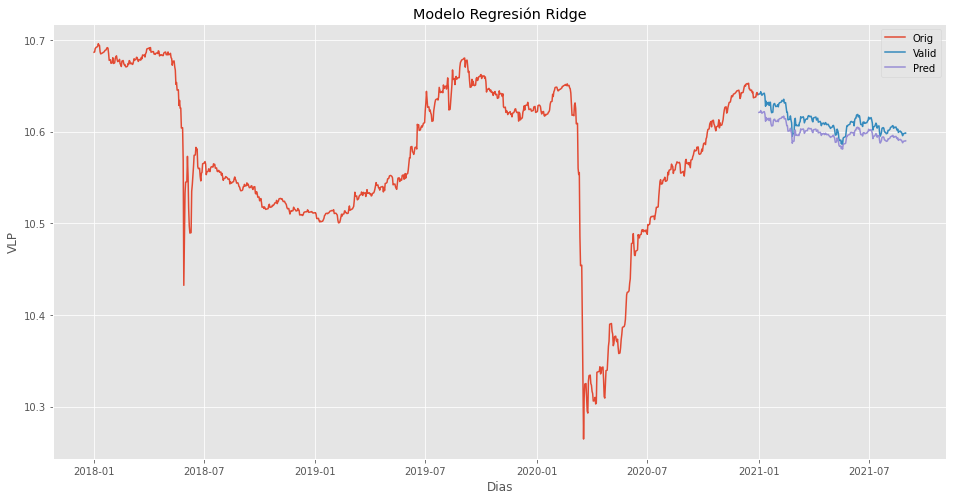

In [56]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Eur_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

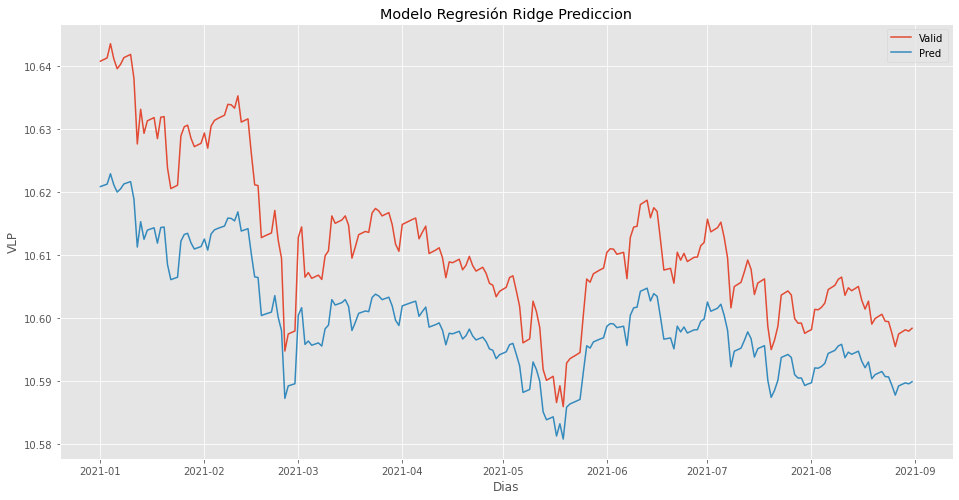

In [57]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

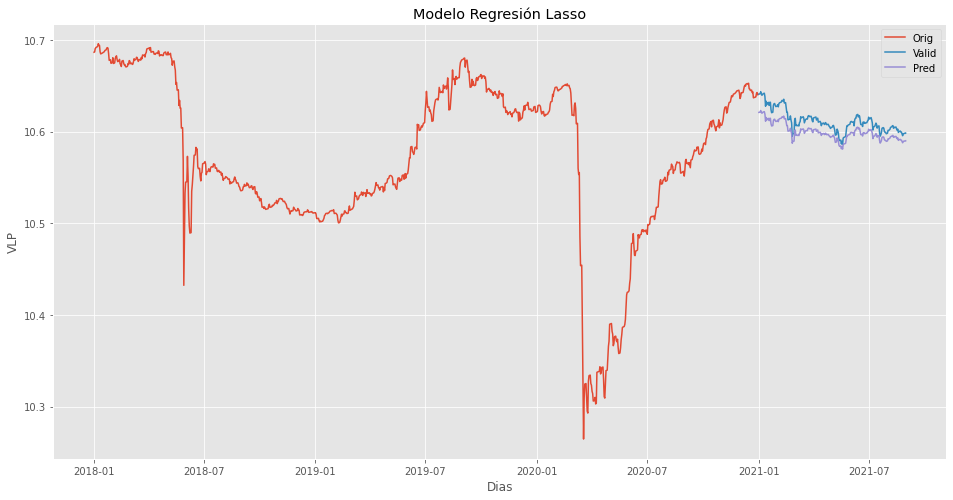

In [58]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Eur_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

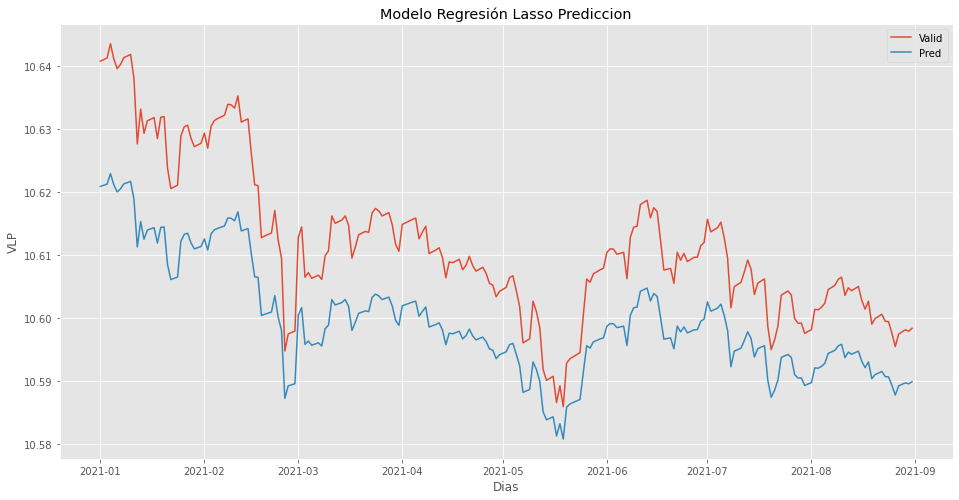

In [59]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [60]:
from sklearn.metrics import mean_squared_error #MSE
from sklearn.metrics import mean_absolute_error #MAE
from sklearn.metrics import r2_score #R2
from math import sqrt

# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI1_30 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI1_30 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI1_30 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI1_30 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI1_30 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI1_30 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI1_30 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI1_30 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI1_30 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI1_30 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI1_30 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI1_30 = round(r2_score(X_test,Lasso_pred),5)

In [61]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',mse_lr_FI1_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_lr_FI1_30)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es:',mae_lr_FI1_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es:',r2_lr_FI1_30)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 30 días es:',mse_r_FI1_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_r_FI1_30)
print('El Error Absoluto Medio para el Modelo de Ridge de 30 días es:',mae_r_FI1_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es:',r2_r_FI1_30)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 30 días es:',mse_l_FI1_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_l_FI1_30)
print('El Error Absoluto Medio para el Modelo de Lasso de 30 días es:',mae_l_FI1_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es:',r2_l_FI1_30)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.00015
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.01244
El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es: 0.012
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es: -0.04081
El Error Cuadrático Medio para el Modelo de Ridge de 30 días es: 0.00016
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.01246
El Error Absoluto Medio para el Modelo de Ridge de 30 días es: 0.01202
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es: -0.04296
El Error Cuadrático Medio para el Modelo de Lasso de 30 días es: 0.00015
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.01244
El Error Absoluto Medio para el Modelo de Lasso de 30 días es: 0.012
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es: -0.04081


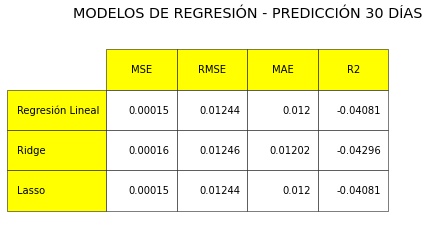

In [62]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI1_30 = [[mse_lr_FI1_30,rmse_lr_FI1_30,mae_lr_FI1_30,r2_lr_FI1_30],
               [mse_r_FI1_30,rmse_r_FI1_30,mae_r_FI1_30,r2_r_FI1_30],
               [mse_l_FI1_30,rmse_l_FI1_30,mae_l_FI1_30,r2_l_FI1_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI1_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [63]:
FI_RF_Eur_df_Reg_60 = FI_RF_Eur_df

In [64]:
FI_RF_Eur_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,10.686478,0.000000,0.000000,10.675100
2018-01-02,10.686761,0.002650,0.002650,10.680476
2018-01-03,10.690516,0.035135,0.037784,10.674206
2018-01-04,10.691399,0.008259,0.046043,10.674521
2018-01-05,10.692004,0.005656,0.051699,10.674836
...,...,...,...,...
2021-08-27,10.597455,0.018788,-0.801995,NaN
2021-08-28,10.597792,0.003175,-0.798821,NaN
2021-08-29,10.598128,0.003175,-0.795646,NaN


In [65]:
FI_RF_Eur_df_Reg_60.head()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,10.686478,0.000000,0.000000,10.675100
2018-01-02,10.686761,0.002650,0.002650,10.680476
2018-01-03,10.690516,0.035135,0.037784,10.674206
2018-01-04,10.691399,0.008259,0.046043,10.674521
2018-01-05,10.692004,0.005656,0.051699,10.674836


In [66]:
FI_RF_Eur_df_Reg_60.shape

(1339, 4)

In [67]:
FI_RF_Eur_df_Reg_60.isnull().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [68]:
FI_RF_Eur_df_Reg_60.isna().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [69]:
FI_RF_Eur_df_Reg_60.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
 3   Prediccion           1309 non-null   float64
dtypes: float64(4)
memory usage: 92.3 KB


In [70]:
FI_RF_Eur_df_Reg_60.describe()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
count,1339.000000,1339.000000,1339.000000,1309.000000
mean,10.579478,-0.000593,-0.987965,10.577012
std,0.080031,0.071747,0.757159,0.079244
min,10.264761,-1.282981,-3.998169,10.264761
25%,10.534534,-0.010466,-1.416789,10.533101
50%,10.603960,0.002493,-0.744953,10.601823
75%,10.635159,0.011237,-0.460146,10.631639
max,10.695793,0.480201,0.087143,10.691601


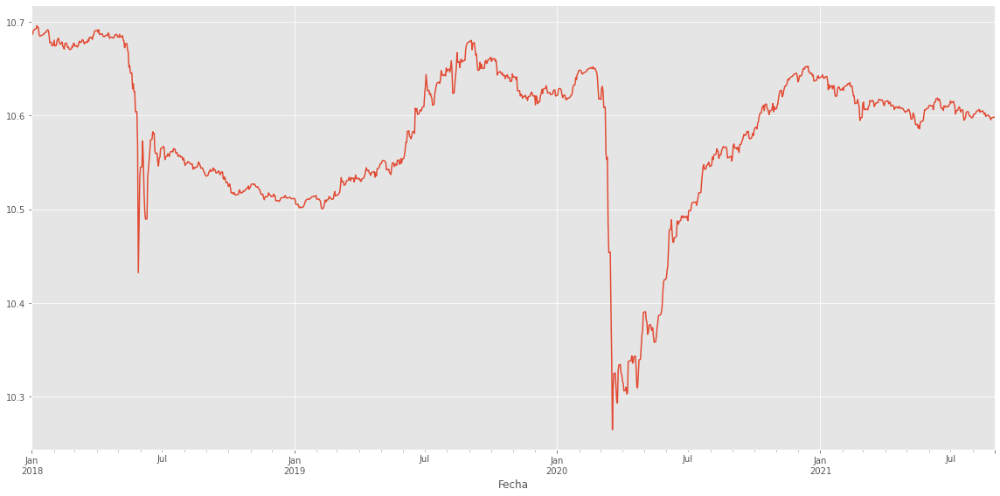

In [71]:
FI_RF_Eur_df_Reg_60['VLP'].plot(figsize=(16,8))

In [72]:
# Creación nueva variable para predecir 60 días en el futuro
dias_futuros = 60

# Creación de nueva columna (target) desplazada 60 días más tarde
FI_RF_Eur_df_Reg_60['Prediccion']=FI_RF_Eur_df_Reg_60[['VLP']].shift(-dias_futuros)
FI_RF_Eur_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,10.686478,0.000000,0.000000,10.674006
2018-01-02,10.686761,0.002650,0.002650,10.674317
2018-01-03,10.690516,0.035135,0.037784,10.674627
2018-01-04,10.691399,0.008259,0.046043,10.673184
2018-01-05,10.692004,0.005656,0.051699,10.673506
...,...,...,...,...
2021-08-27,10.597455,0.018788,-0.801995,NaN
2021-08-28,10.597792,0.003175,-0.798821,NaN
2021-08-29,10.598128,0.003175,-0.795646,NaN


In [73]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 60 días
X = np.array(FI_RF_Eur_df_Reg_60.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [74]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 60
y = np.array(FI_RF_Eur_df_Reg_60['Prediccion'])

In [75]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [76]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [77]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[10.5995479  10.59966198 10.59977596 10.60077077 10.59970755 10.59902019
 10.5993217  10.59979525 10.59990807 10.6000209  10.59833827 10.59375594
 10.59618697 10.59449887 10.59537669 10.59548611 10.59560196 10.59413159
 10.59562854 10.59566845 10.59208815 10.59063738 10.59075398 10.59087192
 10.5943171  10.59496084 10.5950714  10.59416195 10.59357083 10.59368567
 10.59380294 10.5945231  10.5934649  10.59500479 10.59540182 10.59553912
 10.59565425 10.59576933 10.59653042 10.59649646 10.59626079 10.59712168
 10.59528893 10.59540105 10.59551439 10.59308489 10.59090246 10.59084432
 10.58720399 10.587324   10.58742621 10.58753486 10.58911001 10.58704329
 10.58576188 10.57927527 10.58046766 10.58057118 10.58067772 10.58722172
 10.58795561 10.58444055 10.58476343 10.58436033 10.58447205 10.58458373
 10.58428236 10.58593547 10.58628327 10.58872514 10.58820871 10.58832294
 10.58843969 10.58872956 10.58806491 10.58577059 10.58655015 10.58741175
 10.58752454 10.58764083 10.58757122 10.58892369 10

In [78]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [79]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [80]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,10.599548
2021-01-02,10.599662
2021-01-03,10.599776
2021-01-04,10.600771
2021-01-05,10.599708
...,...
2021-08-27,10.580464
2021-08-28,10.580613
2021-08-29,10.580761
2021-08-30,10.580665


In [81]:
Pred_vs_orig_df = FI_RF_Eur_df_Reg_60.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [82]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,10.640730,0.002473,-0.395395,10.614442,10.599548,10.599480,10.599548
2021-01-02,10.640988,0.002431,-0.392964,10.606472,10.599662,10.599593,10.599662
2021-01-03,10.641247,0.002429,-0.390535,10.607204,10.599776,10.599707,10.599776
2021-01-04,10.643503,0.021200,-0.369336,10.606290,10.600771,10.600700,10.600771
2021-01-05,10.641092,-0.022652,-0.391988,10.606543,10.599708,10.599639,10.599708
...,...,...,...,...,...,...,...
2021-08-27,10.597455,0.018788,-0.801995,NaN,10.580464,10.580439,10.580464
2021-08-28,10.597792,0.003175,-0.798821,NaN,10.580613,10.580587,10.580613
2021-08-29,10.598128,0.003175,-0.795646,NaN,10.580761,10.580735,10.580761
2021-08-30,10.597909,-0.002067,-0.797713,NaN,10.580665,10.580639,10.580665


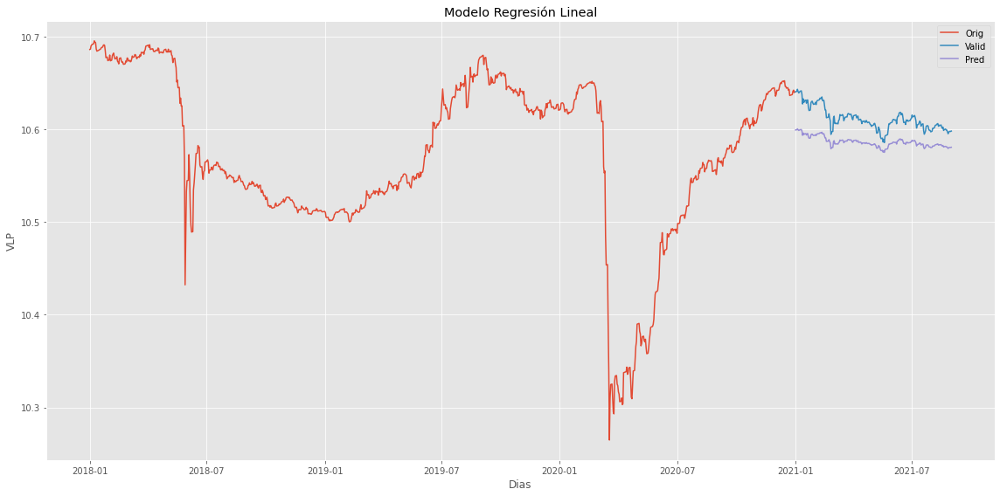

In [83]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Eur_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

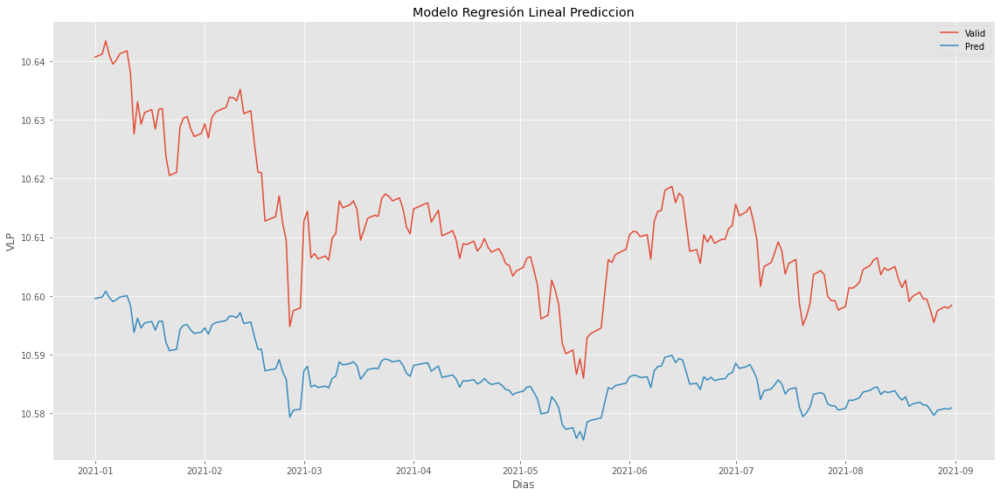

In [84]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

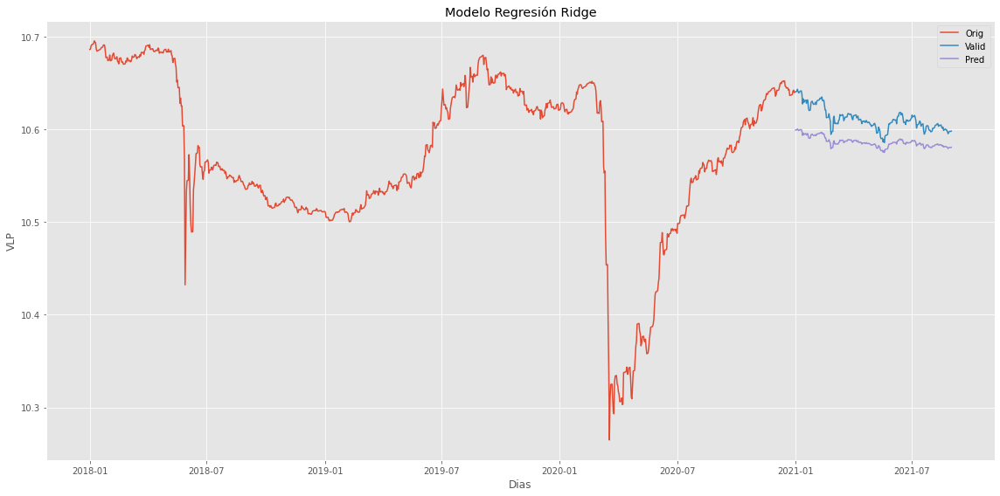

In [85]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Eur_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

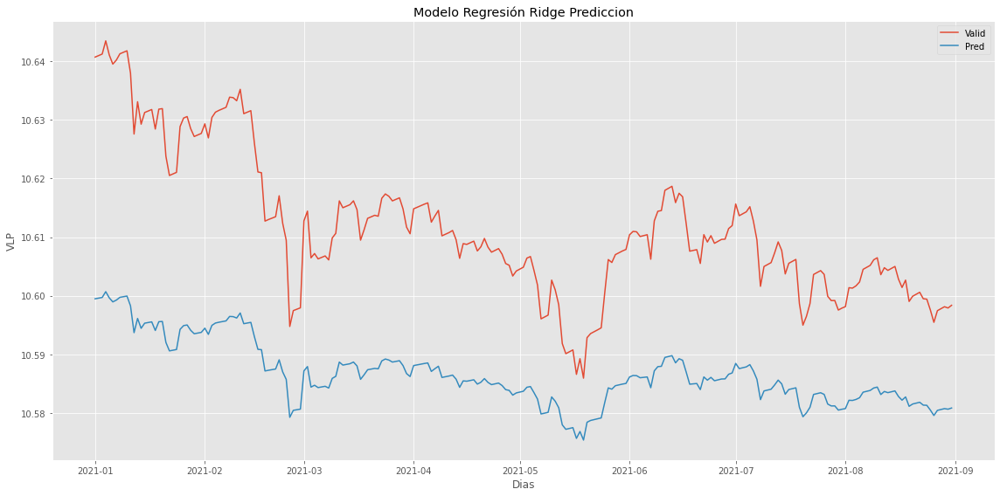

In [86]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

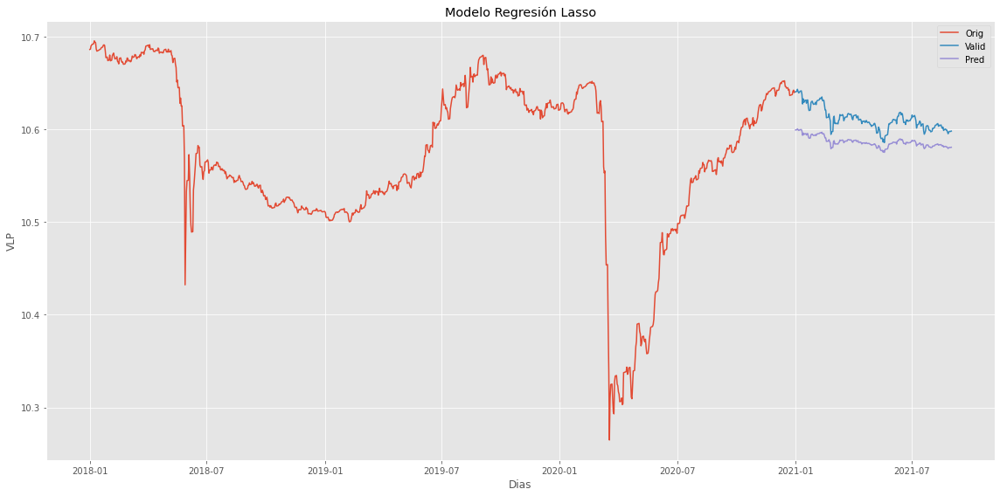

In [87]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Eur_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

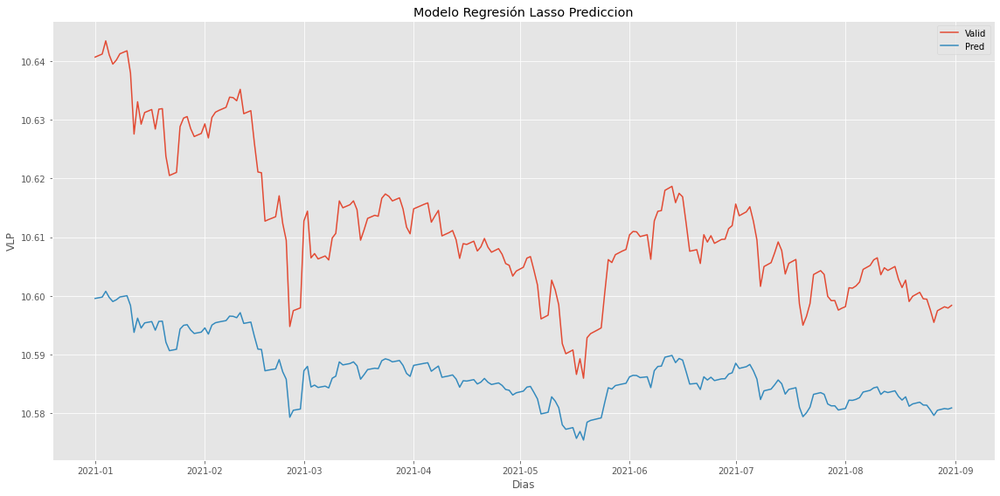

In [88]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [89]:
from sklearn.metrics import mean_squared_error #MSE
from sklearn.metrics import mean_absolute_error #MAE
from sklearn.metrics import r2_score #R2
from math import sqrt

# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI1_60 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI1_60 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI1_60 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI1_60 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI1_60 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI1_60 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI1_60 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI1_60 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI1_60 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI1_60 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI1_60 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI1_60 = round(r2_score(X_test,Lasso_pred),5)

In [90]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',mse_lr_FI1_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_lr_FI1_60)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es:',mae_lr_FI1_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es:',r2_lr_FI1_60)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 60 días es:',mse_r_FI1_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_r_FI1_60)
print('El Error Absoluto Medio para el Modelo de Ridge de 60 días es:',mae_r_FI1_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es:',r2_r_FI1_60)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 60 días es:',mse_l_FI1_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_l_FI1_60)
print('El Error Absoluto Medio para el Modelo de Lasso de 60 días es:',mae_l_FI1_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es:',r2_l_FI1_60)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 0.00066
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 0.02576
El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es: 0.02484
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es: -3.4614
El Error Cuadrático Medio para el Modelo de Ridge de 60 días es: 0.00067
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 0.0258
El Error Absoluto Medio para el Modelo de Ridge de 60 días es: 0.02488
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es: -3.4756
El Error Cuadrático Medio para el Modelo de Lasso de 60 días es: 0.00066
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 0.02576
El Error Absoluto Medio para el Modelo de Lasso de 60 días es: 0.02484
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es: -3.4614


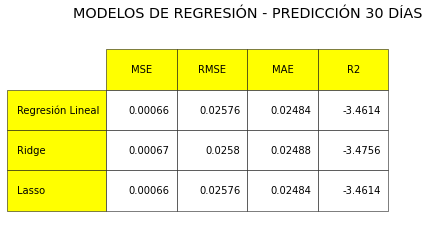

In [91]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI1_60 = [[mse_lr_FI1_60,rmse_lr_FI1_60,mae_lr_FI1_60,r2_lr_FI1_60],
               [mse_r_FI1_60,rmse_r_FI1_60,mae_r_FI1_60,r2_r_FI1_60],
               [mse_l_FI1_60,rmse_l_FI1_60,mae_l_FI1_60,r2_l_FI1_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI1_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

### **2. Fondo de Renta Fija Internacional: CaixaBank Bonos Internacional, FI Clase Universal**

#### *PREDICCIONES A 30 DÍAS*

In [92]:
FI_RF_Int_df_Reg_30 = FI_RF_Int_df
FI_RF_Int_df_Reg_30.set_index('Fecha', inplace=True)

In [93]:
FI_RF_Int_df_Reg_30.head()

,VLP,Rentabilidad_diaria,Rentabilidad
Fecha,,,
2018-01-01,9.852598,0.000000,0.000000
2018-01-02,9.847738,-0.049328,-0.049328
2018-01-03,9.864722,0.172470,0.123141
2018-01-04,9.855346,-0.095046,0.028095
2018-01-05,9.864678,0.094683,0.122778


In [94]:
FI_RF_Int_df_Reg_30.shape

(1339, 3)

In [95]:
FI_RF_Int_df_Reg_30.isnull().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [96]:
FI_RF_Int_df_Reg_30.isna().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [97]:
FI_RF_Int_df_Reg_30.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
dtypes: float64(3)
memory usage: 41.8 KB


In [98]:
FI_RF_Int_df_Reg_30.describe()

,VLP,Rentabilidad_diaria,Rentabilidad
count,1339.000000,1339.000000,1339.000000
mean,10.077198,0.002826,2.280483
std,0.238772,0.129337,2.410979
min,9.631683,-1.133812,-2.257418
25%,9.795376,-0.038684,-0.564142
50%,10.147120,-0.002184,3.049772
75%,10.276709,0.048687,4.300152
max,10.478902,0.609428,6.212951


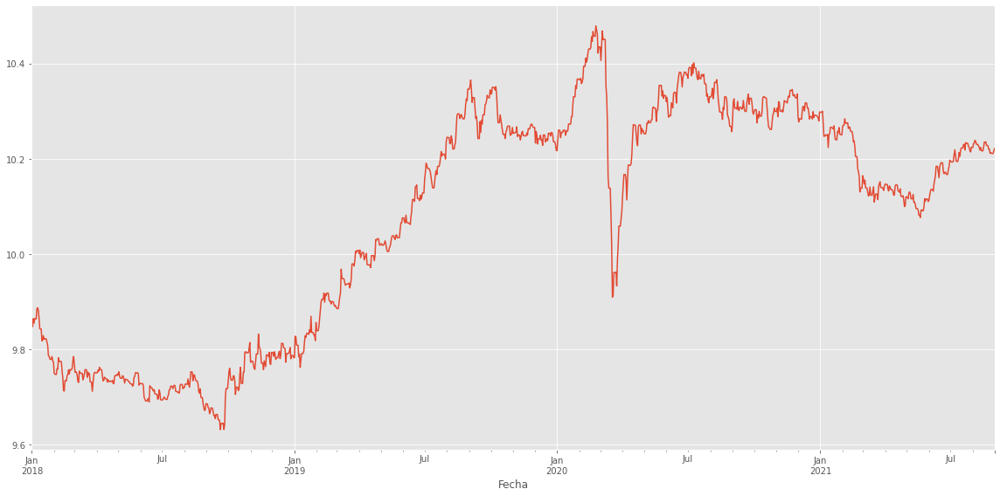

In [99]:
FI_RF_Int_df_Reg_30['VLP'].plot(figsize=(16,8))

In [100]:
# Creación nueva variable para predecir 30 días en el futuro
dias_futuros = 30

# Creación de nueva columna (target) desplazada 30 días más tarde
FI_RF_Int_df_Reg_30['Prediccion']=FI_RF_Int_df_Reg_30[['VLP']].shift(-dias_futuros)
FI_RF_Int_df_Reg_30

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,9.852598,0.000000,0.000000,9.774000
2018-01-02,9.847738,-0.049328,-0.049328,9.751308
2018-01-03,9.864722,0.172470,0.123141,9.748068
2018-01-04,9.855346,-0.095046,0.028095,9.747711
2018-01-05,9.864678,0.094683,0.122778,9.747354
...,...,...,...,...
2021-08-27,10.211331,-0.015280,3.688312,NaN
2021-08-28,10.211084,-0.002418,3.685894,NaN
2021-08-29,10.210837,-0.002418,3.683476,NaN


In [101]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 30 días
X = np.array(FI_RF_Int_df_Reg_30.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [102]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 30
y = np.array(FI_RF_Int_df_Reg_30['Prediccion'])

In [103]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [104]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [105]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[10.29402811 10.29382042 10.29361275 10.29552722 10.27369612 10.2464112
 10.246636   10.24888784 10.24868116 10.24847448 10.25020379 10.22454336
 10.24936253 10.25120801 10.26410778 10.26390186 10.26369596 10.26250872
 10.26099422 10.26708784 10.24859086 10.23996879 10.23976184 10.23955491
 10.25597226 10.25417386 10.26374391 10.25081507 10.24971656 10.24951211
 10.24930767 10.26681348 10.26796686 10.26847242 10.28074151 10.27247327
 10.27226843 10.27206357 10.27322914 10.2617877  10.26397899 10.26462014
 10.25640771 10.25622583 10.2560335  10.24954399 10.2356717  10.23764364
 10.22559862 10.20674822 10.20655761 10.2063453  10.18285213 10.17673869
 10.16867621 10.13720721 10.14500201 10.14478594 10.14456993 10.16929287
 10.16270998 10.15288559 10.16018821 10.14529828 10.14507843 10.14485855
 10.1356832  10.12903229 10.13229711 10.14686624 10.13102054 10.13080597
 10.13059132 10.13892107 10.14736062 10.11734579 10.12659742 10.13324392
 10.13302952 10.13281523 10.12218875 10.14753408 10.

In [106]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [107]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [108]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,10.294028
2021-01-02,10.293820
2021-01-03,10.293613
2021-01-04,10.295527
2021-01-05,10.273696
...,...
2021-08-27,10.212986
2021-08-28,10.212755
2021-08-29,10.212524
2021-08-30,10.216691


In [109]:
Pred_vs_orig_df = FI_RF_Int_df_Reg_30.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [110]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,10.297916,-0.002065,4.522820,10.250137,10.294028,10.293954,10.294028
2021-01-02,10.297694,-0.002155,4.520665,10.268840,10.293820,10.293746,10.293820
2021-01-03,10.297472,-0.002155,4.518511,10.270072,10.293613,10.293539,10.293613
2021-01-04,10.299517,0.019863,4.538374,10.270612,10.295527,10.295452,10.295527
2021-01-05,10.276193,-0.226459,4.311915,10.283720,10.273696,10.273628,10.273696
...,...,...,...,...,...,...,...
2021-08-27,10.211331,-0.015280,3.688312,NaN,10.212986,10.212938,10.212986
2021-08-28,10.211084,-0.002418,3.685894,NaN,10.212755,10.212707,10.212755
2021-08-29,10.210837,-0.002418,3.683476,NaN,10.212524,10.212476,10.212524
2021-08-30,10.215289,0.043603,3.727079,NaN,10.216691,10.216642,10.216691


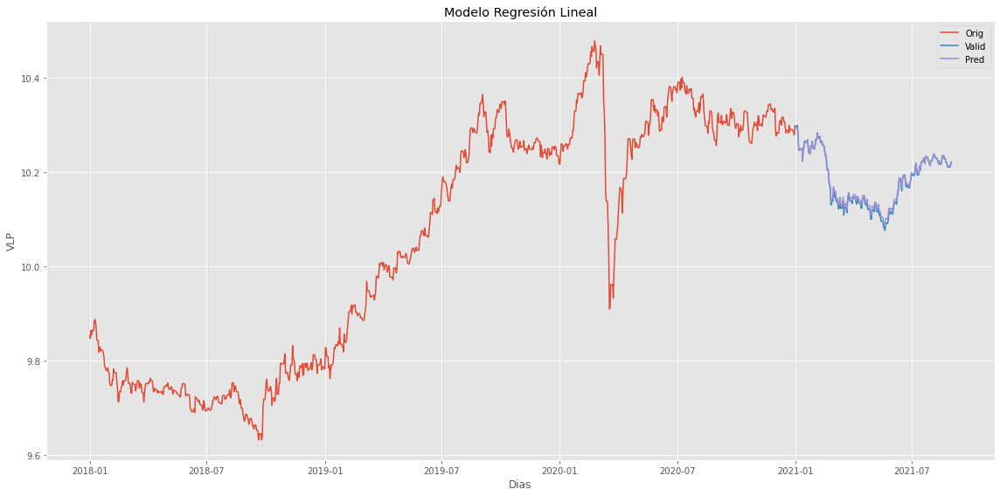

In [111]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Int_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

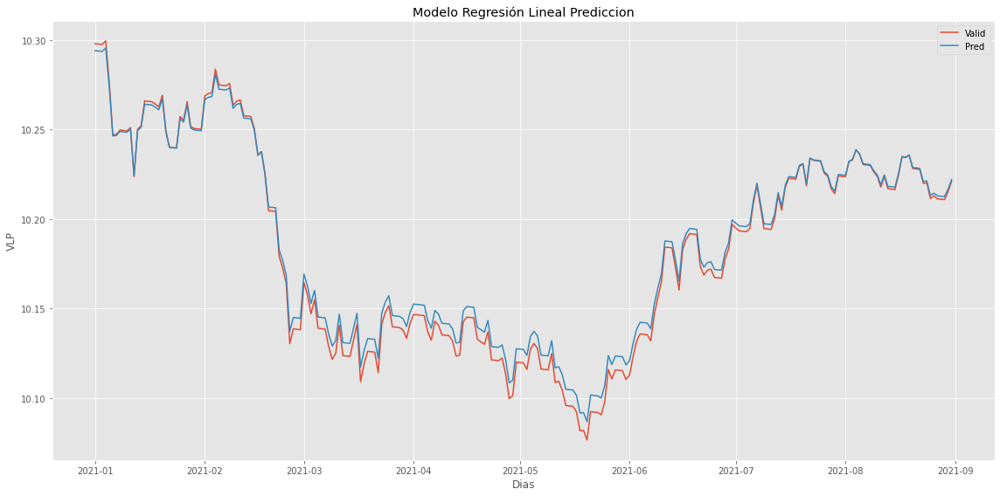

In [112]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

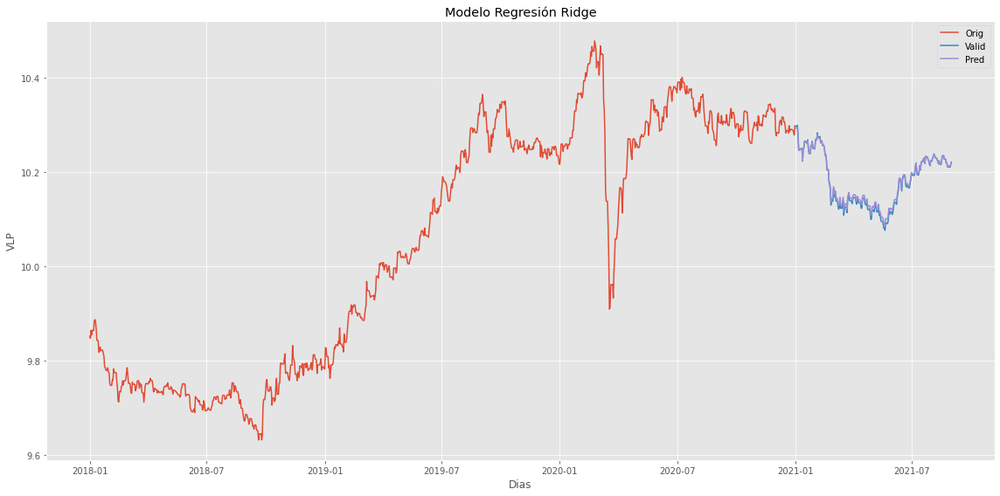

In [113]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Int_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

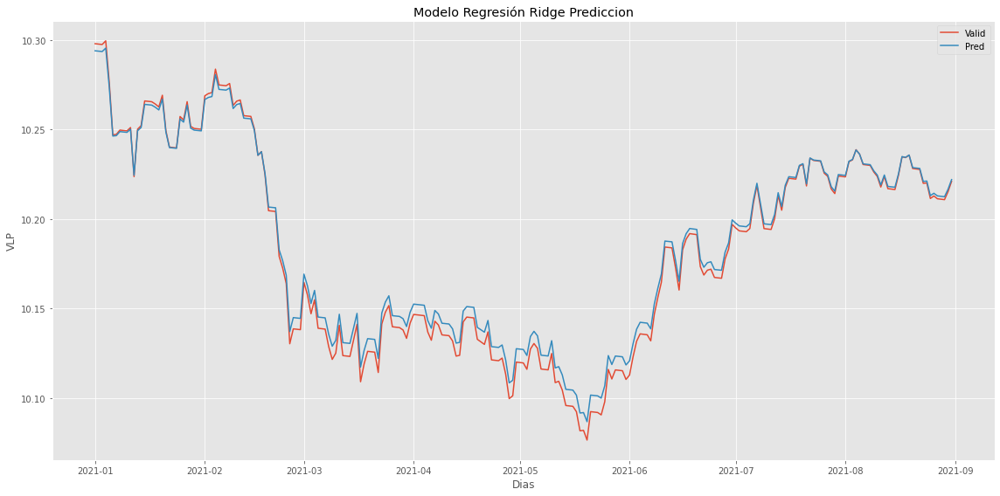

In [114]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

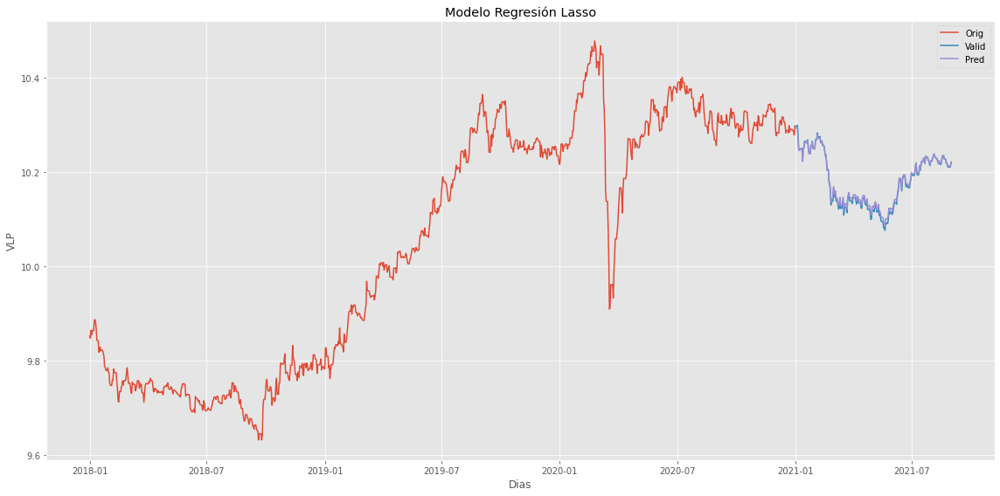

In [115]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Int_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

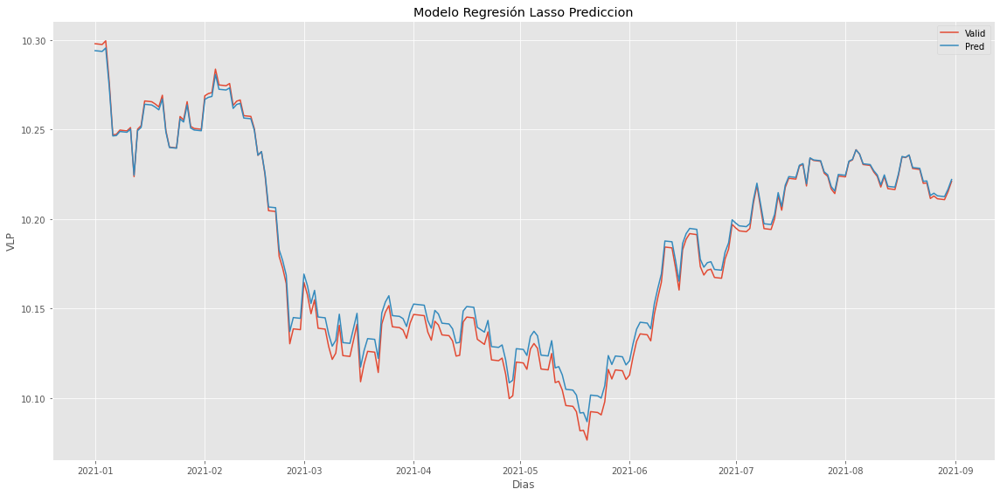

In [116]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [117]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI2_30 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI2_30 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI2_30 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI2_30 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI2_30 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI2_30 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI2_30 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI2_30 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI2_30 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI2_30 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI2_30 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI2_30 = round(r2_score(X_test,Lasso_pred),5)

In [118]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',mse_lr_FI2_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_lr_FI2_30)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es:',mae_lr_FI2_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es:',r2_lr_FI2_30)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 30 días es:',mse_r_FI2_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_r_FI2_30)
print('El Error Absoluto Medio para el Modelo de Ridge de 30 días es:',mae_r_FI2_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es:',r2_r_FI2_30)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 30 días es:',mse_l_FI2_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_l_FI2_30)
print('El Error Absoluto Medio para el Modelo de Lasso de 30 días es:',mae_l_FI2_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es:',r2_l_FI2_30)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 3e-05
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.00503
El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es: 0.00409
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es: 0.9921
El Error Cuadrático Medio para el Modelo de Ridge de 30 días es: 3e-05
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.00501
El Error Absoluto Medio para el Modelo de Ridge de 30 días es: 0.00408
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es: 0.99214
El Error Cuadrático Medio para el Modelo de Lasso de 30 días es: 3e-05
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.00503
El Error Absoluto Medio para el Modelo de Lasso de 30 días es: 0.00409
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es: 0.9921


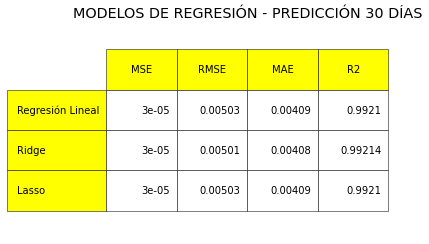

In [119]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI2_30 = [[mse_lr_FI2_30,rmse_lr_FI2_30,mae_lr_FI2_30,r2_lr_FI2_30],
               [mse_r_FI2_30,rmse_r_FI2_30,mae_r_FI2_30,r2_r_FI2_30],
               [mse_l_FI2_30,rmse_l_FI2_30,mae_l_FI2_30,r2_l_FI2_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI2_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [120]:
FI_RF_Int_df_Reg_60 = FI_RF_Int_df

In [121]:
FI_RF_Int_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,9.852598,0.000000,0.000000,9.774000
2018-01-02,9.847738,-0.049328,-0.049328,9.751308
2018-01-03,9.864722,0.172470,0.123141,9.748068
2018-01-04,9.855346,-0.095046,0.028095,9.747711
2018-01-05,9.864678,0.094683,0.122778,9.747354
...,...,...,...,...
2021-08-27,10.211331,-0.015280,3.688312,NaN
2021-08-28,10.211084,-0.002418,3.685894,NaN
2021-08-29,10.210837,-0.002418,3.683476,NaN


In [122]:
FI_RF_Int_df_Reg_60.head()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,9.852598,0.000000,0.000000,9.774000
2018-01-02,9.847738,-0.049328,-0.049328,9.751308
2018-01-03,9.864722,0.172470,0.123141,9.748068
2018-01-04,9.855346,-0.095046,0.028095,9.747711
2018-01-05,9.864678,0.094683,0.122778,9.747354


In [123]:
FI_RF_Int_df_Reg_60.shape

(1339, 4)

In [124]:
FI_RF_Int_df_Reg_60.isnull().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [125]:
FI_RF_Int_df_Reg_60.isna().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [126]:
FI_RF_Int_df_Reg_60.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
 3   Prediccion           1309 non-null   float64
dtypes: float64(4)
memory usage: 92.3 KB


In [127]:
FI_RF_Int_df_Reg_60.describe()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
count,1339.000000,1339.000000,1339.000000,1309.000000
mean,10.077198,0.002826,2.280483,10.082851
std,0.238772,0.129337,2.410979,0.238466
min,9.631683,-1.133812,-2.257418,9.631683
25%,9.795376,-0.038684,-0.564142,9.795221
50%,10.147120,-0.002184,3.049772,10.164649
75%,10.276709,0.048687,4.300152,10.280138
max,10.478902,0.609428,6.212951,10.478902


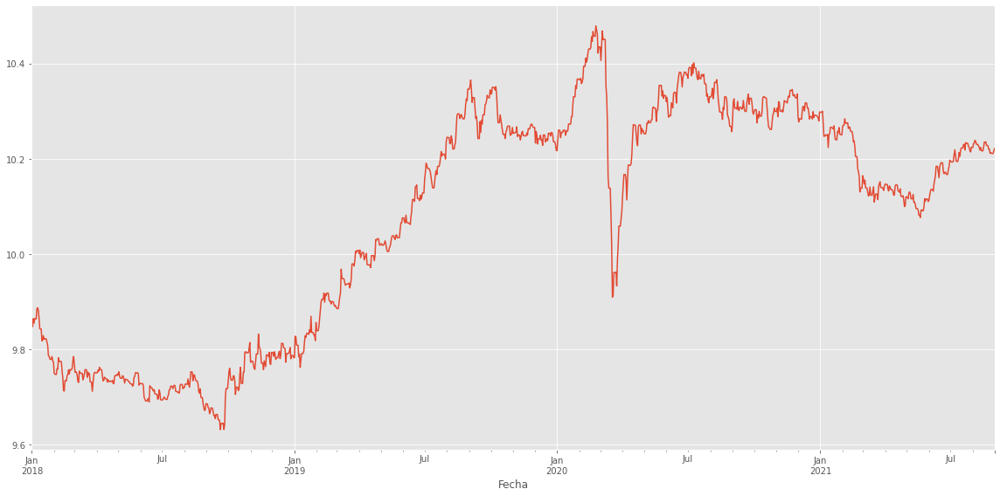

In [128]:
FI_RF_Int_df_Reg_60['VLP'].plot(figsize=(16,8))

In [129]:
# Creación nueva variable para predecir 60 días en el futuro
dias_futuros = 60

# Creación de nueva columna (target) desplazada 60 días más tarde
FI_RF_Int_df_Reg_60['Prediccion']=FI_RF_Int_df_Reg_60[['VLP']].shift(-dias_futuros)
FI_RF_Int_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,9.852598,0.000000,0.000000,9.752060
2018-01-02,9.847738,-0.049328,-0.049328,9.752667
2018-01-03,9.864722,0.172470,0.123141,9.752310
2018-01-04,9.855346,-0.095046,0.028095,9.746502
2018-01-05,9.864678,0.094683,0.122778,9.732445
...,...,...,...,...
2021-08-27,10.211331,-0.015280,3.688312,NaN
2021-08-28,10.211084,-0.002418,3.685894,NaN
2021-08-29,10.210837,-0.002418,3.683476,NaN


In [130]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 60 días
X = np.array(FI_RF_Int_df_Reg_60.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [131]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 60
y = np.array(FI_RF_Int_df_Reg_60['Prediccion'])

In [132]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [133]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [134]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[10.29716636 10.29696755 10.29676875 10.2986014  10.27770348 10.25158486
 10.25180005 10.25395563 10.25375779 10.25355994 10.25521533 10.23065177
 10.25441003 10.25617663 10.26852499 10.26832788 10.26813078 10.26699429
 10.26554452 10.27137766 10.25367135 10.24541783 10.24521973 10.24502164
 10.26073723 10.2590157  10.26817667 10.25580049 10.25474893 10.25455322
 10.25435752 10.27111504 10.27221911 10.27270307 10.2844477  10.27653289
 10.27633681 10.2761407  10.27725646 10.26630409 10.2684017  10.26901545
 10.26115407 10.26097996 10.26079585 10.25458373 10.24130442 10.24319208
 10.23166193 10.21361729 10.21343483 10.21323159 10.19074265 10.18489053
 10.17717269 10.14704884 10.15451046 10.15430362 10.15409685 10.17776299
 10.17146149 10.16205705 10.16904751 10.15479406 10.1545836  10.15437313
 10.14558998 10.13922337 10.14234863 10.156295   10.14112663 10.14092123
 10.14071575 10.14868945 10.15676825 10.12803641 10.13689257 10.14325497
 10.14304973 10.1428446  10.13267235 10.15693429 10

In [135]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [136]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [137]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,10.297166
2021-01-02,10.296968
2021-01-03,10.296769
2021-01-04,10.298601
2021-01-05,10.277703
...,...
2021-08-27,10.219589
2021-08-28,10.219367
2021-08-29,10.219146
2021-08-30,10.223135


In [138]:
Pred_vs_orig_df = FI_RF_Int_df_Reg_60.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [139]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,10.297916,-0.002065,4.522820,10.157616,10.297166,10.297112,10.297166
2021-01-02,10.297694,-0.002155,4.520665,10.147120,10.296968,10.296914,10.296968
2021-01-03,10.297472,-0.002155,4.518511,10.154922,10.296769,10.296715,10.296769
2021-01-04,10.299517,0.019863,4.538374,10.139014,10.298601,10.298547,10.298601
2021-01-05,10.276193,-0.226459,4.311915,10.138779,10.277703,10.277654,10.277703
...,...,...,...,...,...,...,...
2021-08-27,10.211331,-0.015280,3.688312,NaN,10.219589,10.219554,10.219589
2021-08-28,10.211084,-0.002418,3.685894,NaN,10.219367,10.219333,10.219367
2021-08-29,10.210837,-0.002418,3.683476,NaN,10.219146,10.219111,10.219146
2021-08-30,10.215289,0.043603,3.727079,NaN,10.223135,10.223099,10.223135


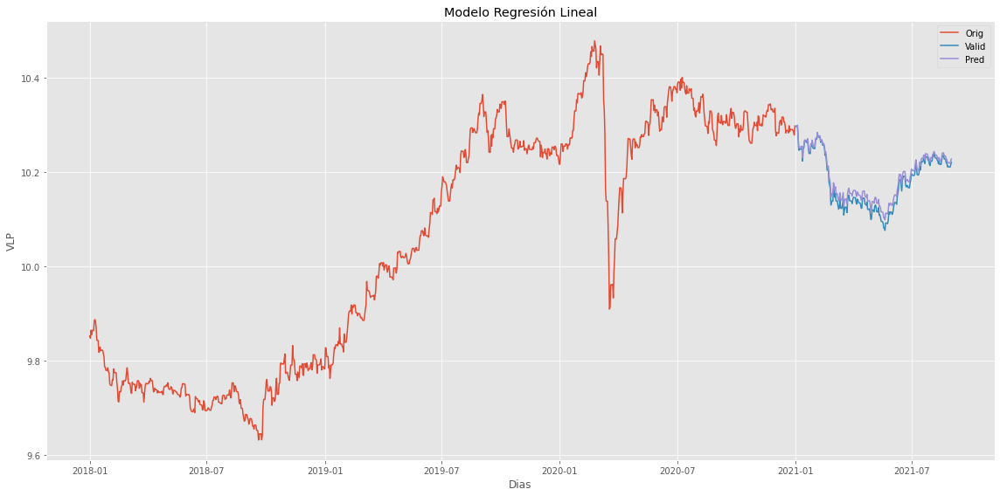

In [140]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Int_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

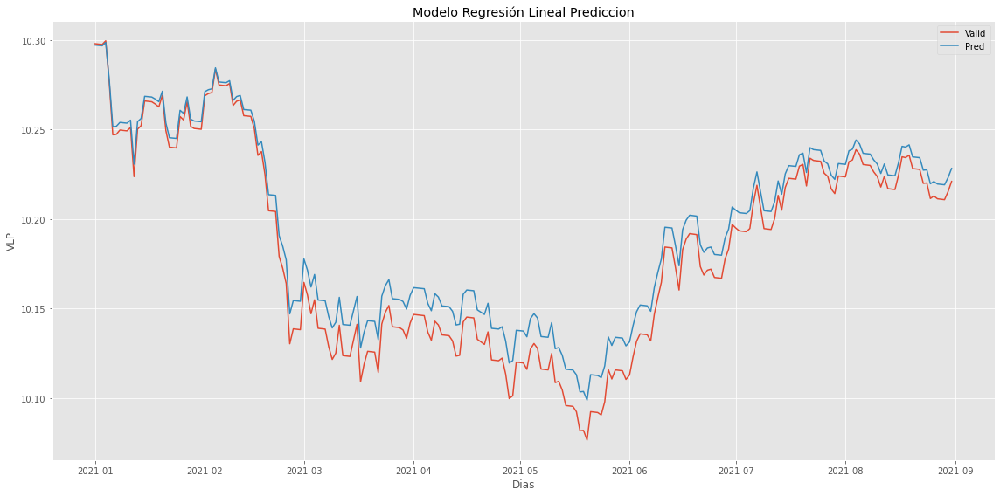

In [141]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

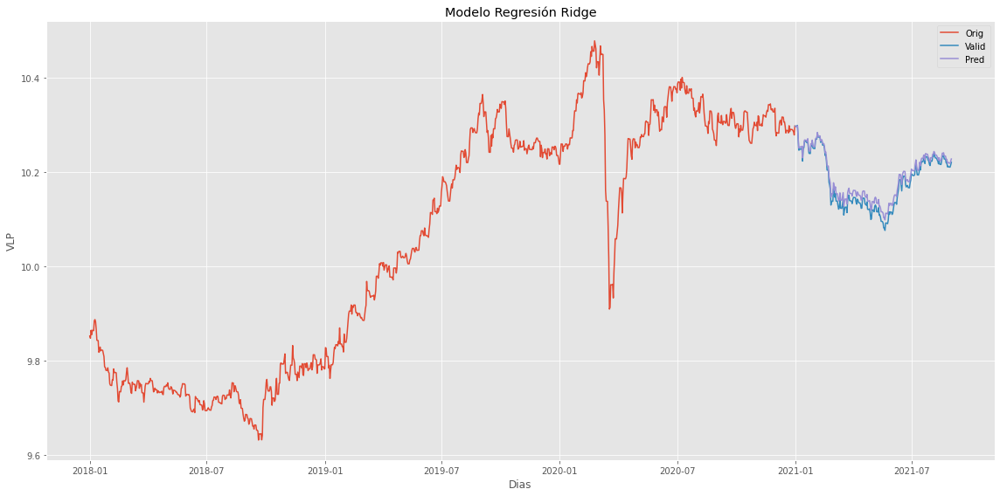

In [142]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Int_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

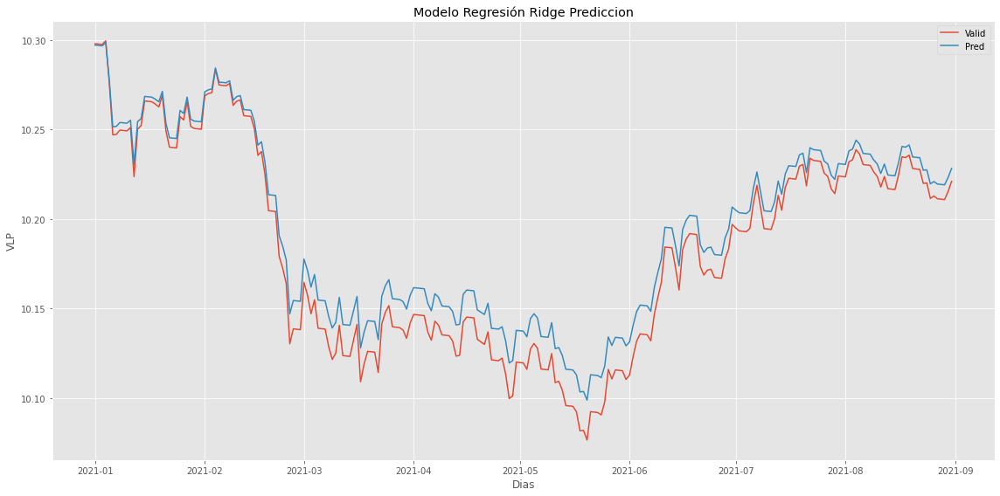

In [143]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

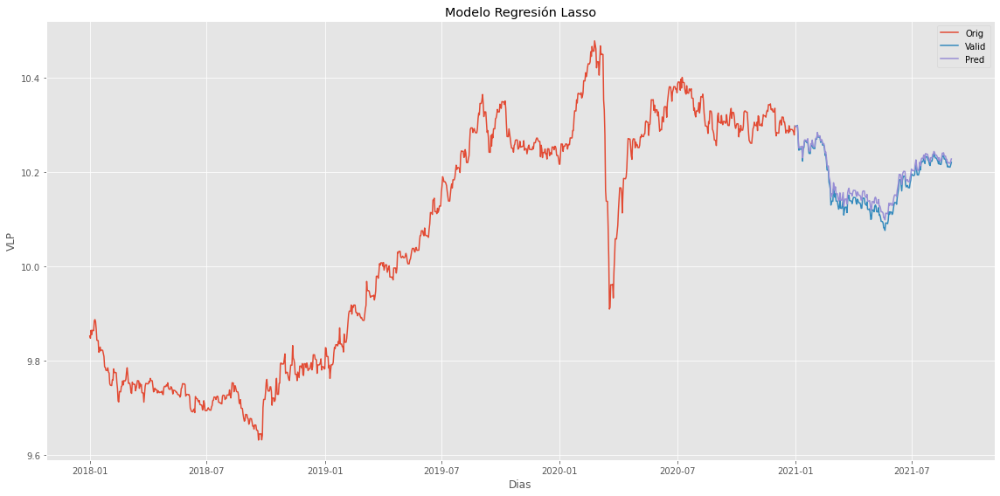

In [144]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RF_Int_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

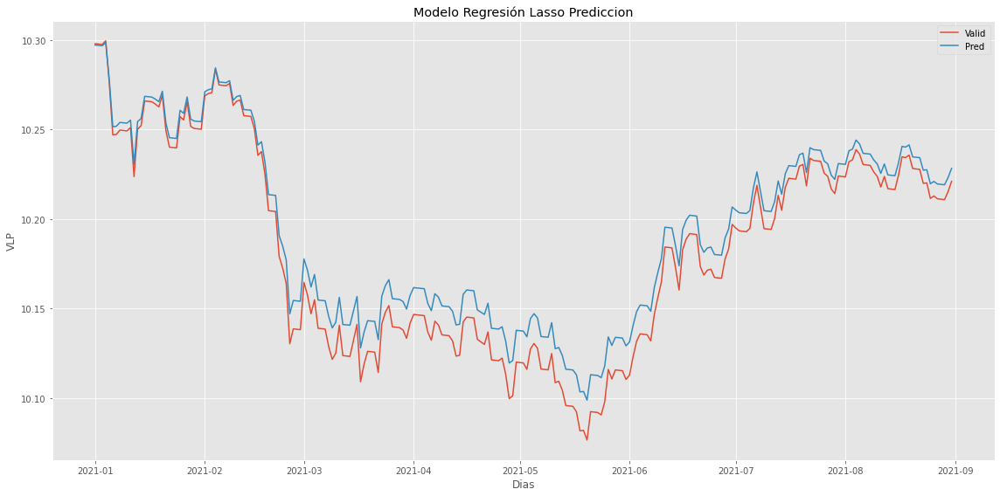

In [145]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [146]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI2_60 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI2_60 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI2_60 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI2_60 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI2_60 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI2_60 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI2_60 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI2_60 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI2_60 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI2_60 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI2_60 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI2_60 = round(r2_score(X_test,Lasso_pred),5)

In [147]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',mse_lr_FI2_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_lr_FI2_60)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es:',mae_lr_FI2_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es:',r2_lr_FI2_60)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 60 días es:',mse_r_FI2_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_r_FI2_60)
print('El Error Absoluto Medio para el Modelo de Ridge de 60 días es:',mae_r_FI2_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es:',r2_r_FI2_60)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 60 días es:',mse_l_FI2_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_l_FI2_60)
print('El Error Absoluto Medio para el Modelo de Lasso de 60 días es:',mae_l_FI2_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es:',r2_l_FI2_60)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 0.00016
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 0.01268
El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es: 0.01126
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es: 0.94971
El Error Cuadrático Medio para el Modelo de Ridge de 60 días es: 0.00016
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 0.01266
El Error Absoluto Medio para el Modelo de Ridge de 60 días es: 0.01124
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es: 0.94986
El Error Cuadrático Medio para el Modelo de Lasso de 60 días es: 0.00016
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 0.01268
El Error Absoluto Medio para el Modelo de Lasso de 60 días es: 0.01126
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es: 0.94971


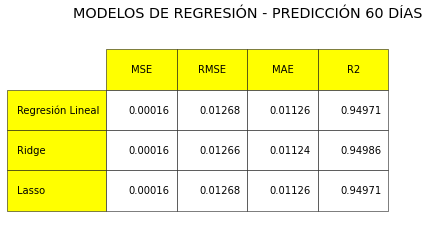

In [548]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI2_60 = [[mse_lr_FI2_60,rmse_lr_FI2_60,mae_lr_FI2_60,r2_lr_FI2_60],
               [mse_r_FI2_60,rmse_r_FI2_60,mae_r_FI2_60,r2_r_FI2_60],
               [mse_l_FI2_60,rmse_l_FI2_60,mae_l_FI2_60,r2_l_FI2_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI2_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

### **3. Fondo de Gestión Alternativa: CaixaBank Gestion Activa, FI**

#### *PREDICCIONES A 30 DÍAS*

In [149]:
FI_Gest_Alt_df_Reg_30 = FI_Gest_Alt_df
FI_Gest_Alt_df_Reg_30.set_index('Fecha', inplace=True)

In [150]:
FI_Gest_Alt_df_Reg_30.head()

,VLP,Rentabilidad_diaria,Rentabilidad
Fecha,,,
2018-01-01,98.921245,0.000000,0.000000
2018-01-02,98.947850,0.026895,0.026895
2018-01-03,99.027256,0.080250,0.107145
2018-01-04,99.075056,0.048270,0.155415
2018-01-05,99.118364,0.043712,0.199127


In [151]:
FI_Gest_Alt_df_Reg_30.shape

(1339, 3)

In [152]:
FI_Gest_Alt_df_Reg_30.isnull().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [153]:
FI_Gest_Alt_df_Reg_30.isna().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [154]:
FI_Gest_Alt_df_Reg_30.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
dtypes: float64(3)
memory usage: 41.8 KB


In [155]:
FI_Gest_Alt_df_Reg_30.describe()

,VLP,Rentabilidad_diaria,Rentabilidad
count,1339.000000,1339.000000,1339.000000
mean,96.593232,-0.000013,-2.340617
std,1.743490,0.147041,1.811832
min,88.407374,-2.215316,-11.129301
25%,96.024841,-0.017848,-2.957609
50%,96.917383,-0.002241,-2.042852
75%,97.842198,0.031522,-1.040871
max,99.280907,0.903227,0.363045


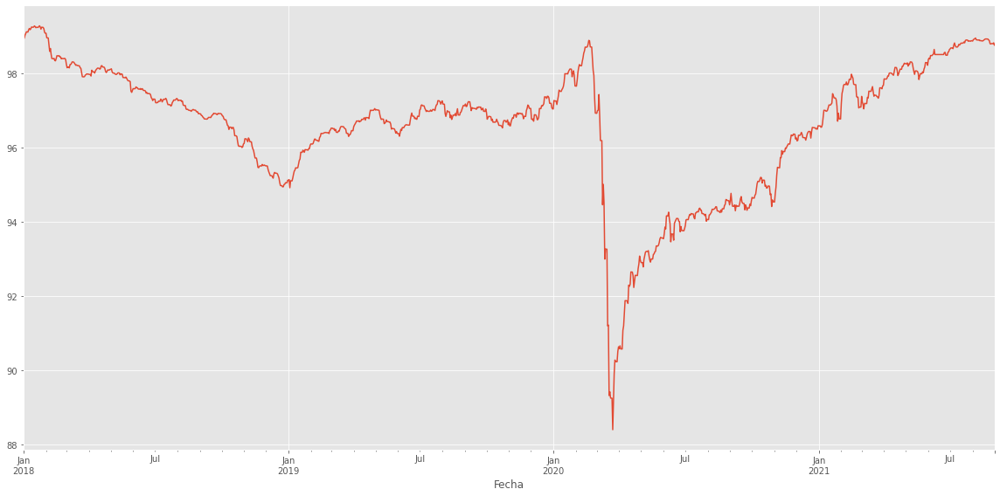

In [156]:
FI_Gest_Alt_df_Reg_30['VLP'].plot(figsize=(16,8))

In [157]:
# Creación nueva variable para predecir 30 días en el futuro
dias_futuros = 30

# Creación de nueva columna (target) desplazada 30 días más tarde
FI_Gest_Alt_df_Reg_30['Prediccion']=FI_Gest_Alt_df_Reg_30[['VLP']].shift(-dias_futuros)
FI_Gest_Alt_df_Reg_30

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,98.921245,0.000000,0.000000,99.079718
2018-01-02,98.947850,0.026895,0.026895,99.080262
2018-01-03,99.027256,0.080250,0.107145,98.957880
2018-01-04,99.075056,0.048270,0.155415,98.955356
2018-01-05,99.118364,0.043712,0.199127,98.952832
...,...,...,...,...
2021-08-27,98.802627,0.011859,0.025637,NaN
2021-08-28,98.801194,-0.001450,0.024187,NaN
2021-08-29,98.799762,-0.001449,0.022737,NaN


In [158]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 30 días
X = np.array(FI_Gest_Alt_df_Reg_30.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [159]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 30
y = np.array(FI_Gest_Alt_df_Reg_30['Prediccion'])

In [160]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [161]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [162]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[96.4207822  96.41925694 96.41773168 96.39537554 96.4001351  96.45440365
 96.58217737 96.69933065 96.6977961  96.69626221 96.68162526 96.68325402
 96.70133293 96.74783385 96.79410788 96.79258195 96.79105536 96.80874018
 96.82597518 96.99541728 96.96089222 96.92033179 96.91878596 96.91723946
 96.88525275 96.77521692 96.50318551 96.64528899 96.54546824 96.54392042
 96.54237194 96.81886237 97.00081839 97.0574163  97.14055935 97.16117792
 97.15962148 97.1580657  97.20434503 97.15242442 97.1561019  97.19422682
 97.25199571 97.25043064 97.24891931 97.34329449 97.30235192 97.27527271
 97.16534303 97.15839078 97.15685159 97.15534225 96.94576698 96.93039692
 96.9335118  96.74127171 96.75791359 96.7563724  96.75483188 96.94723319
 96.84355251 96.80064216 96.72378261 96.82171121 96.8201614  96.81861292
 96.81882655 96.92898511 96.91737481 97.04034849 97.03960676 97.03803572
 97.03646468 97.08138528 97.1216319  97.02675316 96.94983589 96.96842233
 96.96687451 96.96532802 96.94526674 96.9358332  96

In [163]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [164]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [165]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,96.420782
2021-01-02,96.419257
2021-01-03,96.417732
2021-01-04,96.395376
2021-01-05,96.400135
...,...
2021-08-27,97.890524
2021-08-28,97.889573
2021-08-29,97.888623
2021-08-30,97.903558


In [166]:
Pred_vs_orig_df = FI_Gest_Alt_df_Reg_30.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [167]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,96.587312,-0.002327,-2.250747,96.770582,96.420782,96.420306,96.410078
2021-01-02,96.585013,-0.002380,-2.253127,97.187331,96.419257,96.418784,96.408631
2021-01-03,96.582714,-0.002380,-2.255507,97.461590,96.417732,96.417263,96.407183
2021-01-04,96.549017,-0.034889,-2.290396,97.546899,96.395376,96.394957,96.385968
2021-01-05,96.556191,0.007430,-2.282966,97.672219,96.400135,96.399706,96.390484
...,...,...,...,...,...,...,...
2021-08-27,98.802627,0.011859,0.025637,NaN,97.890524,97.886713,97.804838
2021-08-28,98.801194,-0.001450,0.024187,NaN,97.889573,97.885765,97.803935
2021-08-29,98.799762,-0.001449,0.022737,NaN,97.888623,97.884817,97.803034
2021-08-30,98.822273,0.022784,0.045522,NaN,97.903558,97.899718,97.817207


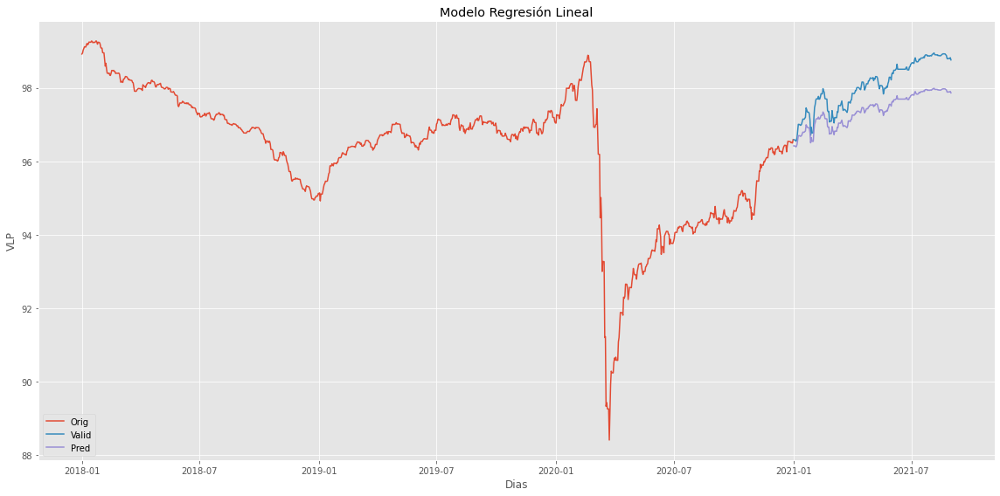

In [168]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_Gest_Alt_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

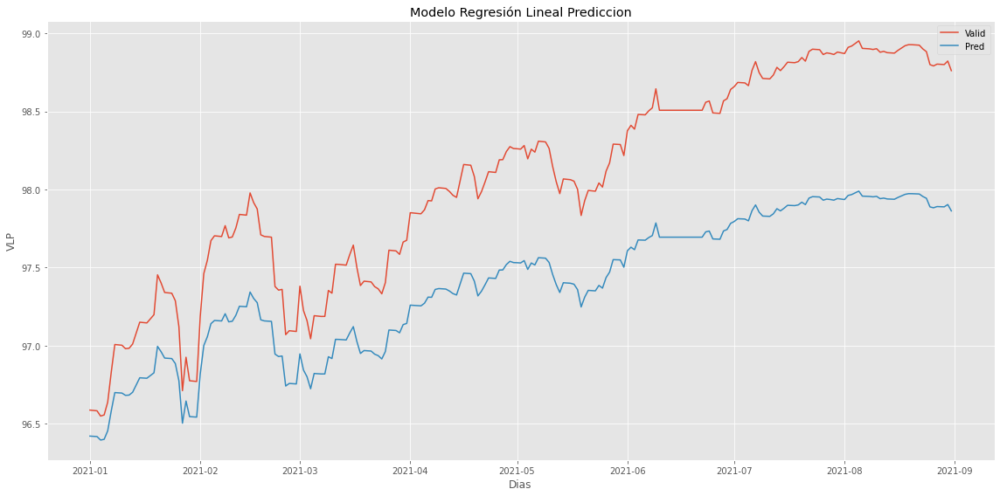

In [169]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

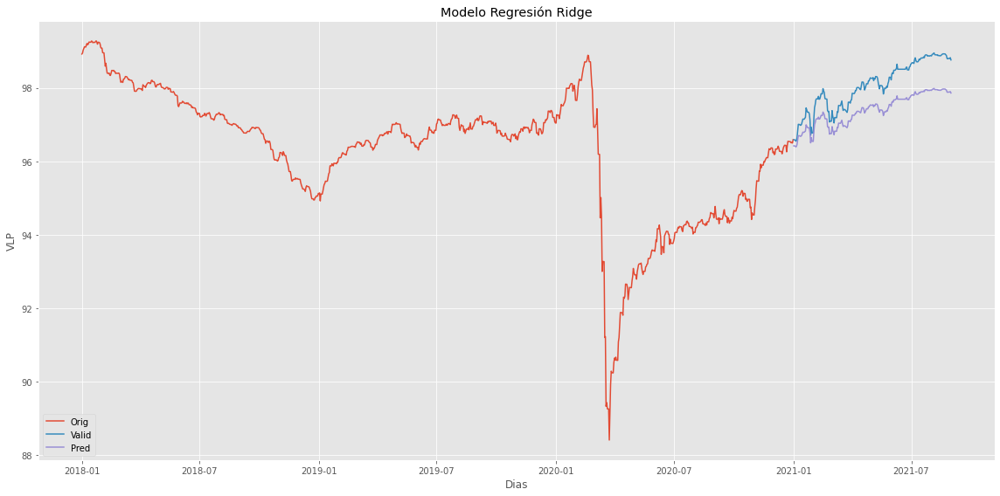

In [170]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_Gest_Alt_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

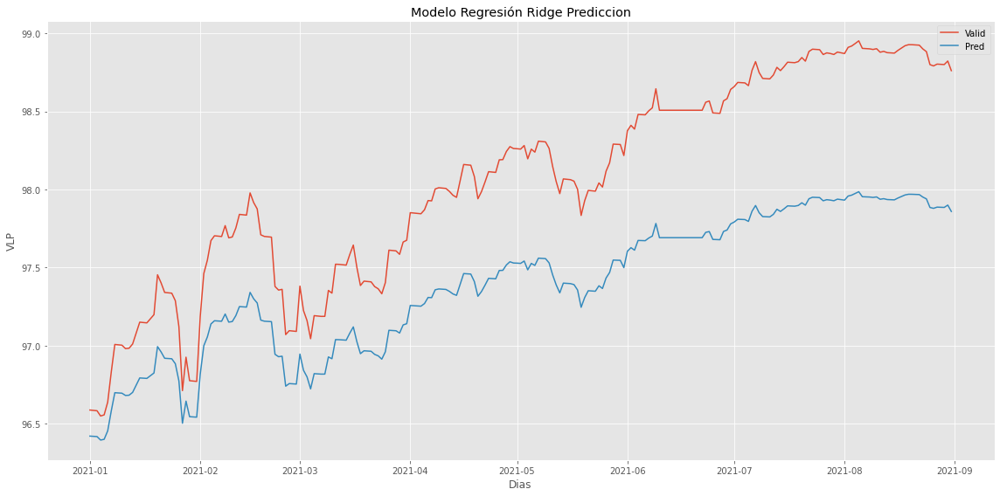

In [171]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

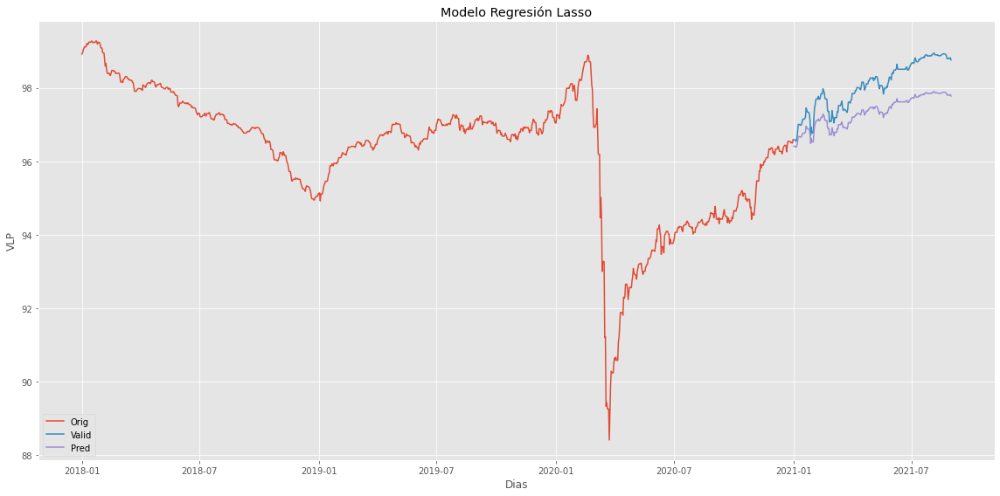

In [172]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_Gest_Alt_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

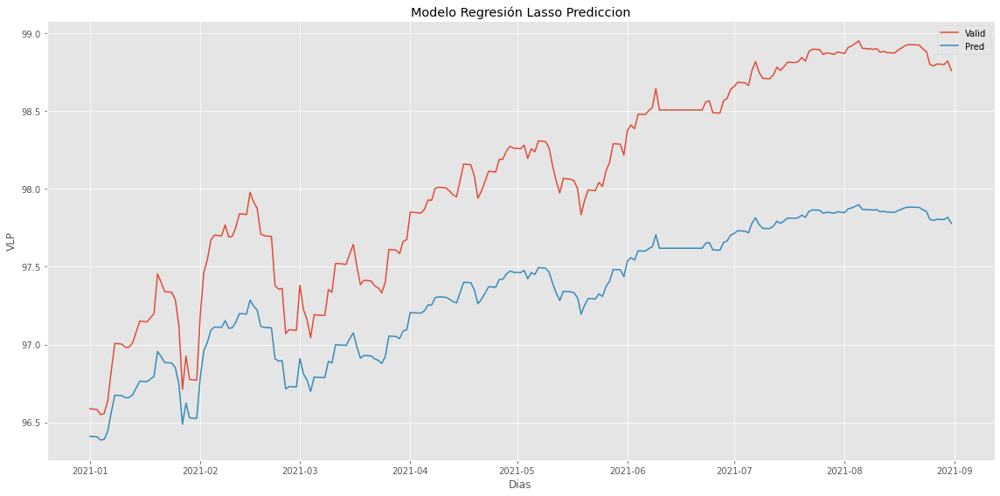

In [173]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [174]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI3_30 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI3_30 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI3_30 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI3_30 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI3_30 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI3_30 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI3_30 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI3_30 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI3_30 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI3_30 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI3_30 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI3_30 = round(r2_score(X_test,Lasso_pred),5)

In [175]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',mse_lr_FI3_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_lr_FI3_30)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es:',mae_lr_FI3_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es:',r2_lr_FI3_30)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 30 días es:',mse_r_FI3_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_r_FI3_30)
print('El Error Absoluto Medio para el Modelo de Ridge de 30 días es:',mae_r_FI3_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es:',r2_r_FI3_30)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 30 días es:',mse_l_FI3_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_l_FI3_30)
print('El Error Absoluto Medio para el Modelo de Lasso de 30 días es:',mae_l_FI3_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es:',r2_l_FI3_30)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.48152
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.69392
El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es: 0.65756
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es: -0.10985
El Error Cuadrático Medio para el Modelo de Ridge de 30 días es: 0.48549
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.69677
El Error Absoluto Medio para el Modelo de Ridge de 30 días es: 0.66023
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es: -0.11898
El Error Cuadrático Medio para el Modelo de Lasso de 30 días es: 0.57454
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.75798
El Error Absoluto Medio para el Modelo de Lasso de 30 días es: 0.71764
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es: -0.32423


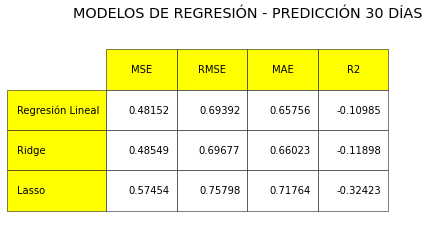

In [176]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI3_30 = [[mse_lr_FI3_30,rmse_lr_FI3_30,mae_lr_FI3_30,r2_lr_FI3_30],
               [mse_r_FI3_30,rmse_r_FI3_30,mae_r_FI3_30,r2_r_FI3_30],
               [mse_l_FI3_30,rmse_l_FI3_30,mae_l_FI3_30,r2_l_FI3_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI3_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [177]:
FI_Gest_Alt_df_Reg_60 = FI_Gest_Alt_df

In [178]:
FI_Gest_Alt_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,98.921245,0.000000,0.000000,99.079718
2018-01-02,98.947850,0.026895,0.026895,99.080262
2018-01-03,99.027256,0.080250,0.107145,98.957880
2018-01-04,99.075056,0.048270,0.155415,98.955356
2018-01-05,99.118364,0.043712,0.199127,98.952832
...,...,...,...,...
2021-08-27,98.802627,0.011859,0.025637,NaN
2021-08-28,98.801194,-0.001450,0.024187,NaN
2021-08-29,98.799762,-0.001449,0.022737,NaN


In [179]:
FI_Gest_Alt_df_Reg_60.head()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,98.921245,0.000000,0.000000,99.079718
2018-01-02,98.947850,0.026895,0.026895,99.080262
2018-01-03,99.027256,0.080250,0.107145,98.957880
2018-01-04,99.075056,0.048270,0.155415,98.955356
2018-01-05,99.118364,0.043712,0.199127,98.952832


In [180]:
FI_Gest_Alt_df_Reg_60.shape

(1339, 4)

In [181]:
FI_Gest_Alt_df_Reg_60.isnull().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [182]:
FI_Gest_Alt_df_Reg_60.isna().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [183]:
FI_Gest_Alt_df_Reg_60.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
 3   Prediccion           1309 non-null   float64
dtypes: float64(4)
memory usage: 92.3 KB


In [184]:
FI_Gest_Alt_df_Reg_60.describe()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
count,1339.000000,1339.000000,1339.000000,1309.000000
mean,96.593232,-0.000013,-2.340617,96.533842
std,1.743490,0.147041,1.811832,1.718061
min,88.407374,-2.215316,-11.129301,88.407374
25%,96.024841,-0.017848,-2.957609,95.948173
50%,96.917383,-0.002241,-2.042852,96.890059
75%,97.842198,0.031522,-1.040871,97.674543
max,99.280907,0.903227,0.363045,99.080262


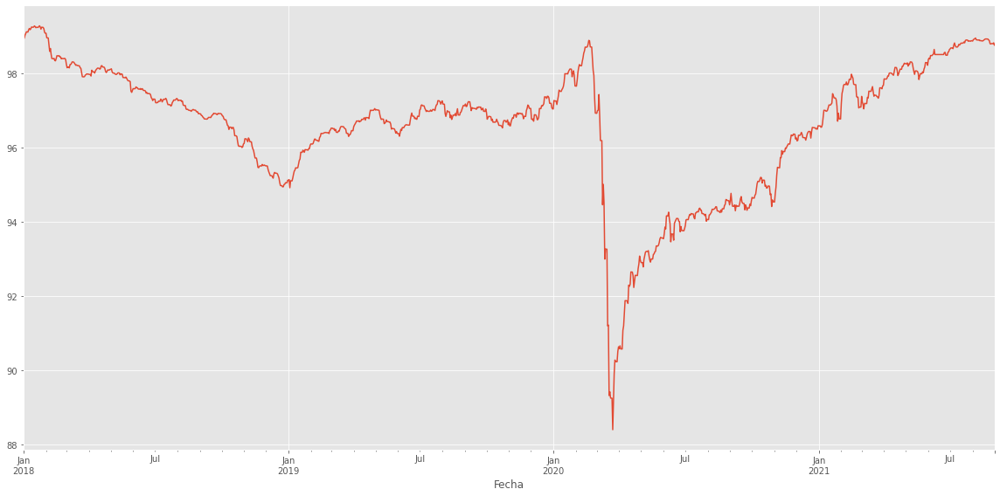

In [185]:
FI_Gest_Alt_df_Reg_60['VLP'].plot(figsize=(16,8))

In [186]:
# Creación nueva variable para predecir 60 días en el futuro
dias_futuros = 60

# Creación de nueva columna (target) desplazada 60 días más tarde
FI_Gest_Alt_df_Reg_60['Prediccion']=FI_Gest_Alt_df_Reg_60[['VLP']].shift(-dias_futuros)
FI_Gest_Alt_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,98.921245,0.000000,0.000000,98.152074
2018-01-02,98.947850,0.026895,0.026895,98.173852
2018-01-03,99.027256,0.080250,0.107145,98.171463
2018-01-04,99.075056,0.048270,0.155415,98.147980
2018-01-05,99.118364,0.043712,0.199127,98.237296
...,...,...,...,...
2021-08-27,98.802627,0.011859,0.025637,NaN
2021-08-28,98.801194,-0.001450,0.024187,NaN
2021-08-29,98.799762,-0.001449,0.022737,NaN


In [187]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 60 días
X = np.array(FI_Gest_Alt_df_Reg_60.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [188]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 60
y = np.array(FI_Gest_Alt_df_Reg_60['Prediccion'])

In [189]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [190]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [191]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[96.32322371 96.32221221 96.32120071 96.30637496 96.30953132 96.3455202
 96.43025497 96.50794665 96.506929   96.50591178 96.4962051  96.49728524
 96.50927449 96.54011217 96.57079938 96.56978744 96.56877507 96.58050298
 96.59193259 96.70430027 96.68140454 96.65450637 96.65348124 96.65245566
 96.63124326 96.5582716  96.37787051 96.47210824 96.40591084 96.40488439
 96.40385749 96.58721564 96.70788209 96.74541571 96.80055308 96.81422655
 96.81319438 96.81216264 96.84285337 96.80842155 96.81086032 96.83614335
 96.87445352 96.87341563 96.87241337 96.93499948 96.90784789 96.88988996
 96.8169887  96.81237823 96.81135749 96.81035655 96.67137404 96.6611812
 96.66324687 96.5357604  96.54679667 96.54577462 96.544753   96.67234638
 96.60358922 96.57513267 96.52416228 96.58910488 96.58807711 96.58705021
 96.58719188 96.66024494 96.65254541 96.73409698 96.73360509 96.73256323
 96.73152138 96.76131105 96.7880011  96.72508106 96.67407239 96.68639823
 96.68537177 96.6843462  96.6710423  96.66478633 96.6

In [192]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [193]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [194]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,96.323224
2021-01-02,96.322212
2021-01-03,96.321201
2021-01-04,96.306375
2021-01-05,96.309531
...,...
2021-08-27,97.297902
2021-08-28,97.297271
2021-08-29,97.296641
2021-08-30,97.306545


In [195]:
Pred_vs_orig_df = FI_Gest_Alt_df_Reg_60.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [196]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,96.587312,-0.002327,-2.250747,97.224546,96.323224,96.322807,96.323224
2021-01-02,96.585013,-0.002380,-2.253127,97.159868,96.322212,96.321799,96.322212
2021-01-03,96.582714,-0.002380,-2.255507,97.044019,96.321201,96.320790,96.321201
2021-01-04,96.549017,-0.034889,-2.290396,97.191625,96.306375,96.306009,96.306375
2021-01-05,96.556191,0.007430,-2.282966,97.189289,96.309531,96.309156,96.309531
...,...,...,...,...,...,...,...
2021-08-27,98.802627,0.011859,0.025637,NaN,97.297902,97.294568,97.297902
2021-08-28,98.801194,-0.001450,0.024187,NaN,97.297271,97.293940,97.297271
2021-08-29,98.799762,-0.001449,0.022737,NaN,97.296641,97.293311,97.296641
2021-08-30,98.822273,0.022784,0.045522,NaN,97.306545,97.303186,97.306545


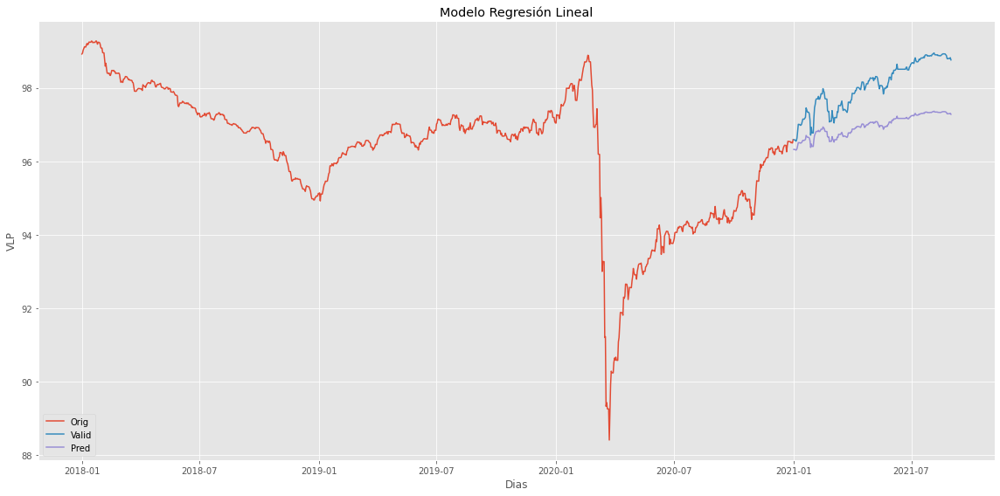

In [197]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_Gest_Alt_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

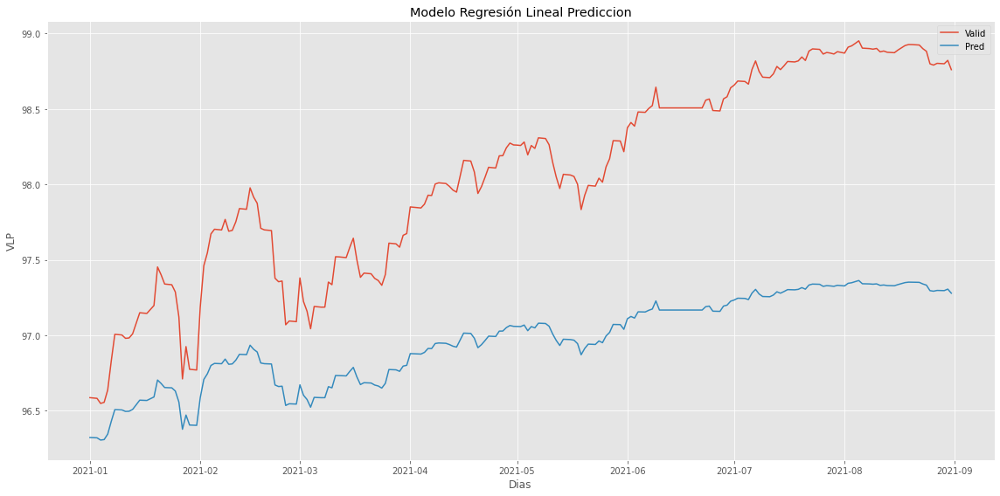

In [198]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

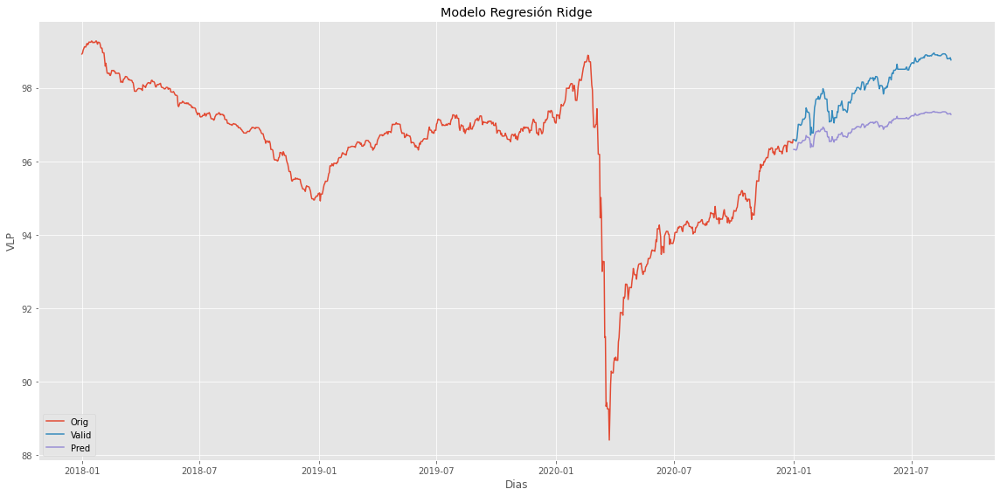

In [199]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_Gest_Alt_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

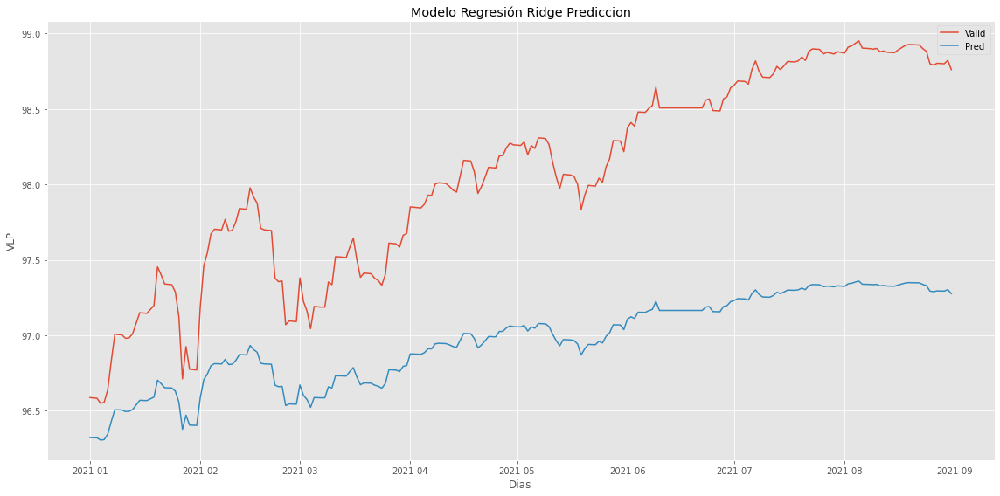

In [200]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

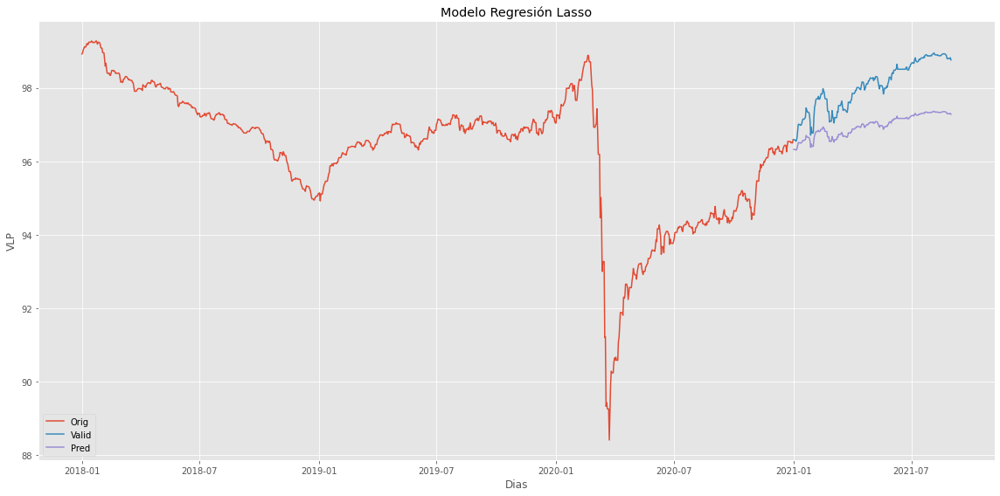

In [201]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_Gest_Alt_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

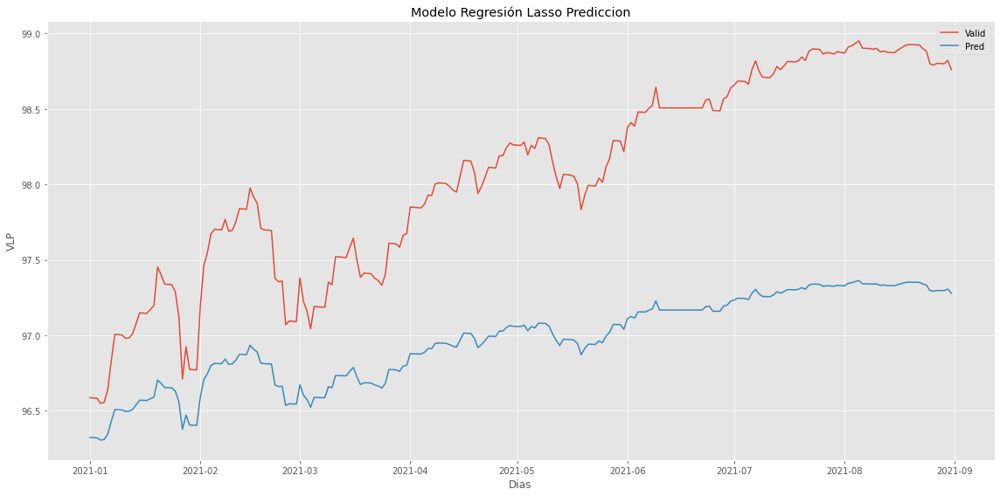

In [202]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [203]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI3_60 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI3_60 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI3_60 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI3_60 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI3_60 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI3_60 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI3_60 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI3_60 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI3_60 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI3_60 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI3_60 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI3_60 = round(r2_score(X_test,Lasso_pred),5)

In [204]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',mse_lr_FI3_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_lr_FI3_60)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es:',mae_lr_FI3_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es:',r2_lr_FI3_60)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 60 días es:',mse_r_FI3_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_r_FI3_60)
print('El Error Absoluto Medio para el Modelo de Ridge de 60 días es:',mae_r_FI3_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es:',r2_r_FI3_60)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 60 días es:',mse_l_FI3_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_l_FI3_60)
print('El Error Absoluto Medio para el Modelo de Lasso de 60 días es:',mae_l_FI3_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es:',r2_l_FI3_60)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 1.30498
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 1.14236
El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es: 1.08116
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es: -2.00781
El Error Cuadrático Medio para el Modelo de Ridge de 60 días es: 1.31068
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 1.14485
El Error Absoluto Medio para el Modelo de Ridge de 60 días es: 1.0835
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es: -2.02095
El Error Cuadrático Medio para el Modelo de Lasso de 60 días es: 1.30498
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 1.14236
El Error Absoluto Medio para el Modelo de Lasso de 60 días es: 1.08116
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es: -2.00781


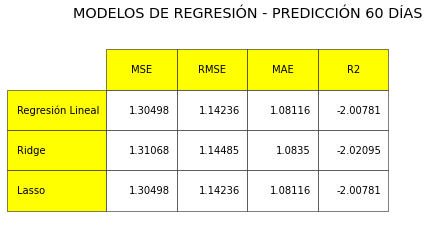

In [547]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI3_60 = [[mse_lr_FI3_60,rmse_lr_FI3_60,mae_lr_FI3_60,r2_lr_FI3_60],
               [mse_r_FI3_60,rmse_r_FI3_60,mae_r_FI3_60,r2_r_FI3_60],
               [mse_l_FI3_60,rmse_l_FI3_60,mae_l_FI3_60,r2_l_FI3_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI3_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

### **4. Fondo de Renta Variable Internacional: CaixaBank Renta Variable Global, FI Clase Universal**

#### *PREDICCIONES A 30 DÍAS*

In [206]:
FI_RV_Int_df_Reg_30 = FI_RV_Int_df
FI_RV_Int_df_Reg_30.set_index('Fecha', inplace=True)

In [207]:
FI_RV_Int_df_Reg_30.head()

,VLP,Rentabilidad_diaria,Rentabilidad
Fecha,,,
2018-01-01,105.942875,0.000000,0.000000
2018-01-02,105.946484,0.003407,0.003407
2018-01-03,106.647447,0.661620,0.665026
2018-01-04,107.574969,0.869709,1.534735
2018-01-05,108.414822,0.780714,2.315449


In [208]:
FI_RV_Int_df_Reg_30.shape

(1339, 3)

In [209]:
FI_RV_Int_df_Reg_30.isnull().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [210]:
FI_RV_Int_df_Reg_30.isna().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [211]:
FI_RV_Int_df_Reg_30.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
dtypes: float64(3)
memory usage: 41.8 KB


In [212]:
FI_RV_Int_df_Reg_30.describe()

,VLP,Rentabilidad_diaria,Rentabilidad
count,1339.000000,1339.000000,1339.000000
mean,110.693821,0.024086,5.741210
std,11.836001,0.803942,11.567709
min,80.824781,-8.710601,-24.494235
25%,103.694451,-0.128200,-1.474567
50%,107.379478,-0.005850,2.088391
75%,115.549959,0.301534,10.948490
max,140.202851,7.477744,32.387101


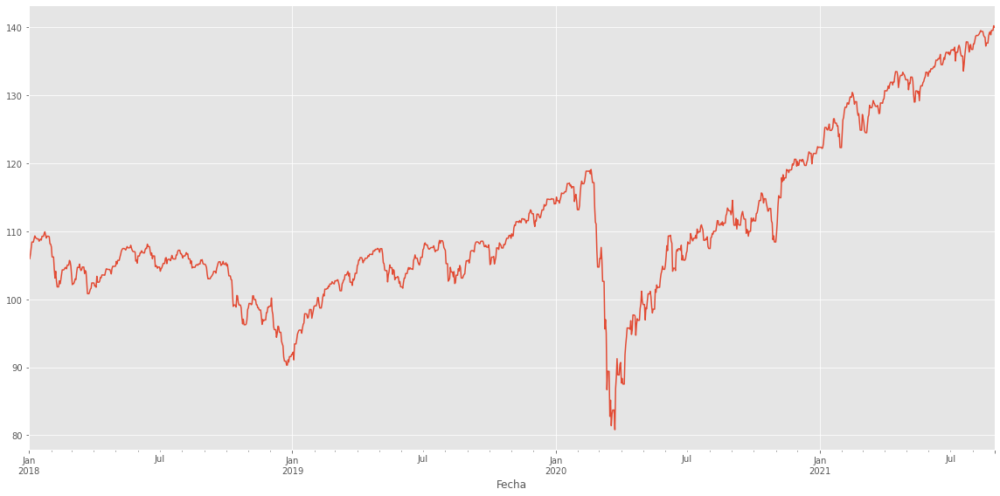

In [213]:
FI_RV_Int_df_Reg_30['VLP'].plot(figsize=(16,8))

In [214]:
# Creación nueva variable para predecir 30 días en el futuro
dias_futuros = 30

# Creación de nueva columna (target) desplazada 30 días más tarde
FI_RV_Int_df_Reg_30['Prediccion']=FI_RV_Int_df_Reg_30[['VLP']].shift(-dias_futuros)
FI_RV_Int_df_Reg_30

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,105.942875,0.000000,0.000000,108.096001
2018-01-02,105.946484,0.003407,0.003407,107.679662
2018-01-03,106.647447,0.661620,0.665026,106.225389
2018-01-04,107.574969,0.869709,1.534735,106.219199
2018-01-05,108.414822,0.780714,2.315449,106.213007
...,...,...,...,...
2021-08-27,139.538966,0.480334,31.911274,NaN
2021-08-28,139.530758,-0.005882,31.905391,NaN
2021-08-29,139.522554,-0.005880,31.899512,NaN


In [215]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 30 días
X = np.array(FI_RV_Int_df_Reg_30.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [216]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 30
y = np.array(FI_RV_Int_df_Reg_30['Prediccion'])

In [217]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [218]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [219]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[118.29732781 118.29211141 118.286895   118.17536286 118.22533547
 118.68673603 119.53335123 120.41021374 120.40489288 120.39957274
 120.16937698 120.1386342  120.41513491 120.76966698 120.09762329
 120.09232926 120.08703524 120.20309392 120.40532957 121.32802842
 121.33775468 120.87948643 120.874138   120.86878884 120.56335308
 120.57466436 119.42935535 119.71564832 118.26596047 118.26075857
 118.25555304 119.66499819 121.21698665 121.46753155 122.1608333
 122.57256303 122.56714424 122.5617269  123.03318669 122.9894758
 122.8840233  123.30102312 123.66756576 123.63474325 123.6292802
 124.14972676 123.97441461 123.57493847 122.88792454 123.16010327
 123.15462717 123.14919024 122.15483273 121.70722507 121.87903495
 121.01096075 120.11959443 120.11428082 120.10896358 121.7954709
 121.3887871  120.91989743 120.06250776 119.85745317 119.85212868
 119.84680491 120.71841548 121.53241272 121.75844319 122.77504677
 122.52397959 122.51852815 122.51307599 122.76135398 123.27256828
 123.05568955 

In [220]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [221]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [222]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,118.297328
2021-01-02,118.292111
2021-01-03,118.286895
2021-01-04,118.175363
2021-01-05,118.225335
...,...
2021-08-27,130.768532
2021-08-28,130.762578
2021-08-29,130.756626
2021-08-30,131.250119


In [223]:
Pred_vs_orig_df = FI_RV_Int_df_Reg_30.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [224]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,122.346970,-0.006262,18.446645,122.289382,118.297328,118.256627,118.297328
2021-01-02,122.339779,-0.005878,18.440768,124.232352,118.292111,118.251429,118.292111
2021-01-03,122.332588,-0.005878,18.434890,126.371823,118.286895,118.246230,118.286895
2021-01-04,122.178837,-0.125683,18.309207,126.717208,118.175363,118.135082,118.175363
2021-01-05,122.247726,0.056384,18.365591,127.672949,118.225335,118.184882,118.225335
...,...,...,...,...,...,...,...
2021-08-27,139.538966,0.480334,31.911274,NaN,130.768532,130.684966,130.768532
2021-08-28,139.530758,-0.005882,31.905391,NaN,130.762578,130.679033,130.762578
2021-08-29,139.522554,-0.005880,31.899512,NaN,130.756626,130.673102,130.756626
2021-08-30,140.202851,0.487589,32.387101,NaN,131.250119,131.164898,131.250119


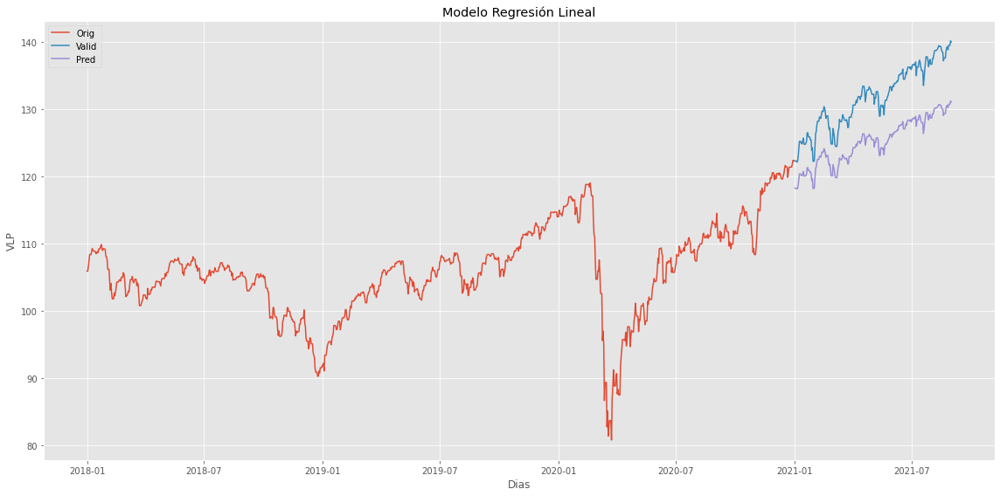

In [225]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Int_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

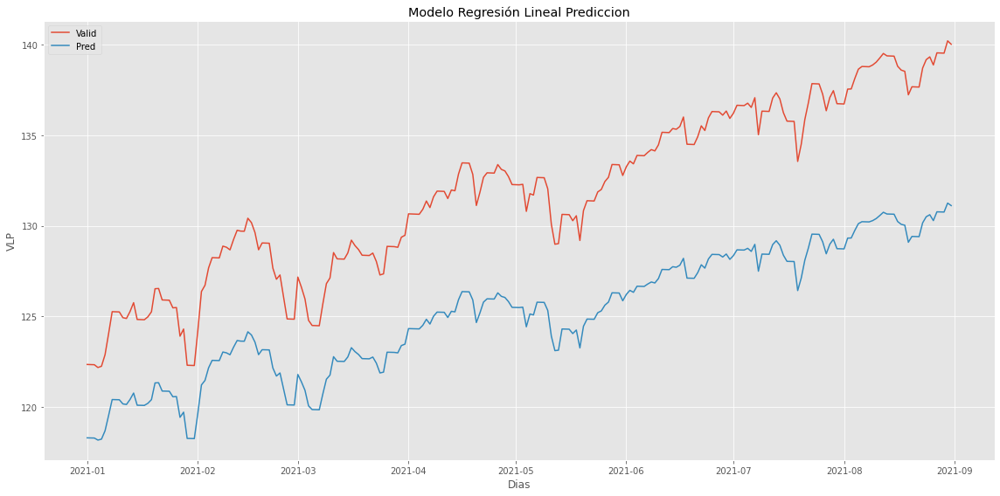

In [226]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

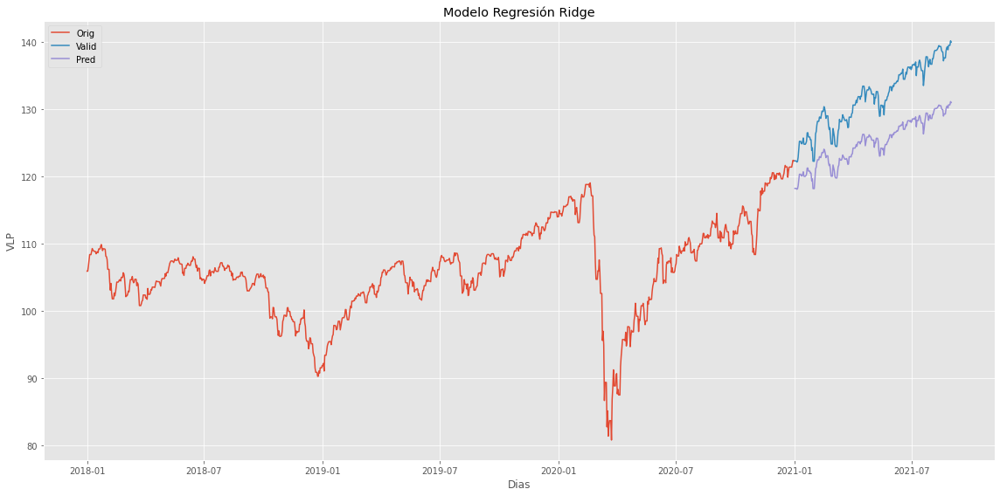

In [227]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Int_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

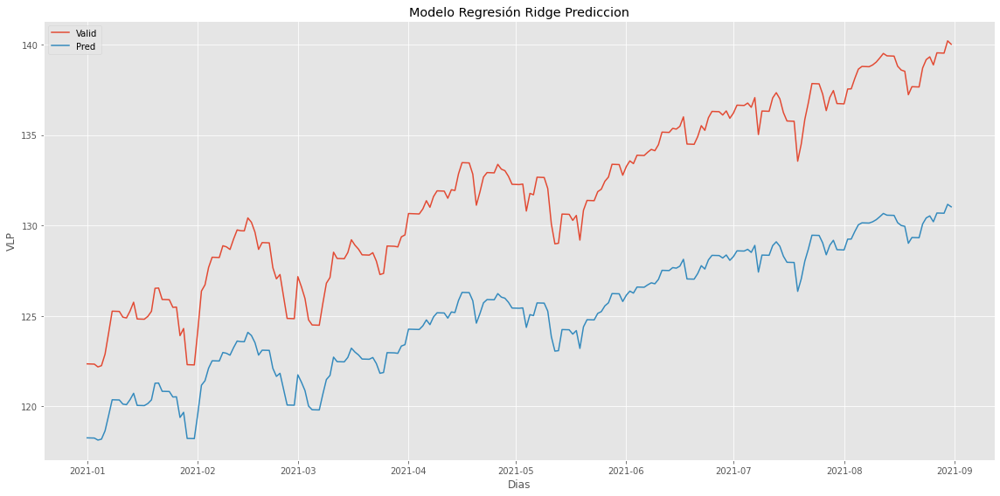

In [228]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

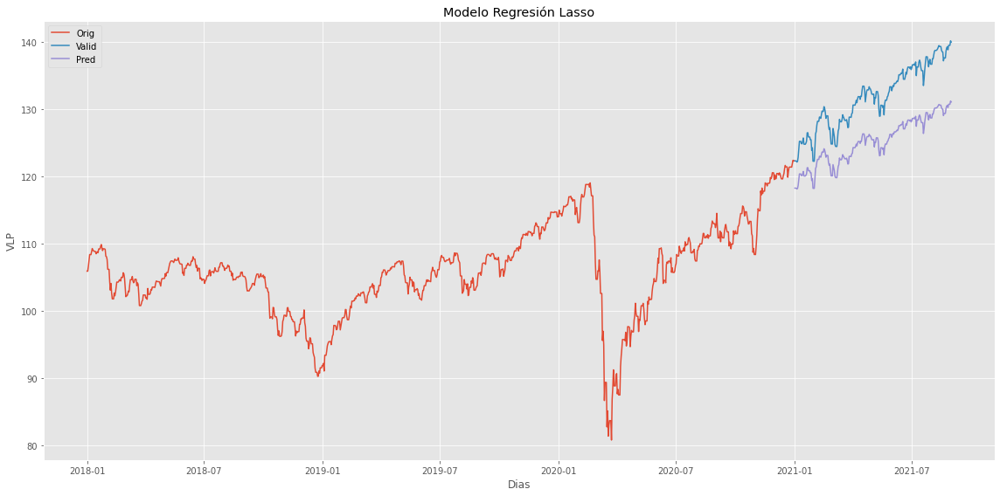

In [229]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Int_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

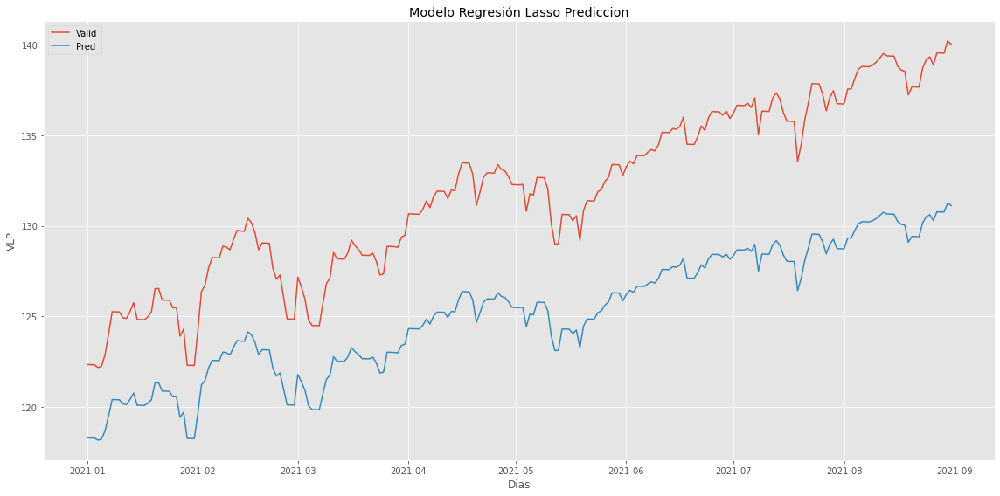

In [230]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [231]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI4_30 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI4_30 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI4_30 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI4_30 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI4_30 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI4_30 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI4_30 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI4_30 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI4_30 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI4_30 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI4_30 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI4_30 = round(r2_score(X_test,Lasso_pred),5)

In [232]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',mse_lr_FI4_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_lr_FI4_30)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es:',mae_lr_FI4_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es:',r2_lr_FI4_30)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 30 días es:',mse_r_FI4_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_r_FI4_30)
print('El Error Absoluto Medio para el Modelo de Ridge de 30 días es:',mae_r_FI4_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es:',r2_r_FI4_30)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 30 días es:',mse_l_FI4_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_l_FI4_30)
print('El Error Absoluto Medio para el Modelo de Lasso de 30 días es:',mae_l_FI4_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es:',r2_l_FI4_30)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 45.71811
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 6.76152
El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es: 6.6345
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es: -1.02588
El Error Cuadrático Medio para el Modelo de Ridge de 30 días es: 46.60476
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 6.82677
El Error Absoluto Medio para el Modelo de Ridge de 30 días es: 6.69867
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es: -1.06517
El Error Cuadrático Medio para el Modelo de Lasso de 30 días es: 45.71811
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 6.76152
El Error Absoluto Medio para el Modelo de Lasso de 30 días es: 6.6345
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es: -1.02588


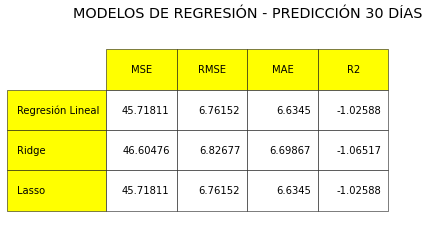

In [233]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI4_30 = [[mse_lr_FI4_30,rmse_lr_FI4_30,mae_lr_FI4_30,r2_lr_FI4_30],
               [mse_r_FI4_30,rmse_r_FI4_30,mae_r_FI4_30,r2_r_FI4_30],
               [mse_l_FI4_30,rmse_l_FI4_30,mae_l_FI4_30,r2_l_FI4_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI4_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [234]:
FI_RV_Int_df_Reg_60 = FI_RV_Int_df

In [235]:
FI_RV_Int_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,105.942875,0.000000,0.000000,108.096001
2018-01-02,105.946484,0.003407,0.003407,107.679662
2018-01-03,106.647447,0.661620,0.665026,106.225389
2018-01-04,107.574969,0.869709,1.534735,106.219199
2018-01-05,108.414822,0.780714,2.315449,106.213007
...,...,...,...,...
2021-08-27,139.538966,0.480334,31.911274,NaN
2021-08-28,139.530758,-0.005882,31.905391,NaN
2021-08-29,139.522554,-0.005880,31.899512,NaN


In [236]:
FI_RV_Int_df_Reg_60.head()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,105.942875,0.000000,0.000000,108.096001
2018-01-02,105.946484,0.003407,0.003407,107.679662
2018-01-03,106.647447,0.661620,0.665026,106.225389
2018-01-04,107.574969,0.869709,1.534735,106.219199
2018-01-05,108.414822,0.780714,2.315449,106.213007


In [237]:
FI_RV_Int_df_Reg_60.shape

(1339, 4)

In [238]:
FI_RV_Int_df_Reg_60.isnull().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [239]:
FI_RV_Int_df_Reg_60.isna().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [240]:
FI_RV_Int_df_Reg_60.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
 3   Prediccion           1309 non-null   float64
dtypes: float64(4)
memory usage: 92.3 KB


In [241]:
FI_RV_Int_df_Reg_60.describe()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
count,1339.000000,1339.000000,1339.000000,1309.000000
mean,110.693821,0.024086,5.741210,110.740388
std,11.836001,0.803942,11.567709,11.966057
min,80.824781,-8.710601,-24.494235,80.824781
25%,103.694451,-0.128200,-1.474567,103.580669
50%,107.379478,-0.005850,2.088391,107.284410
75%,115.549959,0.301534,10.948490,115.789937
max,140.202851,7.477744,32.387101,140.202851


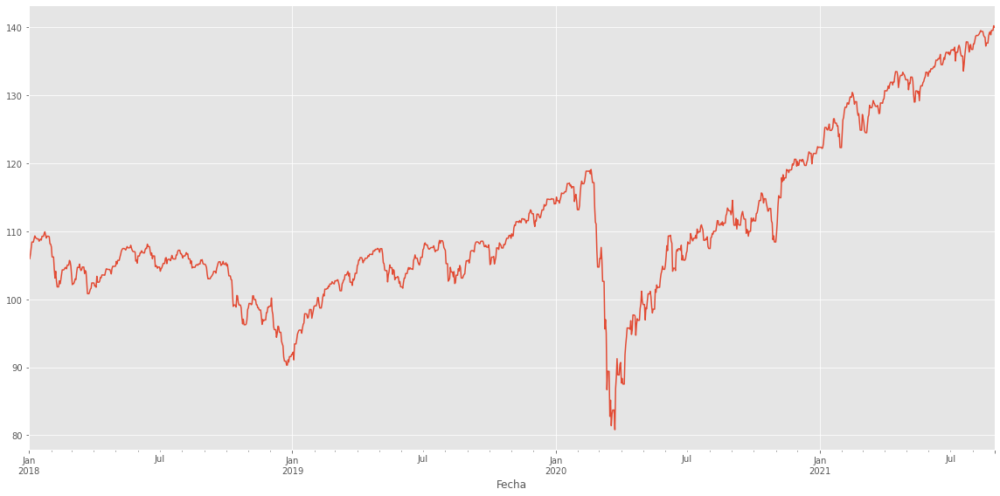

In [242]:
FI_RV_Int_df_Reg_60['VLP'].plot(figsize=(16,8))

In [243]:
# Creación nueva variable para predecir 60 días en el futuro
dias_futuros = 60

# Creación de nueva columna (target) desplazada 60 días más tarde
FI_RV_Int_df_Reg_60['Prediccion']=FI_RV_Int_df_Reg_60[['VLP']].shift(-dias_futuros)
FI_RV_Int_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,105.942875,0.000000,0.000000,102.151076
2018-01-02,105.946484,0.003407,0.003407,102.303712
2018-01-03,106.647447,0.661620,0.665026,102.297727
2018-01-04,107.574969,0.869709,1.534735,102.581222
2018-01-05,108.414822,0.780714,2.315449,102.999923
...,...,...,...,...
2021-08-27,139.538966,0.480334,31.911274,NaN
2021-08-28,139.530758,-0.005882,31.905391,NaN
2021-08-29,139.522554,-0.005880,31.899512,NaN


In [244]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 60 días
X = np.array(FI_RV_Int_df_Reg_60.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [245]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 60
y = np.array(FI_RV_Int_df_Reg_60['Prediccion'])

In [246]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [247]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [248]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[116.45105616 116.44693486 116.44281356 116.35469588 116.3941775
 116.75871413 117.42759551 118.12037425 118.11617042 118.11196716
 117.93009746 117.90580865 118.12426229 118.40436582 117.87340735
 117.86922472 117.8650421  117.95673605 118.11651544 118.84550788
 118.85319227 118.49113037 118.48690476 118.48267858 118.24136435
 118.250301   117.34543196 117.57162214 116.42627391 116.42216407
 116.41805136 117.53160522 118.75777762 118.95572448 119.50347822
 119.82877163 119.82449043 119.82021038 120.19269445 120.15815999
 120.07484562 120.40430275 120.69389541 120.66796348 120.66364732
 121.07483415 120.93632608 120.62071379 120.07792786 120.29296685
 120.28864037 120.28434484 119.49873737 119.14509804 119.28083908
 118.59500368 117.89076599 117.88656789 117.88236692 119.21481802
 118.89351122 118.52305771 117.84566378 117.68365725 117.67945055
 117.67524443 118.36387379 119.00698485 119.18556371 119.98874703
 119.79038753 119.78608054 119.78177298 119.97792883 120.38182157
 120.210473

In [249]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [250]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [251]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,116.451056
2021-01-02,116.446935
2021-01-03,116.442814
2021-01-04,116.354696
2021-01-05,116.394178
...,...
2021-08-27,126.304123
2021-08-28,126.299419
2021-08-29,126.294717
2021-08-30,126.684609


In [252]:
Pred_vs_orig_df = FI_RV_Int_df_Reg_60.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [253]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,122.346970,-0.006262,18.446645,126.608656,116.451056,116.377413,116.451056
2021-01-02,122.339779,-0.005878,18.440768,125.962275,116.446935,116.373324,116.446935
2021-01-03,122.332588,-0.005878,18.434890,124.780333,116.442814,116.369235,116.442814
2021-01-04,122.178837,-0.125683,18.309207,124.497658,116.354696,116.281811,116.354696
2021-01-05,122.247726,0.056384,18.365591,124.490318,116.394178,116.320982,116.394177
...,...,...,...,...,...,...,...
2021-08-27,139.538966,0.480334,31.911274,NaN,126.304123,126.152920,126.304123
2021-08-28,139.530758,-0.005882,31.905391,NaN,126.299419,126.148253,126.299419
2021-08-29,139.522554,-0.005880,31.899512,NaN,126.294717,126.143588,126.294717
2021-08-30,140.202851,0.487589,32.387101,NaN,126.684609,126.530410,126.684608


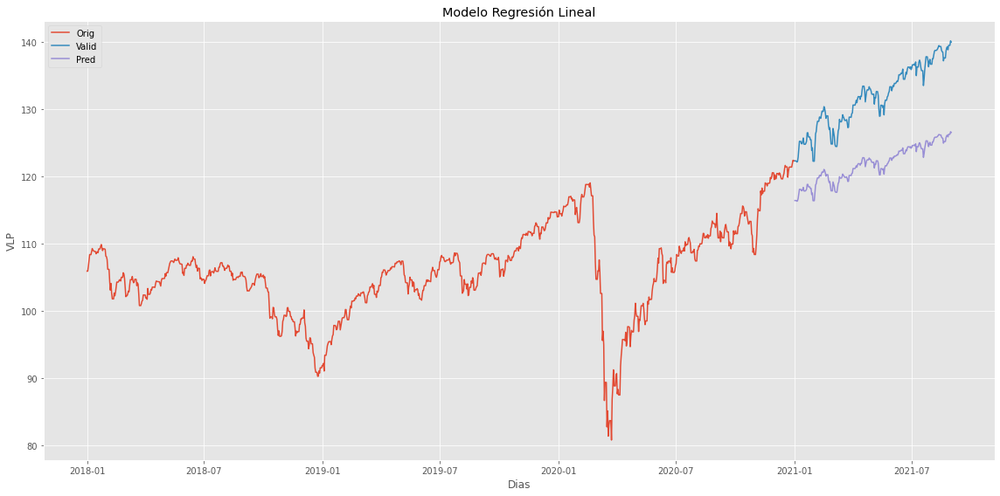

In [254]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Int_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

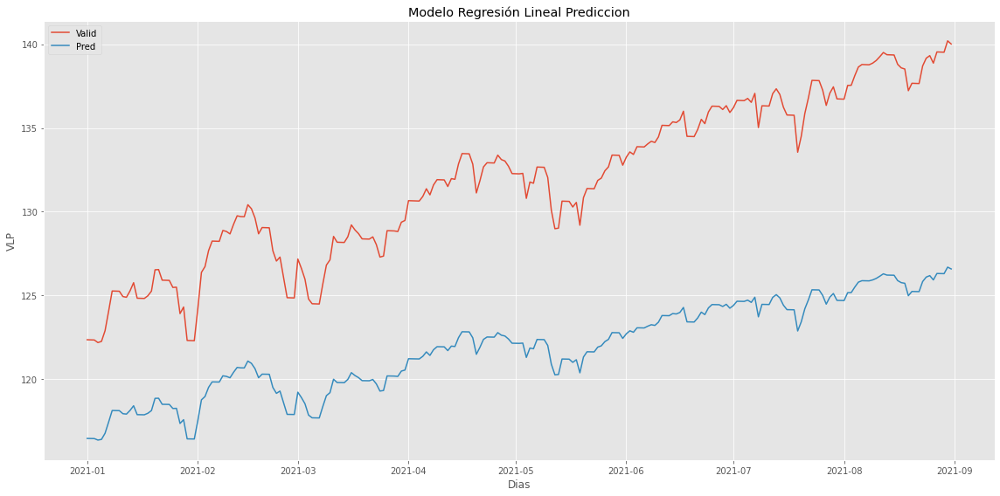

In [255]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

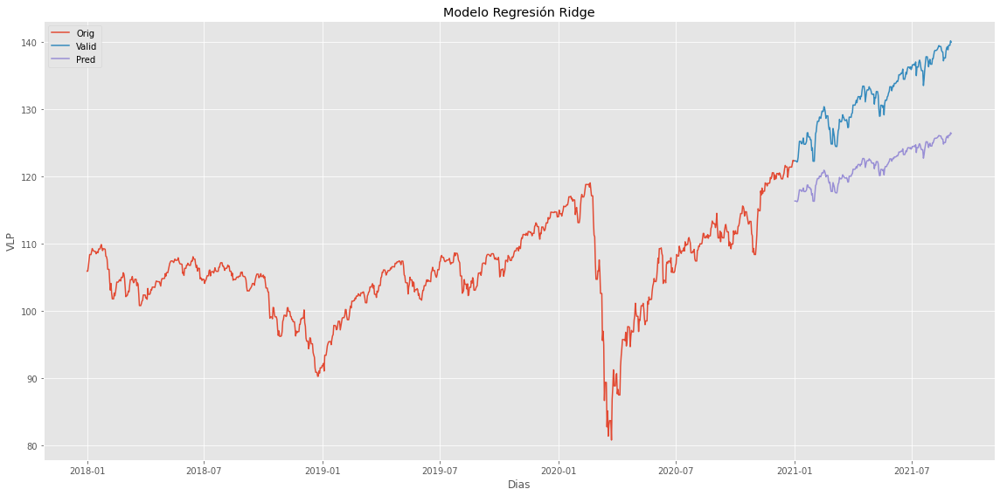

In [256]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Int_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

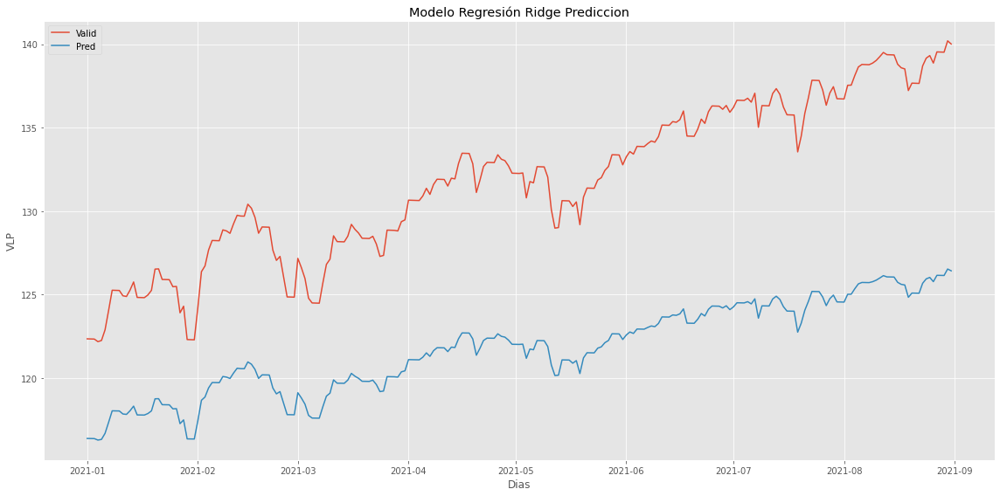

In [257]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

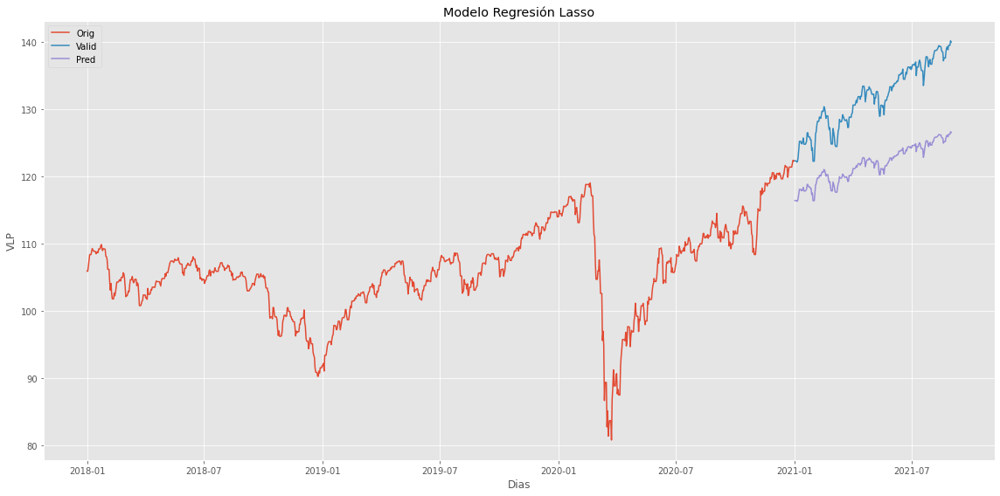

In [258]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Int_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

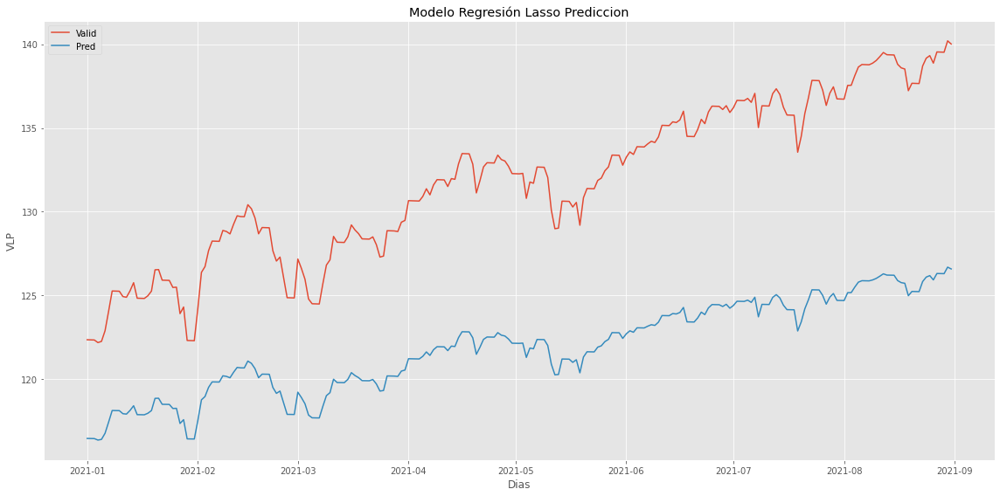

In [259]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [260]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI4_60 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI4_60 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI4_60 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI4_60 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI4_60 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI4_60 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI4_60 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI4_60 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI4_60 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI4_60 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI4_60 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI4_60 = round(r2_score(X_test,Lasso_pred),5)

In [261]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',mse_lr_FI4_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_lr_FI4_60)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es:',mae_lr_FI4_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es:',r2_lr_FI4_60)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 60 días es:',mse_r_FI4_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_r_FI4_60)
print('El Error Absoluto Medio para el Modelo de Ridge de 60 días es:',mae_r_FI4_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es:',r2_r_FI4_60)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 60 días es:',mse_l_FI4_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_l_FI4_60)
print('El Error Absoluto Medio para el Modelo de Lasso de 60 días es:',mae_l_FI4_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es:',r2_l_FI4_60)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 102.40606
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 10.11959
El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es: 9.91432
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es: -3.53786
El Error Cuadrático Medio para el Modelo de Ridge de 60 días es: 104.80925
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 10.23764
El Error Absoluto Medio para el Modelo de Ridge de 60 días es: 10.03043
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es: -3.64435
El Error Cuadrático Medio para el Modelo de Lasso de 60 días es: 102.40606
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 10.11959
El Error Absoluto Medio para el Modelo de Lasso de 60 días es: 9.91432
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es: -3.

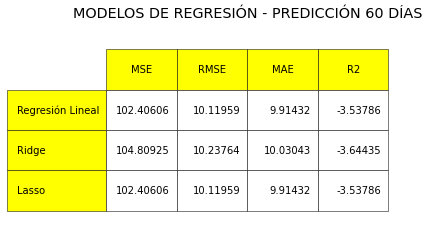

In [546]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI4_60 = [[mse_lr_FI4_60,rmse_lr_FI4_60,mae_lr_FI4_60,r2_lr_FI4_60],
               [mse_r_FI4_60,rmse_r_FI4_60,mae_r_FI4_60,r2_r_FI4_60],
               [mse_l_FI4_60,rmse_l_FI4_60,mae_l_FI4_60,r2_l_FI4_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI4_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

### **5. Fondo de Renta Variable Global: CaixaBank Global Flexible, FI**

#### *PREDICCIONES A 30 DÍAS*

In [263]:
FI_RV_Glob_df_Reg_30 = FI_RV_Glob_df
FI_RV_Glob_df_Reg_30.set_index('Fecha', inplace=True)

In [264]:
FI_RV_Glob_df_Reg_30.head()

,VLP,Rentabilidad_diaria,Rentabilidad
Fecha,,,
2018-01-01,99.015743,0.000000,0.000000
2018-01-02,99.026838,0.011205,0.011205
2018-01-03,99.514758,0.492715,0.503920
2018-01-04,100.010021,0.497678,1.001598
2018-01-05,100.555147,0.545071,1.546670


In [265]:
FI_RV_Glob_df_Reg_30.shape

(1339, 3)

In [266]:
FI_RV_Glob_df_Reg_30.isnull().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [267]:
FI_RV_Glob_df_Reg_30.isna().sum()

VLP                    0
Rentabilidad_diaria    0
Rentabilidad           0
dtype: int64

In [268]:
FI_RV_Glob_df_Reg_30.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
dtypes: float64(3)
memory usage: 41.8 KB


In [269]:
FI_RV_Glob_df_Reg_30.describe()

,VLP,Rentabilidad_diaria,Rentabilidad
count,1339.000000,1339.000000,1339.000000
mean,101.974493,0.008856,3.245756
std,4.430736,0.323825,4.551657
min,89.717669,-2.363626,-9.615722
25%,98.754105,-0.033550,-0.109619
50%,101.983346,-0.001638,3.325630
75%,105.821764,0.117775,7.256623
max,110.700193,2.324114,11.858168


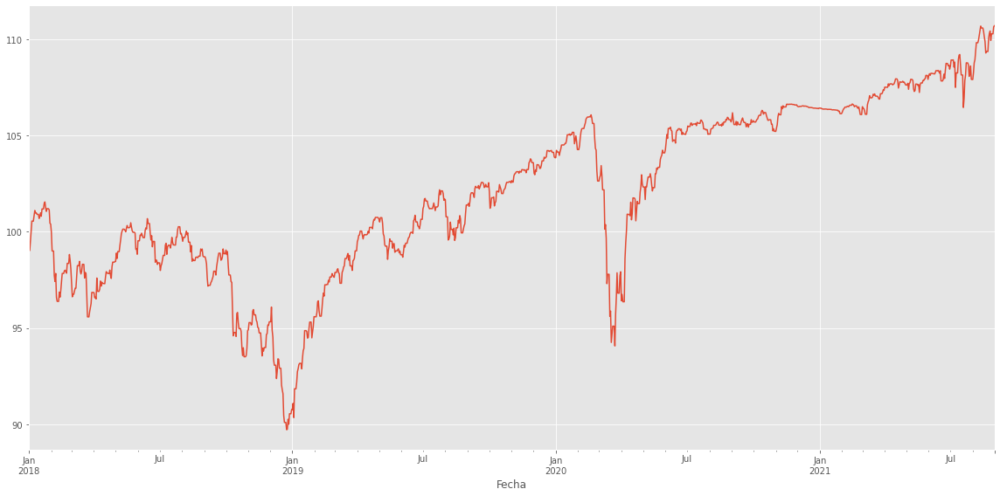

In [270]:
FI_RV_Glob_df_Reg_30['VLP'].plot(figsize=(16,8))

In [271]:
# Creación nueva variable para predecir 30 días en el futuro
dias_futuros = 30

# Creación de nueva columna (target) desplazada 30 días más tarde
FI_RV_Glob_df_Reg_30['Prediccion']=FI_RV_Glob_df_Reg_30[['VLP']].shift(-dias_futuros)
FI_RV_Glob_df_Reg_30

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,99.015743,0.000000,0.000000,100.399969
2018-01-02,99.026838,0.011205,0.011205,99.971360
2018-01-03,99.514758,0.492715,0.503920,99.002760
2018-01-04,100.010021,0.497678,1.001598,99.000565
2018-01-05,100.555147,0.545071,1.546670,98.998369
...,...,...,...,...
2021-08-27,110.285461,0.313861,11.482260,NaN
2021-08-28,110.282573,-0.002619,11.479641,NaN
2021-08-29,110.279686,-0.002618,11.477023,NaN


In [272]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 30 días
X = np.array(FI_RV_Glob_df_Reg_30.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [273]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 30
y = np.array(FI_RV_Glob_df_Reg_30['Prediccion'])

In [274]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [275]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [276]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[105.71319462 105.71103077 105.70886776 105.67956402 105.67828761
 105.66890525 105.66672187 105.67470384 105.67253744 105.67037019
 105.66613419 105.65169803 105.66099207 105.65967405 105.65735224
 105.6551799  105.65300755 105.63725677 105.63515406 105.64038535
 105.63463432 105.63222589 105.62999919 105.62777334 105.61463141
 105.61955783 105.57035733 105.57894481 105.47056443 105.46838699
 105.46620954 105.52206891 105.61340851 105.67462316 105.71092801
 105.76082149 105.75866443 105.75650907 105.7908284  105.79593316
 105.77554385 105.82098818 105.84346067 105.84128917 105.83920005
 105.89621353 105.87373764 105.84224286 105.77288404 105.81344187
 105.81131113 105.80922116 105.73162729 105.70737226 105.76644598
 105.62407152 105.4326214  105.43049321 105.42836503 105.7758207
 105.70983589 105.69047925 105.60600317 105.44334216 105.44118
 105.43901785 105.85650324 105.99157427 106.06677244 106.26114988
 106.16976526 106.16764132 106.16551738 106.19894077 106.32577761
 106.28342959 

In [277]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [278]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [279]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,105.713195
2021-01-02,105.711031
2021-01-03,105.708868
2021-01-04,105.679564
2021-01-05,105.678288
...,...
2021-08-27,108.992966
2021-08-28,108.990514
2021-08-29,108.988062
2021-08-30,109.298602


In [280]:
Pred_vs_orig_df = FI_RV_Glob_df_Reg_30.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [281]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,106.423436,-0.002845,7.854522,106.132604,105.713195,105.708397,105.713195
2021-01-02,106.420888,-0.002394,7.852127,106.198380,105.711031,105.706235,105.711031
2021-01-03,106.418341,-0.002393,7.849734,106.305935,105.708868,105.704074,105.708868
2021-01-04,106.383835,-0.032425,7.817309,106.378017,105.679564,105.674799,105.679564
2021-01-05,106.382332,-0.001413,7.815896,106.420767,105.678288,105.673524,105.678288
...,...,...,...,...,...,...,...
2021-08-27,110.285461,0.313861,11.482260,NaN,108.992966,108.984929,108.992966
2021-08-28,110.282573,-0.002619,11.479641,NaN,108.990514,108.982479,108.990514
2021-08-29,110.279686,-0.002618,11.477023,NaN,108.988062,108.980030,108.988062
2021-08-30,110.645356,0.331584,11.808607,NaN,109.298602,109.290263,109.298602


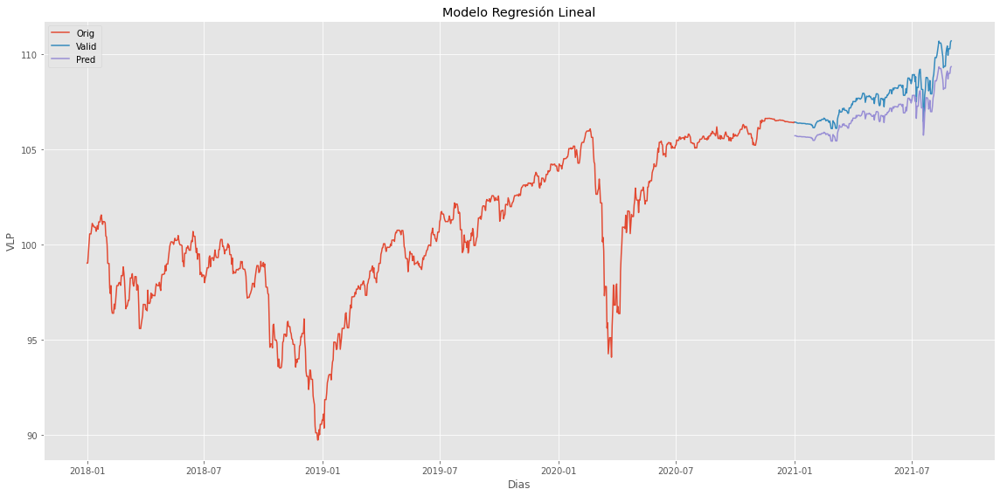

In [282]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Glob_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

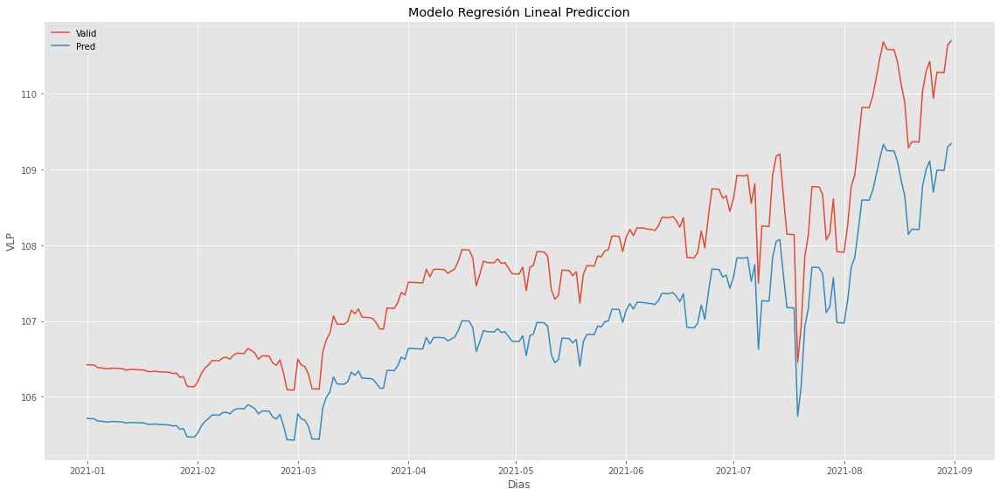

In [283]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

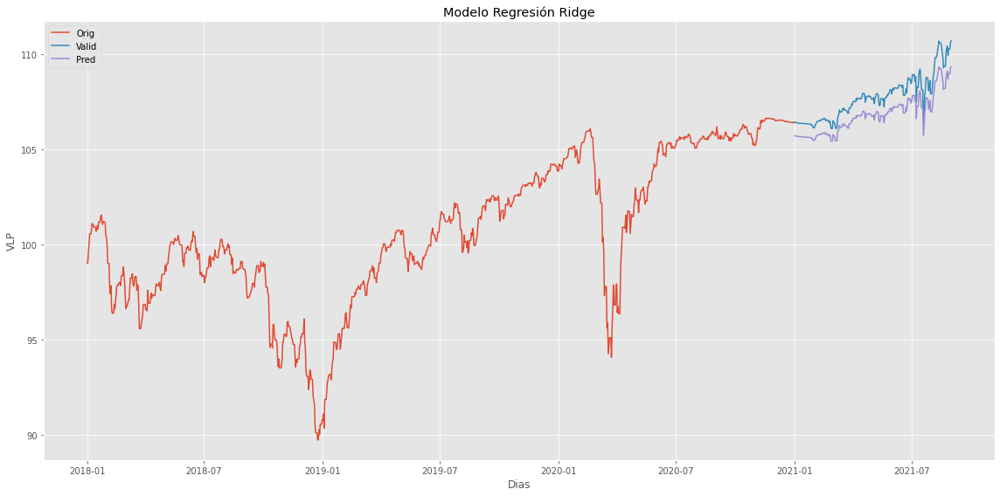

In [284]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Glob_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

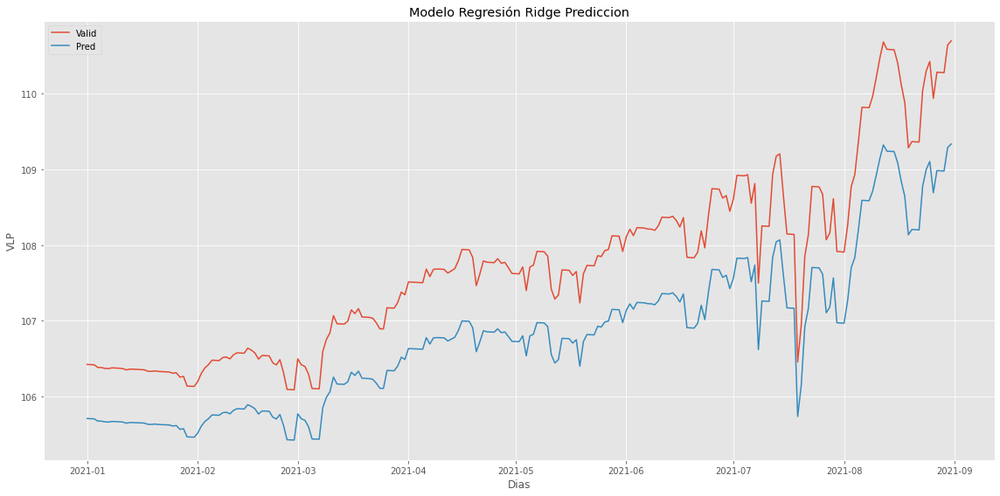

In [285]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

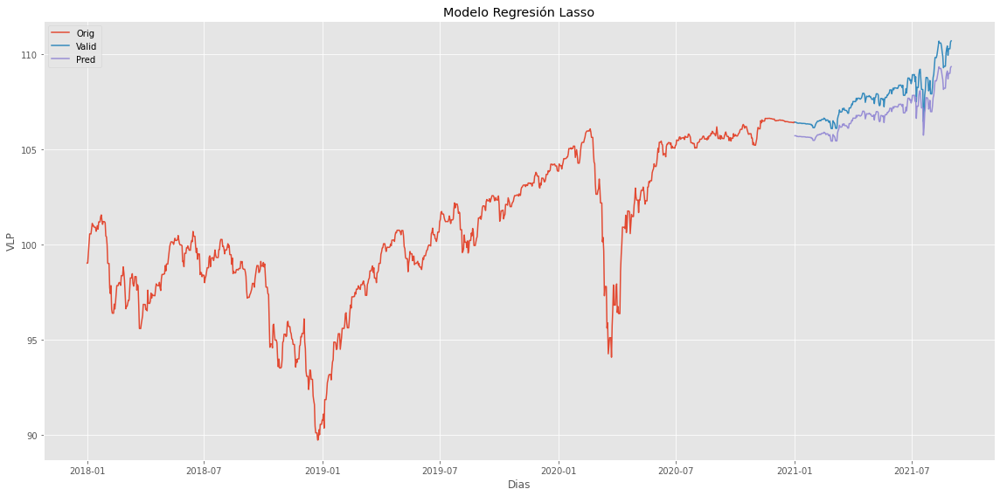

In [286]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Glob_df_Reg_30['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

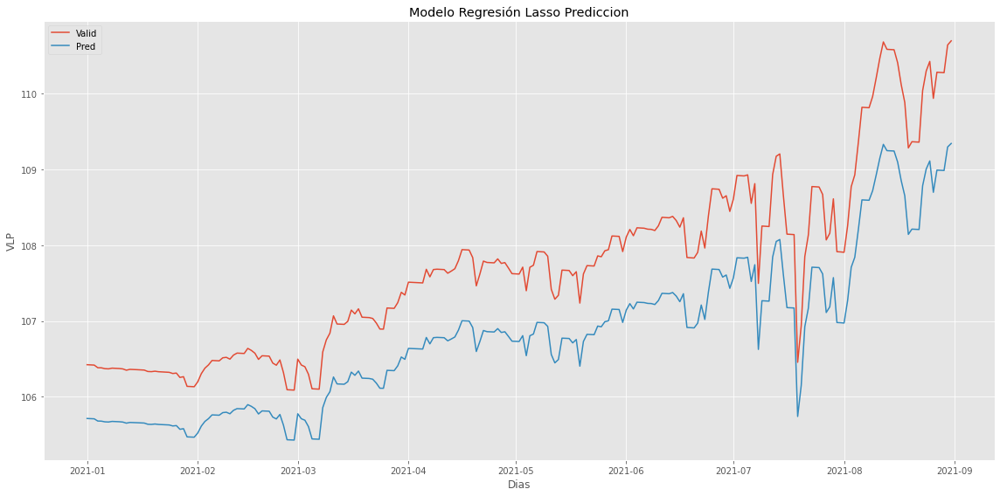

In [287]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [288]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI5_30 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI5_30 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI5_30 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI5_30 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI5_30 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI5_30 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI5_30 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI5_30 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI5_30 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI5_30 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI5_30 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI5_30 = round(r2_score(X_test,Lasso_pred),5)

In [289]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',mse_lr_FI5_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_lr_FI5_30)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es:',mae_lr_FI5_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es:',r2_lr_FI5_30)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 30 días es:',mse_r_FI5_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_r_FI5_30)
print('El Error Absoluto Medio para el Modelo de Ridge de 30 días es:',mae_r_FI5_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es:',r2_r_FI5_30)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 30 días es:',mse_l_FI5_30)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es:',rmse_l_FI5_30)
print('El Error Absoluto Medio para el Modelo de Lasso de 30 días es:',mae_l_FI5_30)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es:',r2_l_FI5_30)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.84934
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.92159
El Error Absoluto Medio para el Modelo de Regresión Lineal de 30 días es: 0.90462
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 30 días es: 0.37743
El Error Cuadrático Medio para el Modelo de Ridge de 30 días es: 0.86035
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.92755
El Error Absoluto Medio para el Modelo de Ridge de 30 días es: 0.91049
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 30 días es: 0.36935
El Error Cuadrático Medio para el Modelo de Lasso de 30 días es: 0.84934
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 30 días es: 0.92159
El Error Absoluto Medio para el Modelo de Lasso de 30 días es: 0.90462
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 30 días es: 0.37743


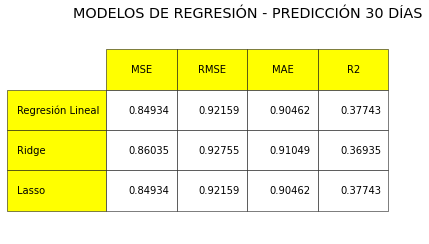

In [290]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI5_30 = [[mse_lr_FI5_30,rmse_lr_FI5_30,mae_lr_FI5_30,r2_lr_FI5_30],
               [mse_r_FI5_30,rmse_r_FI5_30,mae_r_FI5_30,r2_r_FI5_30],
               [mse_l_FI5_30,rmse_l_FI5_30,mae_l_FI5_30,r2_l_FI5_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI5_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [291]:
FI_RV_Glob_df_Reg_60 = FI_RV_Glob_df

In [292]:
FI_RV_Glob_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,99.015743,0.000000,0.000000,100.399969
2018-01-02,99.026838,0.011205,0.011205,99.971360
2018-01-03,99.514758,0.492715,0.503920,99.002760
2018-01-04,100.010021,0.497678,1.001598,99.000565
2018-01-05,100.555147,0.545071,1.546670,98.998369
...,...,...,...,...
2021-08-27,110.285461,0.313861,11.482260,NaN
2021-08-28,110.282573,-0.002619,11.479641,NaN
2021-08-29,110.279686,-0.002618,11.477023,NaN


In [293]:
FI_RV_Glob_df_Reg_60.head()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,99.015743,0.000000,0.000000,100.399969
2018-01-02,99.026838,0.011205,0.011205,99.971360
2018-01-03,99.514758,0.492715,0.503920,99.002760
2018-01-04,100.010021,0.497678,1.001598,99.000565
2018-01-05,100.555147,0.545071,1.546670,98.998369


In [294]:
FI_RV_Glob_df_Reg_60.shape

(1339, 4)

In [295]:
FI_RV_Glob_df_Reg_60.isnull().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [296]:
FI_RV_Glob_df_Reg_60.isna().sum()

VLP                     0
Rentabilidad_diaria     0
Rentabilidad            0
Prediccion             30
dtype: int64

In [297]:
FI_RV_Glob_df_Reg_60.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1339 entries, 2018-01-01 to 2021-08-31
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   VLP                  1339 non-null   float64
 1   Rentabilidad_diaria  1339 non-null   float64
 2   Rentabilidad         1339 non-null   float64
 3   Prediccion           1309 non-null   float64
dtypes: float64(4)
memory usage: 92.3 KB


In [298]:
FI_RV_Glob_df_Reg_60.describe()

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
count,1339.000000,1339.000000,1339.000000,1309.000000
mean,101.974493,0.008856,3.245756,102.002022
std,4.430736,0.323825,4.551657,4.476504
min,89.717669,-2.363626,-9.615722,89.717669
25%,98.754105,-0.033550,-0.109619,98.691509
50%,101.983346,-0.001638,3.325630,102.122251
75%,105.821764,0.117775,7.256623,105.853591
max,110.700193,2.324114,11.858168,110.700193


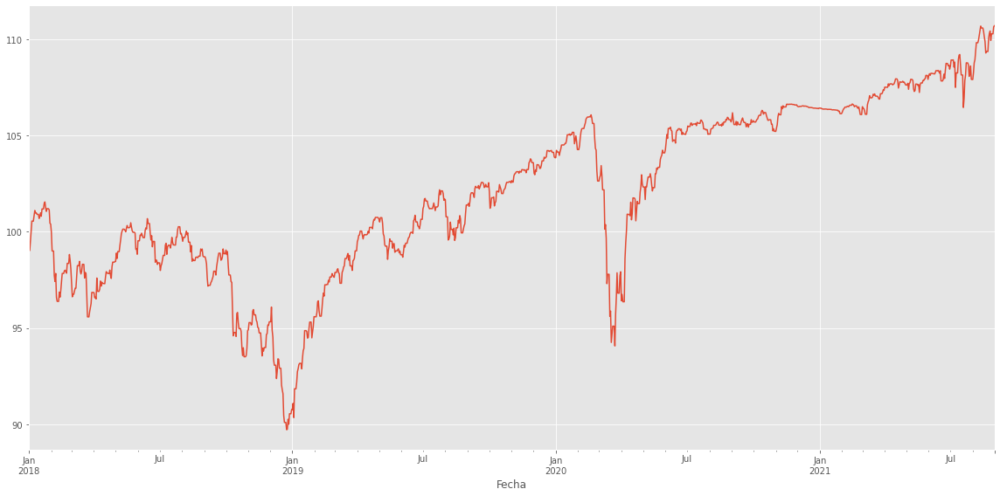

In [299]:
FI_RV_Glob_df_Reg_60['VLP'].plot(figsize=(16,8))

In [300]:
# Creación nueva variable para predecir 60 días en el futuro
dias_futuros = 60

# Creación de nueva columna (target) desplazada 60 días más tarde
FI_RV_Glob_df_Reg_60['Prediccion']=FI_RV_Glob_df_Reg_60[['VLP']].shift(-dias_futuros)
FI_RV_Glob_df_Reg_60

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion
Fecha,,,,
2018-01-01,99.015743,0.000000,0.000000,96.619198
2018-01-02,99.026838,0.011205,0.011205,96.754503
2018-01-03,99.514758,0.492715,0.503920,96.752397
2018-01-04,100.010021,0.497678,1.001598,96.922068
2018-01-05,100.555147,0.545071,1.546670,97.070649
...,...,...,...,...
2021-08-27,110.285461,0.313861,11.482260,NaN
2021-08-28,110.282573,-0.002619,11.479641,NaN
2021-08-29,110.279686,-0.002618,11.477023,NaN


In [301]:
# Creación del del futuro dataset X, convertirlo en array con numpy y eliminar los últimos 60 días
X = np.array(FI_RV_Glob_df_Reg_60.drop(['Rentabilidad_diaria','Rentabilidad','Prediccion'],1))

In [302]:
# Creación del dataset objetivo (y), convertirlo en array con numpy y conseguir todos los valores objetivo excepto los últimos 60
y = np.array(FI_RV_Glob_df_Reg_60['Prediccion'])

In [303]:
# División de datasets X e y en entrenamiento (train) y validación (test)
X_train,X_test,y_train,y_test=X[:1096],X[1096:],y[:1096],y[1096:]

In [304]:
# Creación de modelos

# Creación modelo Regresión lineal
lin_model=LinearRegression().fit(X_train,y_train)

# Creación modelo Ridge
R_model = RidgeCV(
              alphas = np.logspace(-10, 2, 200),
              fit_intercept   = True,
              normalize       = True,
              store_cv_values = True
          ).fit(X_train,y_train)

# Creación modelo de Lasso
lasso_model = LassoCV(
              alphas = np.logspace(-10, 3, 200),
              normalize = True,
              cv = 10
         ).fit(X_train,y_train)

In [305]:
# Predicción Modelo Regresión Lineal
lin_pred=lin_model.predict(X_test)
print(lin_pred)
print()

# Predicción Modelo Ridge
R_pred=R_model.predict(X_test)
print(R_pred)
print()

# Predicción Modelo Lasso
Lasso_pred=lasso_model.predict(X_test)
print(Lasso_pred)
print()

[105.47054338 105.46859167 105.46664072 105.44020988 105.43905861
 105.43059609 105.42862676 105.43582618 105.43387217 105.4319174
 105.4280967  105.41507583 105.4234587  105.4222699  105.42017572
 105.41821634 105.41625697 105.40205037 105.40015381 105.40487224
 105.39968503 105.39751272 105.39550432 105.39349669 105.38164318
 105.38608662 105.34170967 105.34945524 105.25170033 105.24973636
 105.24777239 105.29815538 105.38054017 105.43575342 105.46849899
 105.51350098 105.51155539 105.50961134 105.54056605 105.54517035
 105.52677998 105.567769   105.58803832 105.58607971 105.58419541
 105.63561936 105.61534698 105.58693991 105.52438093 105.56096252
 105.55904068 105.55715561 105.48716894 105.46529184 105.51857405
 105.3901578  105.21747719 105.21555765 105.21363811 105.52702968
 105.46751394 105.450055   105.37386084 105.2271469  105.22519672
 105.22324654 105.59980221 105.72163106 105.7894569  105.96477783
 105.88235244 105.88043673 105.87852102 105.90866763 106.02306954
 105.984873

In [306]:
inicio = datetime(2021,1,1)
fin    = datetime(2021,8,31)

lista_fechas = [(inicio + timedelta(days=d)).strftime("%Y-%m-%d")
                    for d in range((fin - inicio).days + 1)] 

In [307]:
lin_pred_df = pd.DataFrame(lin_pred, index=lista_fechas, columns=['Prediccion_Lineal'])
R_pred_df = pd.DataFrame(R_pred, index=lista_fechas, columns=['Prediccion_Ridge'])
Lasso_pred_df = pd.DataFrame(Lasso_pred, index=lista_fechas, columns=['Prediccion_Lasso'])

In [308]:
lin_pred_df

,Prediccion_Lineal
2021-01-01,105.470543
2021-01-02,105.468592
2021-01-03,105.466641
2021-01-04,105.440210
2021-01-05,105.439059
...,...
2021-08-27,108.428771
2021-08-28,108.426558
2021-08-29,108.424347
2021-08-30,108.704442


In [309]:
Pred_vs_orig_df = FI_RV_Glob_df_Reg_60.merge(lin_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(R_pred_df, how='outer', left_index=True, right_index=True)
Pred_vs_orig_df = Pred_vs_orig_df.merge(Lasso_pred_df, how='outer', left_index=True, right_index=True)

In [310]:
Pred_vs_orig_df = Pred_vs_orig_df[1096:]
Pred_vs_orig_df

,VLP,Rentabilidad_diaria,Rentabilidad,Prediccion,Prediccion_Lineal,Prediccion_Ridge,Prediccion_Lasso
2021-01-01,106.423436,-0.002845,7.854522,106.419481,105.470543,105.463007,105.470543
2021-01-02,106.420888,-0.002394,7.852127,106.396688,105.468592,105.461059,105.468592
2021-01-03,106.418341,-0.002393,7.849734,106.297215,105.466641,105.459112,105.466641
2021-01-04,106.383835,-0.032425,7.817309,106.105677,105.440210,105.432726,105.440210
2021-01-05,106.382332,-0.001413,7.815896,106.103131,105.439059,105.431577,105.439059
...,...,...,...,...,...,...,...
2021-08-27,110.285461,0.313861,11.482260,NaN,108.428771,108.416148,108.428771
2021-08-28,110.282573,-0.002619,11.479641,NaN,108.426558,108.413939,108.426558
2021-08-29,110.279686,-0.002618,11.477023,NaN,108.424347,108.411732,108.424347
2021-08-30,110.645356,0.331584,11.808607,NaN,108.704442,108.691345,108.704442


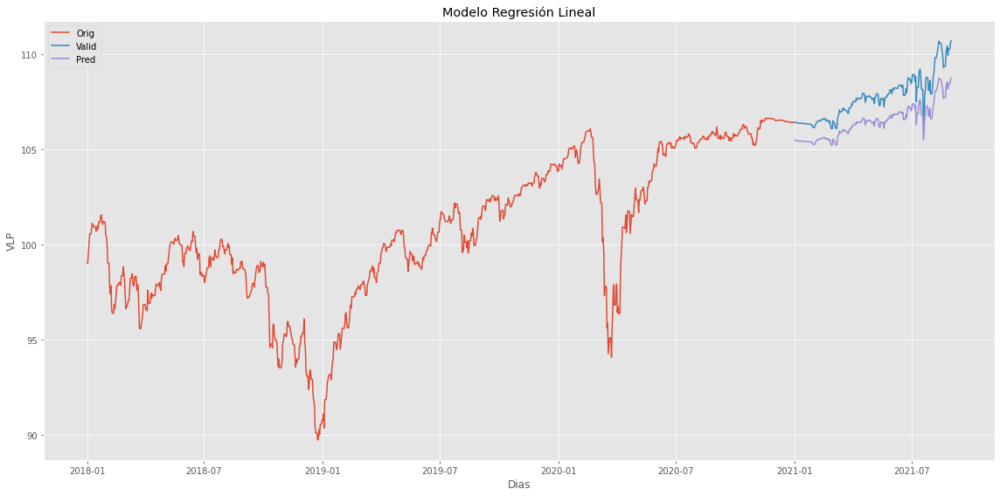

In [311]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Glob_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

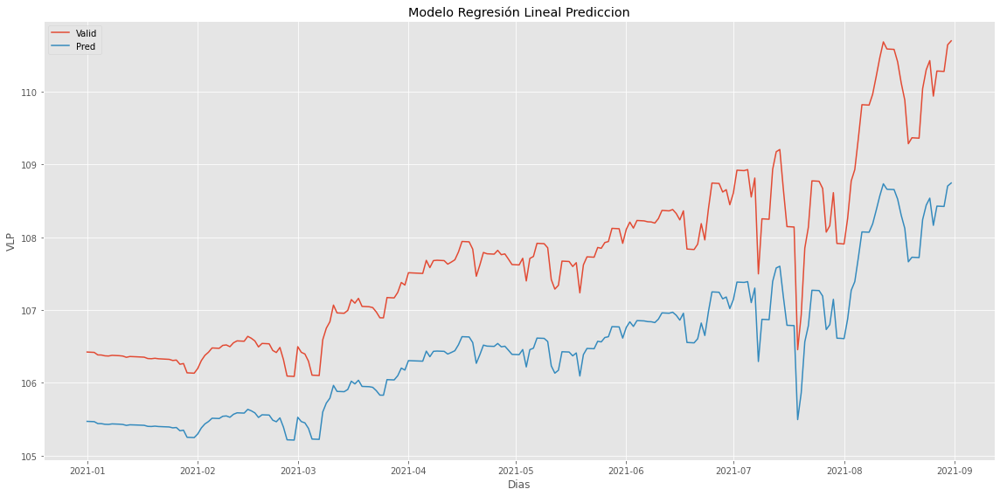

In [312]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lineal Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lineal']])
plt.legend(['Valid','Pred'])
plt.show()

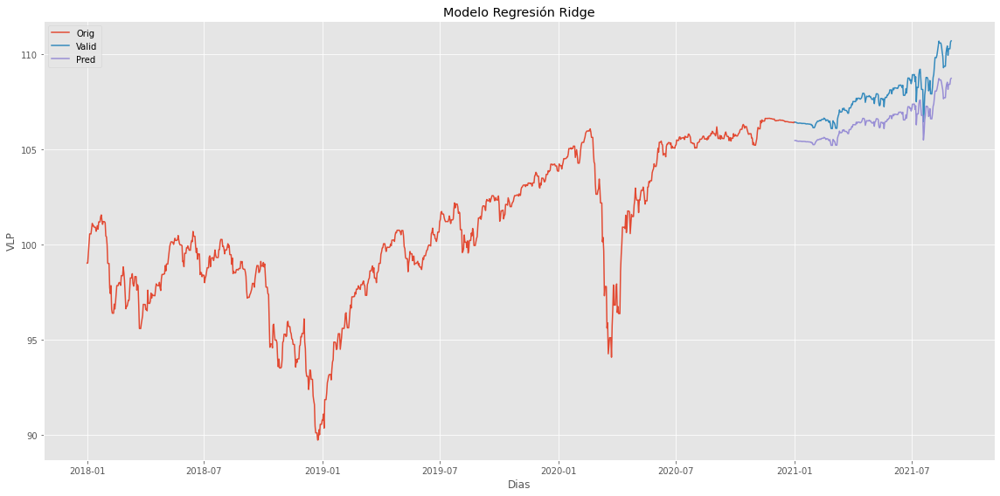

In [313]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Glob_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

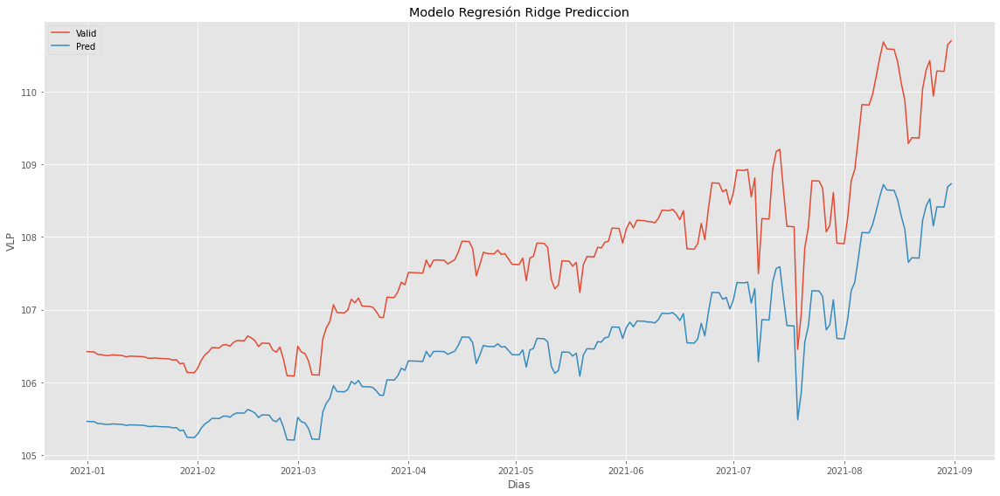

In [314]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Ridge Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Ridge']])
plt.legend(['Valid','Pred'])
plt.show()

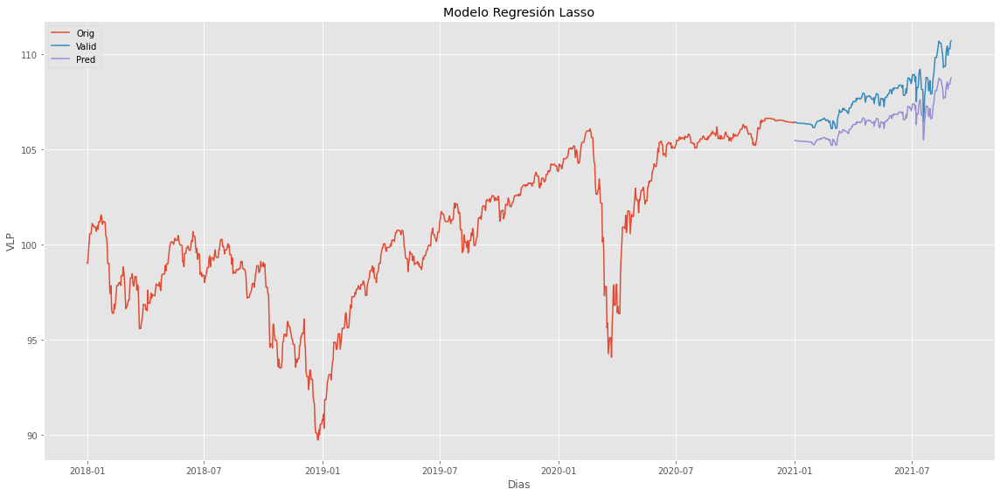

In [315]:
# Visualización de datos general
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(FI_RV_Glob_df_Reg_60['VLP'][:1096])
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Orig','Valid','Pred'])
plt.show()

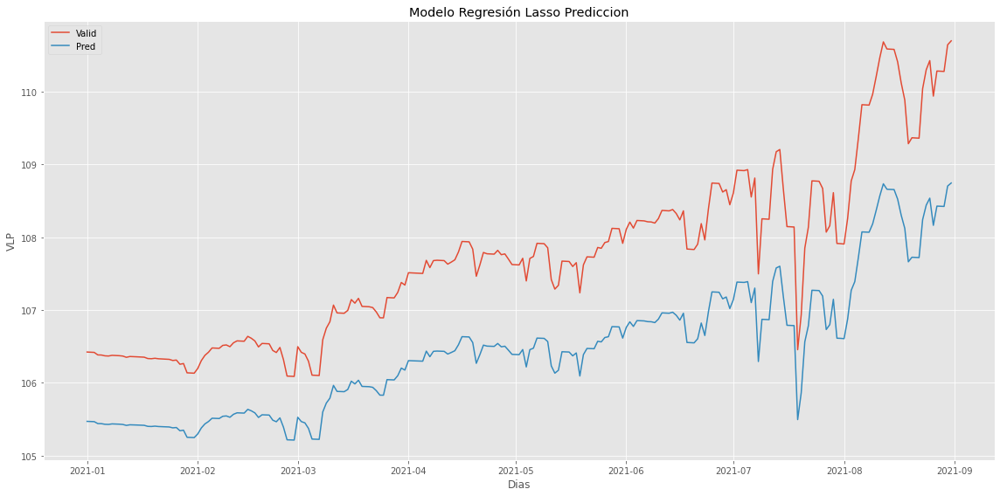

In [316]:
# Visualización de datos prediccion
plt.figure(figsize=(16,8))
plt.title('Modelo Regresión Lasso Prediccion')
plt.xlabel('Dias')
plt.ylabel('VLP')
plt.plot(Pred_vs_orig_df[['VLP','Prediccion_Lasso']])
plt.legend(['Valid','Pred'])
plt.show()

In [317]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada regresión

# Calculo indicadores Regresión Lineal
mse_lr_FI5_60 = round(mean_squared_error(X_test,lin_pred),5)
rmse_lr_FI5_60 = round(sqrt(mean_squared_error(X_test,lin_pred)),5)
mae_lr_FI5_60 = round(mean_absolute_error(X_test,lin_pred),5)
r2_lr_FI5_60 = round(r2_score(X_test,lin_pred),5)

# Calculo indicadores Ridge
mse_r_FI5_60 = round(mean_squared_error(X_test,R_pred),5)
rmse_r_FI5_60 = round(sqrt(mean_squared_error(X_test,R_pred)),5)
mae_r_FI5_60 = round(mean_absolute_error(X_test,R_pred),5)
r2_r_FI5_60 = round(r2_score(X_test,R_pred),5)

# Calculo indicadores Lasso
mse_l_FI5_60 = round(mean_squared_error(X_test,Lasso_pred),5)
rmse_l_FI5_60 = round(sqrt(mean_squared_error(X_test,Lasso_pred)),5)
mae_l_FI5_60 = round(mean_absolute_error(X_test,Lasso_pred),5)
r2_l_FI5_60 = round(r2_score(X_test,Lasso_pred),5)

In [318]:
# Print de resultados

# Resultados Regresión Lineal
print('El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',mse_lr_FI5_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_lr_FI5_60)
print('El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es:',mae_lr_FI5_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es:',r2_lr_FI5_60)

# Resultados Ridge
print('El Error Cuadrático Medio para el Modelo de Ridge de 60 días es:',mse_r_FI5_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_r_FI5_60)
print('El Error Absoluto Medio para el Modelo de Ridge de 60 días es:',mae_r_FI5_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es:',r2_r_FI5_60)

#Resultados Lasso
print('El Error Cuadrático Medio para el Modelo de Lasso de 60 días es:',mse_l_FI5_60)
print('La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es:',rmse_l_FI5_60)
print('El Error Absoluto Medio para el Modelo de Lasso de 60 días es:',mae_l_FI5_60)
print('El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es:',r2_l_FI5_60)

El Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 1.64875
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 1.28404
El Error Absoluto Medio para el Modelo de Regresión Lineal de 60 días es: 1.25461
El Coeficiente de Determinación (R2) para el Modelo de Regresión Lineal de 60 días es: -0.20855
El Error Cuadrático Medio para el Modelo de Ridge de 60 días es: 1.67285
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 1.29339
El Error Absoluto Medio para el Modelo de Ridge de 60 días es: 1.26384
El Coeficiente de Determinación (R2) para el Modelo de Ridge de 60 días es: -0.22622
El Error Cuadrático Medio para el Modelo de Lasso de 60 días es: 1.64875
La Raíz de Error Cuadrático Medio para el Modelo de Regresión Lineal de 60 días es: 1.28404
El Error Absoluto Medio para el Modelo de Lasso de 60 días es: 1.25461
El Coeficiente de Determinación (R2) para el Modelo de Lasso de 60 días es: -0.20855


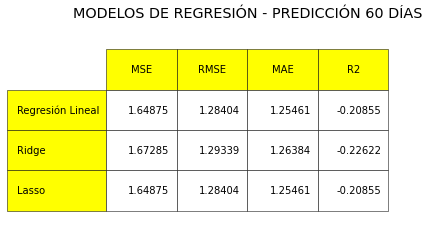

In [545]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI5_60 = [[mse_lr_FI5_60,rmse_lr_FI5_60,mae_lr_FI5_60,r2_lr_FI5_60],
               [mse_r_FI5_60,rmse_r_FI5_60,mae_r_FI5_60,r2_r_FI5_60],
               [mse_l_FI5_60,rmse_l_FI5_60,mae_l_FI5_60,r2_l_FI5_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI5_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Regresión Lineal","Ridge","Lasso"],
                      rowColours =["yellow"] * 3,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(10)
the_table.scale(1.5,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

## **REDES NEURONALES RECURRENTES (RNN) - LONG SHORT TERM MEMORY (LSTM)**

In [320]:
# Importación librerías típicas
from sklearn.preprocessing import MinMaxScaler # Se usa para la normalizacion
from keras.models import Sequential # Para iniciar la red
from keras.layers import Dense
from keras.layers import LSTM # Para agregar la capa que hace la funcion LSTM
from keras.layers import Dropout # Para evitar overfitting

### **1. Fondo de Renta Fija Euro: CaixaBank Duración Flexible 0-2, FI Clase Universal**

#### *PREDICCIONES A 30 DÍAS*

In [321]:
# Creación de dataset a partir del principal de Renta Fija Euro, indexando la Fecha
FI_RF_Eur_df_RNN_30 = FI_RF_Eur_df

In [322]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_RF_Eur_df.iloc[:1096, 0:1].values
training_set

array([[10.68647806],
       [10.6867612 ],
       [10.69051594],
       ...,
       [10.64253344],
       [10.63994803],
       [10.6404665 ]])

In [323]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 30 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 30 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 30 pasos va a corresponder con 1 mes de datos financieros

In [324]:
# Estructura con 30 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 30 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 30 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [325]:
for i in range(30,1096):
  X_train.append(training_set_escalado[i-30:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 30, todos los valores a la derecha son los valores de los 30 dias previos al de la izquierda y asi sucesivamente.

In [326]:
X_train

array([[0.97838811, 0.97904499, 0.98775604, ..., 0.9594251 , 0.95029308,
        0.95136439],
       [0.97904499, 0.98775604, 0.98980451, ..., 0.95029308, 0.95136439,
        0.9519902 ],
       [0.98775604, 0.98980451, 0.99120746, ..., 0.95136439, 0.9519902 ,
        0.96446257],
       ...,
       [0.88242238, 0.87439795, 0.86129278, ..., 0.86480752, 0.86541751,
        0.87375878],
       [0.87439795, 0.86129278, 0.86584093, ..., 0.86541751, 0.87375878,
        0.87643611],
       [0.86129278, 0.86584093, 0.87629394, ..., 0.87375878, 0.87643611,
        0.87043794]])

In [327]:
len(X_train)

1066

In [328]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.97838811],
        [0.97904499],
        [0.98775604],
        ...,
        [0.9594251 ],
        [0.95029308],
        [0.95136439]],

       [[0.97904499],
        [0.98775604],
        [0.98980451],
        ...,
        [0.95029308],
        [0.95136439],
        [0.9519902 ]],

       [[0.98775604],
        [0.98980451],
        [0.99120746],
        ...,
        [0.95136439],
        [0.9519902 ],
        [0.96446257]],

       ...,

       [[0.88242238],
        [0.87439795],
        [0.86129278],
        ...,
        [0.86480752],
        [0.86541751],
        [0.87375878]],

       [[0.87439795],
        [0.86129278],
        [0.86584093],
        ...,
        [0.86541751],
        [0.87375878],
        [0.87643611]],

       [[0.86129278],
        [0.86584093],
        [0.87629394],
        ...,
        [0.87375878],
        [0.87643611],
        [0.87043794]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [329]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 13s 34ms/step - loss: 0.0732
Epoch 2/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0158
Epoch 3/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0125
Epoch 4/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0111
Epoch 5/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0107
Epoch 6/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0102
Epoch 7/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0097
Epoch 8/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0099
Epoch 9/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0083
Epoch 10/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0093
Epoch 11/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0086
Epoch 12/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0075
Epoch 13/100
34/34 [====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [330]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 35ms/step - loss: 0.0924
Epoch 2/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0179
Epoch 3/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0139
Epoch 4/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0111
Epoch 5/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0114
Epoch 6/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0095
Epoch 7/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0093
Epoch 8/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0103
Epoch 9/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0101
Epoch 10/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0086
Epoch 11/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0081
Epoch 12/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0076
Epoch 13/100
34/34 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [331]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 38ms/step - loss: 0.0538
Epoch 2/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0245
Epoch 3/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0222
Epoch 4/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0212
Epoch 5/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0176
Epoch 6/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0162
Epoch 7/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0175
Epoch 8/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0126
Epoch 9/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0126
Epoch 10/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0121
Epoch 11/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0114
Epoch 12/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0101
Epoch 13/100
34/34 [=====

2. Entrenamos con 120 iteraciones

In [332]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 38ms/step - loss: 0.0646
Epoch 2/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0247
Epoch 3/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0230
Epoch 4/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0204
Epoch 5/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0190
Epoch 6/100
34/34 [==============================] - 1s 36ms/step - loss: 0.0169
Epoch 7/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0147
Epoch 8/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0147
Epoch 9/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0133
Epoch 10/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0125
Epoch 11/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0118
Epoch 12/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0113
Epoch 13/100
34/34 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [333]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 30 valores del train
test_set = training_set[-30:]
test_set = np.append(test_set ,FI_RF_Eur_df_RNN_30.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

273

In [334]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_RF_Eur_df_RNN_30.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(30, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-30:i, 0])

In [335]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [336]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la prediccion con los diferentes optimizadores y los diferentes números de iteraciones

In [337]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

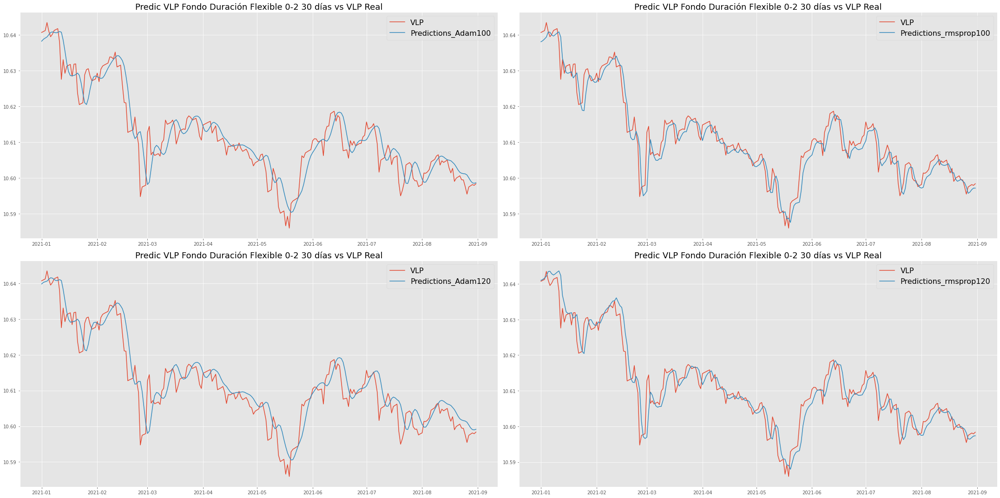

In [338]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_RF_Eur_df_RNN_30.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Duración Flexible 0-2 30 días vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Duración Flexible 0-2 30 días vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Duración Flexible 0-2 30 días vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Duración Flexible 0-2 30 días vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [339]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI1_30 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI1_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI1_30 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI1_30 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI1_30 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI1_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI1_30 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI1_30 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI1_30 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI1_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI1_30 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI1_30 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI1_30 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI1_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI1_30 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI1_30 = round(r2_score(y_test,predictions_rmsprop120),5)

In [340]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mse_a100_FI1_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',rmse_a100_FI1_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mae_a100_FI1_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es:',r2_a100_FI1_30)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mse_a120_FI1_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',rmse_a120_FI1_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mae_a120_FI1_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es:',r2_a120_FI1_30)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mse_rms100_FI1_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',rmse_rms100_FI1_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mae_rms100_FI1_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',r2_rms100_FI1_30)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mse_rms120_FI1_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',rmse_rms120_FI1_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mae_rms120_FI1_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',r2_rms120_FI1_30)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 2e-05
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.00449
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.00332
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.86425
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 2e-05
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.0045
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.00329
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.86363
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 1e-05
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 0.0033
El Error Absoluto Medio para la Red Optimizador

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


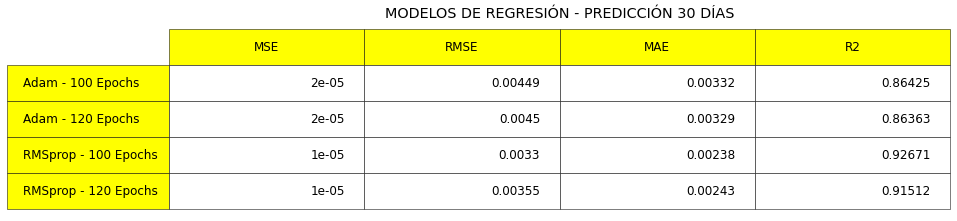

In [341]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI1_30 = [[mse_a100_FI1_30,rmse_a100_FI1_30,mae_a100_FI1_30,r2_a100_FI1_30],
               [mse_a120_FI1_30,rmse_a120_FI1_30,mae_a120_FI1_30,r2_a120_FI1_30],
               [mse_rms100_FI1_30,rmse_rms100_FI1_30,mae_rms100_FI1_30,r2_rms100_FI1_30],
               [mse_rms120_FI1_30,rmse_rms120_FI1_30,mae_rms120_FI1_30,r2_rms120_FI1_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI1_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [342]:
# Creación de dataset a partir del principal de Renta Fija Euro, indexando la Fecha
FI_RF_Eur_df_RNN_60 = FI_RF_Eur_df

In [343]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_RF_Eur_df.iloc[:1096, 0:1].values
training_set

array([[10.68647806],
       [10.6867612 ],
       [10.69051594],
       ...,
       [10.64253344],
       [10.63994803],
       [10.6404665 ]])

In [344]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 60 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 60 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 60 pasos va a corresponder con 1 mes de datos financieros

In [345]:
# Estructura con 60 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 60 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 60 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [346]:
for i in range(60,1096):
  X_train.append(training_set_escalado[i-60:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 60, todos los valores a la derecha son los valores de los 60 dias previos al de la izquierda y asi sucesivamente.

In [347]:
X_train

array([[0.97838811, 0.97904499, 0.98775604, ..., 0.94735869, 0.95719286,
        0.95569521],
       [0.97904499, 0.98775604, 0.98980451, ..., 0.95719286, 0.95569521,
        0.94945273],
       [0.98775604, 0.98980451, 0.99120746, ..., 0.95569521, 0.94945273,
        0.95017364],
       ...,
       [0.79316019, 0.79374598, 0.79440412, ..., 0.86480752, 0.86541751,
        0.87375878],
       [0.79374598, 0.79440412, 0.80146297, ..., 0.86541751, 0.87375878,
        0.87643611],
       [0.79440412, 0.80146297, 0.80749551, ..., 0.87375878, 0.87643611,
        0.87043794]])

In [348]:
len(X_train)

1036

In [349]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.97838811],
        [0.97904499],
        [0.98775604],
        ...,
        [0.94735869],
        [0.95719286],
        [0.95569521]],

       [[0.97904499],
        [0.98775604],
        [0.98980451],
        ...,
        [0.95719286],
        [0.95569521],
        [0.94945273]],

       [[0.98775604],
        [0.98980451],
        [0.99120746],
        ...,
        [0.95569521],
        [0.94945273],
        [0.95017364]],

       ...,

       [[0.79316019],
        [0.79374598],
        [0.79440412],
        ...,
        [0.86480752],
        [0.86541751],
        [0.87375878]],

       [[0.79374598],
        [0.79440412],
        [0.80146297],
        ...,
        [0.86541751],
        [0.87375878],
        [0.87643611]],

       [[0.79440412],
        [0.80146297],
        [0.80749551],
        ...,
        [0.87375878],
        [0.87643611],
        [0.87043794]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [350]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 59ms/step - loss: 0.0796
Epoch 2/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0177
Epoch 3/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0127
Epoch 4/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0113
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0114
Epoch 6/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0098
Epoch 7/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0106
Epoch 8/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0089
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0081
Epoch 10/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0076
Epoch 11/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0082
Epoch 12/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0075
Epoch 13/100
33/33 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [351]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 9s 60ms/step - loss: 0.0723
Epoch 2/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0164
Epoch 3/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0128
Epoch 4/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0112
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0097
Epoch 6/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0099
Epoch 7/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0088
Epoch 8/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0092
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0089
Epoch 10/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0077
Epoch 11/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0072
Epoch 12/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0082
Epoch 13/100
33/33 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [352]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 61ms/step - loss: 0.0440
Epoch 2/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0235
Epoch 3/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0208
Epoch 4/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0181
Epoch 5/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0163
Epoch 6/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0162
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0142
Epoch 8/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0139
Epoch 9/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0126
Epoch 10/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0119
Epoch 11/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0112
Epoch 12/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0098
Epoch 13/100
33/33 [=====

2. Entrenamos con 120 iteraciones

In [353]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 10s 63ms/step - loss: 0.0570
Epoch 2/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0239
Epoch 3/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0227
Epoch 4/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0201
Epoch 5/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0170
Epoch 6/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0155
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0142
Epoch 8/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0130
Epoch 9/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0124
Epoch 10/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0109
Epoch 11/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0111
Epoch 12/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0092
Epoch 13/100
33/33 [====

PARTE 3 - PREDICCION Y VISUALIZACION

In [354]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 60 valores del train
test_set = training_set[-60:]
test_set = np.append(test_set ,FI_RF_Eur_df_RNN_60.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

303

In [355]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_RF_Eur_df_RNN_60.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(60, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-60:i, 0])

In [356]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [357]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la prediccion con los diferentes optimizadores y los diferentes números de iteraciones

In [358]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

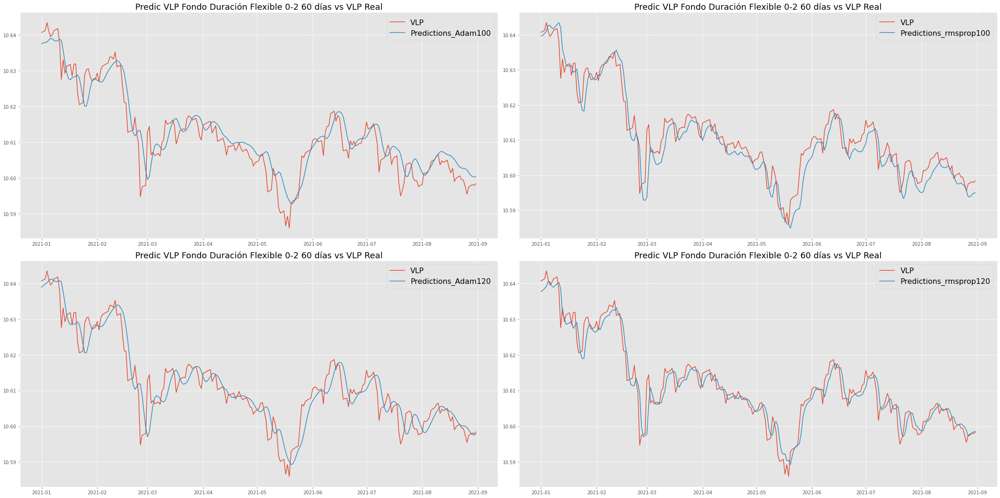

In [359]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_RF_Eur_df_RNN_60.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Duración Flexible 0-2 60 días vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Duración Flexible 0-2 60 días vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Duración Flexible 0-2 60 días vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Duración Flexible 0-2 60 días vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [360]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI1_60 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI1_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI1_60 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI1_60 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI1_60 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI1_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI1_60 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI1_60 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI1_60 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI1_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI1_60 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI1_60 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI1_60 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI1_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI1_60 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI1_60 = round(r2_score(y_test,predictions_rmsprop120),5)

In [361]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mse_a100_FI1_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',rmse_a100_FI1_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mae_a100_FI1_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es:',r2_a100_FI1_60)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mse_a120_FI1_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',rmse_a120_FI1_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mae_a120_FI1_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es:',r2_a120_FI1_60)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mse_rms100_FI1_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',rmse_rms100_FI1_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mae_rms100_FI1_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',r2_rms100_FI1_60)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mse_rms120_FI1_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',rmse_rms120_FI1_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mae_rms120_FI1_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',r2_rms120_FI1_60)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 2e-05
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.00453
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.00337
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.86209
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 2e-05
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.00431
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.00316
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.87493
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 2e-05
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 0.00404
El Error Absoluto Medio para la Red Optimizad

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


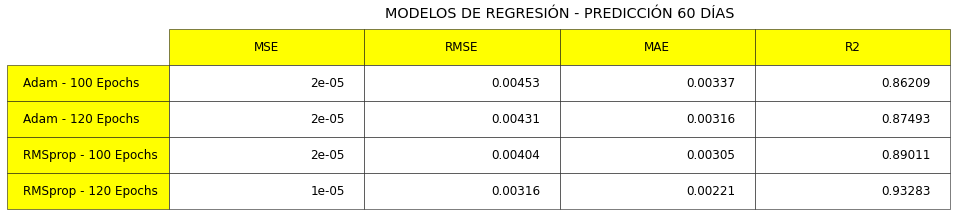

In [362]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI1_60 = [[mse_a100_FI1_60,rmse_a100_FI1_60,mae_a100_FI1_60,r2_a100_FI1_60],
               [mse_a120_FI1_60,rmse_a120_FI1_60,mae_a120_FI1_60,r2_a120_FI1_60],
               [mse_rms100_FI1_60,rmse_rms100_FI1_60,mae_rms100_FI1_60,r2_rms100_FI1_60],
               [mse_rms120_FI1_60,rmse_rms120_FI1_60,mae_rms120_FI1_60,r2_rms120_FI1_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI1_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

### **2. Fondo de Renta Fija Internacional: CaixaBank Bonos Internacional, FI Clase Universal**

#### *PREDICCIONES A 30 DÍAS*

In [363]:
# Creación de dataset a partir del principal de Renta Fija Internacional, indexando la Fecha
FI_RF_Int_df_RNN_30 = FI_RF_Int_df

In [364]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_RF_Int_df.iloc[:1096, 0:1].values
training_set

array([[ 9.8525982 ],
       [ 9.84773808],
       [ 9.86472244],
       ...,
       [10.28568361],
       [10.27912694],
       [10.29812822]])

In [365]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 30 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 30 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 30 pasos va a corresponder con 1 mes de datos financieros

In [366]:
# Estructura con 30 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 30 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 30 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [367]:
for i in range(30,1096):
  X_train.append(training_set_escalado[i-30:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 30, todos los valores a la derecha son los valores de los 30 dias previos al de la izquierda y asi sucesivamente.

In [368]:
X_train

array([[0.26075323, 0.25501667, 0.27506387, ..., 0.17404314, 0.18106253,
        0.17036121],
       [0.25501667, 0.27506387, 0.26399705, ..., 0.18106253, 0.17036121,
        0.16798096],
       [0.27506387, 0.26399705, 0.2750111 , ..., 0.17036121, 0.16798096,
        0.14119658],
       ...,
       [0.82173515, 0.83120838, 0.77660549, ..., 0.7778829 , 0.7776182 ,
        0.77531631],
       [0.83120838, 0.77660549, 0.76195496, ..., 0.7776182 , 0.77531631,
        0.77193806],
       [0.77660549, 0.76195496, 0.77036728, ..., 0.77531631, 0.77193806,
        0.76419901]])

In [369]:
len(X_train)

1066

In [370]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.26075323],
        [0.25501667],
        [0.27506387],
        ...,
        [0.17404314],
        [0.18106253],
        [0.17036121]],

       [[0.25501667],
        [0.27506387],
        [0.26399705],
        ...,
        [0.18106253],
        [0.17036121],
        [0.16798096]],

       [[0.27506387],
        [0.26399705],
        [0.2750111 ],
        ...,
        [0.17036121],
        [0.16798096],
        [0.14119658]],

       ...,

       [[0.82173515],
        [0.83120838],
        [0.77660549],
        ...,
        [0.7778829 ],
        [0.7776182 ],
        [0.77531631]],

       [[0.83120838],
        [0.77660549],
        [0.76195496],
        ...,
        [0.7776182 ],
        [0.77531631],
        [0.77193806]],

       [[0.77660549],
        [0.76195496],
        [0.77036728],
        ...,
        [0.77531631],
        [0.77193806],
        [0.76419901]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [371]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 35ms/step - loss: 0.0587
Epoch 2/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0097
Epoch 3/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0087
Epoch 4/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0083
Epoch 5/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0078
Epoch 6/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0087
Epoch 7/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0066
Epoch 8/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0065
Epoch 9/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0074
Epoch 10/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0069
Epoch 11/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0063
Epoch 12/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0053
Epoch 13/100
34/34 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [372]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 7s 34ms/step - loss: 0.0541
Epoch 2/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0103
Epoch 3/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0089
Epoch 4/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0084
Epoch 5/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0067
Epoch 6/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0071
Epoch 7/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0065
Epoch 8/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0062
Epoch 9/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0062
Epoch 10/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0058
Epoch 11/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0059
Epoch 12/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0061
Epoch 13/100
34/34 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [373]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 38ms/step - loss: 0.0340
Epoch 2/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0176
Epoch 3/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0150
Epoch 4/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0144
Epoch 5/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0115
Epoch 6/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0104
Epoch 7/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0112
Epoch 8/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0095
Epoch 9/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0090
Epoch 10/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0090
Epoch 11/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0080
Epoch 12/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0072
Epoch 13/100
34/34 [=====

2. Entrenamos con 120 iteraciones

In [374]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 9s 38ms/step - loss: 0.0438
Epoch 2/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0170
Epoch 3/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0137
Epoch 4/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0118
Epoch 5/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0112
Epoch 6/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0102
Epoch 7/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0102
Epoch 8/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0093
Epoch 9/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0082
Epoch 10/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0077
Epoch 11/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0080
Epoch 12/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0081
Epoch 13/100
34/34 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [375]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 30 valores del train
test_set = training_set[-30:]
test_set = np.append(test_set ,FI_RF_Int_df_RNN_30.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

273

In [376]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_RF_Int_df_RNN_30.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(30, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-30:i, 0])

In [377]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [378]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la predicción con los diferentes optimizadores y los diferentes números de iteraciones

In [379]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

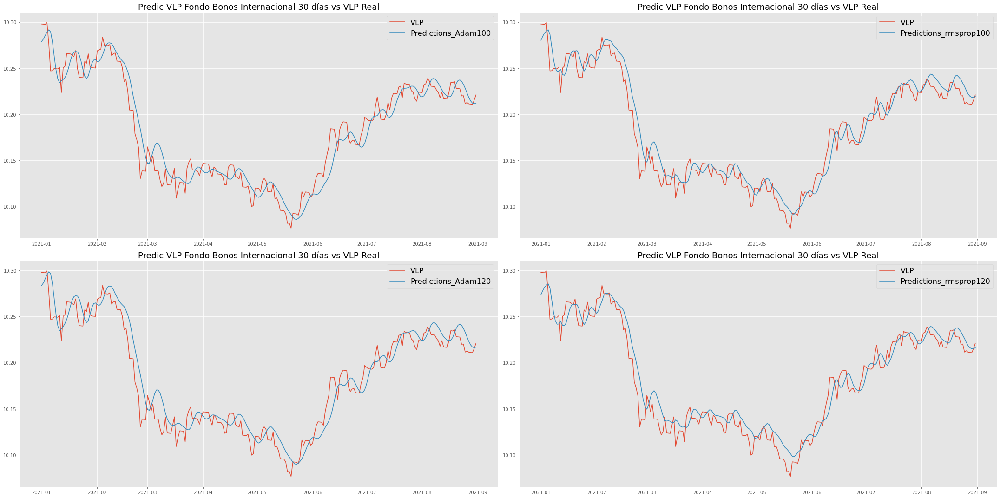

In [380]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_RF_Int_df_RNN_30.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Bonos Internacional 30 días vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Bonos Internacional 30 días vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Bonos Internacional 30 días vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Bonos Internacional 30 días vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [381]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI2_30 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI2_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI2_30 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI2_30 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI2_30 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI2_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI2_30 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI2_30 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI2_30 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI2_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI2_30 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI2_30 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI2_30 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI2_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI2_30 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI2_30 = round(r2_score(y_test,predictions_rmsprop120),5)

In [382]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mse_a100_FI2_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',rmse_a100_FI2_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mae_a100_FI2_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es:',r2_a100_FI2_30)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mse_a120_FI2_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',rmse_a120_FI2_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mae_a120_FI2_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es:',r2_a120_FI2_30)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mse_rms100_FI2_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',rmse_rms100_FI2_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mae_rms100_FI2_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',r2_rms100_FI2_30)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mse_rms120_FI2_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',rmse_rms120_FI2_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mae_rms120_FI2_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',r2_rms120_FI2_30)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.00022
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.01496
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.01197
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.93006
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.00025
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.01566
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.01253
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.92334
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 0.00018
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 0.01355
El Error Absoluto Medio para la Red Opt

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


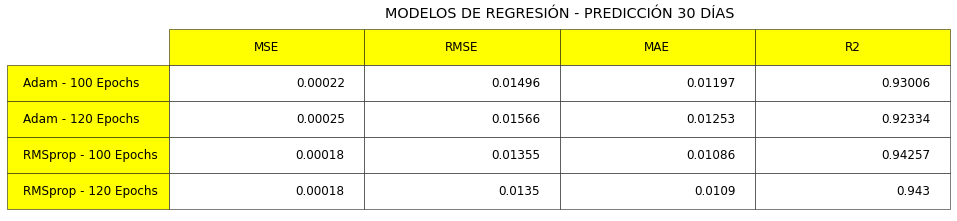

In [383]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI2_30 = [[mse_a100_FI2_30,rmse_a100_FI2_30,mae_a100_FI2_30,r2_a100_FI2_30],
               [mse_a120_FI2_30,rmse_a120_FI2_30,mae_a120_FI2_30,r2_a120_FI2_30],
               [mse_rms100_FI2_30,rmse_rms100_FI2_30,mae_rms100_FI2_30,r2_rms100_FI2_30],
               [mse_rms120_FI2_30,rmse_rms120_FI2_30,mae_rms120_FI2_30,r2_rms120_FI2_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI2_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [384]:
# Creación de dataset a partir del principal de Renta Fija Euro, indexando la Fecha
FI_RF_Int_df_RNN_60 = FI_RF_Int_df

In [385]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_RF_Int_df.iloc[:1096, 0:1].values
training_set

array([[ 9.8525982 ],
       [ 9.84773808],
       [ 9.86472244],
       ...,
       [10.28568361],
       [10.27912694],
       [10.29812822]])

In [386]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 60 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 60 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 60 pasos va a corresponder con 1 mes de datos financieros

In [387]:
# Estructura con 60 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 60 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 60 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [388]:
for i in range(60,1096):
  X_train.append(training_set_escalado[i-60:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 60, todos los valores a la derecha son los valores de los 60 dias previos al de la izquierda y asi sucesivamente.

In [389]:
X_train

array([[0.26075323, 0.25501667, 0.27506387, ..., 0.16965171, 0.18112607,
        0.16382069],
       [0.25501667, 0.27506387, 0.26399705, ..., 0.18112607, 0.16382069,
        0.1420852 ],
       [0.27506387, 0.26399705, 0.2750111 , ..., 0.16382069, 0.1420852 ,
        0.1428017 ],
       ...,
       [0.78825232, 0.78797667, 0.78766566, ..., 0.7778829 , 0.7776182 ,
        0.77531631],
       [0.78797667, 0.78766566, 0.79617815, ..., 0.7776182 , 0.77531631,
        0.77193806],
       [0.78766566, 0.79617815, 0.77508176, ..., 0.77531631, 0.77193806,
        0.76419901]])

In [390]:
len(X_train)

1036

In [391]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.26075323],
        [0.25501667],
        [0.27506387],
        ...,
        [0.16965171],
        [0.18112607],
        [0.16382069]],

       [[0.25501667],
        [0.27506387],
        [0.26399705],
        ...,
        [0.18112607],
        [0.16382069],
        [0.1420852 ]],

       [[0.27506387],
        [0.26399705],
        [0.2750111 ],
        ...,
        [0.16382069],
        [0.1420852 ],
        [0.1428017 ]],

       ...,

       [[0.78825232],
        [0.78797667],
        [0.78766566],
        ...,
        [0.7778829 ],
        [0.7776182 ],
        [0.77531631]],

       [[0.78797667],
        [0.78766566],
        [0.79617815],
        ...,
        [0.7776182 ],
        [0.77531631],
        [0.77193806]],

       [[0.78766566],
        [0.79617815],
        [0.77508176],
        ...,
        [0.77531631],
        [0.77193806],
        [0.76419901]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [392]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 9s 60ms/step - loss: 0.0567
Epoch 2/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0103
Epoch 3/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0079
Epoch 4/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0094
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0080
Epoch 6/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0066
Epoch 7/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0065
Epoch 8/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0069
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0060
Epoch 10/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0067
Epoch 11/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0062
Epoch 12/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0070
Epoch 13/100
33/33 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [393]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 60ms/step - loss: 0.0604
Epoch 2/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0088
Epoch 3/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0078
Epoch 4/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0075
Epoch 5/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0076
Epoch 6/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0083
Epoch 7/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0076
Epoch 8/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0066
Epoch 9/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0071
Epoch 10/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0064
Epoch 11/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0057
Epoch 12/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0058
Epoch 13/100
33/33 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [394]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 10s 64ms/step - loss: 0.0430
Epoch 2/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0174
Epoch 3/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0146
Epoch 4/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0131
Epoch 5/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0114
Epoch 6/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0111
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0103
Epoch 8/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0093
Epoch 9/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0082
Epoch 10/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0078
Epoch 11/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0074
Epoch 12/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0071
Epoch 13/100
33/33 [====

2. Entrenamos con 120 iteraciones

In [395]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 9s 63ms/step - loss: 0.0412
Epoch 2/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0155
Epoch 3/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0141
Epoch 4/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0111
Epoch 5/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0115
Epoch 6/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0098
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0103
Epoch 8/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0090
Epoch 9/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0080
Epoch 10/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0072
Epoch 11/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0072
Epoch 12/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0072
Epoch 13/100
33/33 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [396]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 60 valores del train
test_set = training_set[-60:]
test_set = np.append(test_set ,FI_RF_Int_df_RNN_60.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

303

In [397]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_RF_Int_df_RNN_60.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(60, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-60:i, 0])

In [398]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [399]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la prediccion con los diferentes optimizadores y los diferentes números de iteraciones

In [400]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

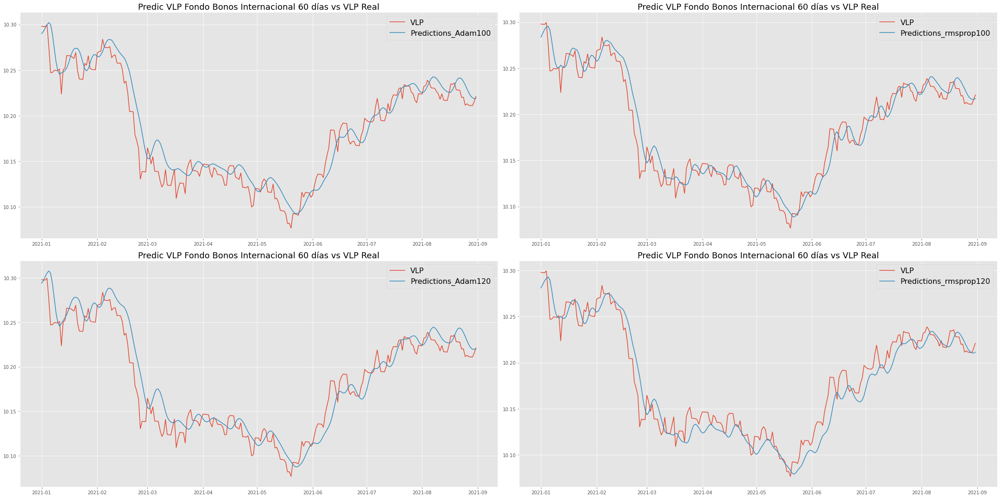

In [401]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_RF_Int_df_RNN_60.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Bonos Internacional 60 días vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Bonos Internacional 60 días vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Bonos Internacional 60 días vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Bonos Internacional 60 días vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [402]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI2_60 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI2_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI2_60 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI2_60 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI2_60 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI2_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI2_60 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI2_60 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI2_60 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI2_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI2_60 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI2_60 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI2_60 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI2_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI2_60 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI2_60 = round(r2_score(y_test,predictions_rmsprop120),5)

In [403]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mse_a100_FI2_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',rmse_a100_FI2_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mae_a100_FI2_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es:',r2_a100_FI2_60)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mse_a120_FI2_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',rmse_a120_FI2_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mae_a120_FI2_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es:',r2_a120_FI2_60)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mse_rms100_FI2_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',rmse_rms100_FI2_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mae_rms100_FI2_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',r2_rms100_FI2_60)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mse_rms120_FI2_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',rmse_rms120_FI2_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mae_rms120_FI2_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',r2_rms120_FI2_60)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.00028
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.01675
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.01315
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.91226
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.00031
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.01756
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.01362
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.90362
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 0.00019
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 0.01385
El Error Absoluto Medio para la Red Opt

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


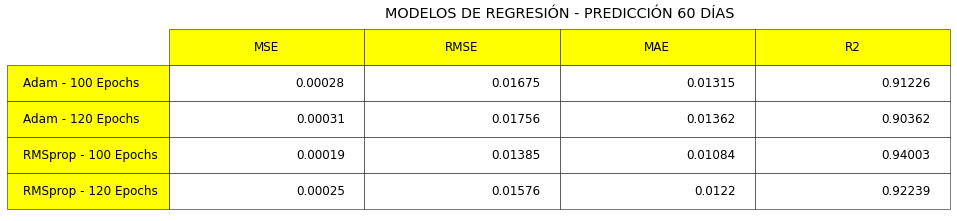

In [404]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI2_60 = [[mse_a100_FI2_60,rmse_a100_FI2_60,mae_a100_FI2_60,r2_a100_FI2_60],
               [mse_a120_FI2_60,rmse_a120_FI2_60,mae_a120_FI2_60,r2_a120_FI2_60],
               [mse_rms100_FI2_60,rmse_rms100_FI2_60,mae_rms100_FI2_60,r2_rms100_FI2_60],
               [mse_rms120_FI2_60,rmse_rms120_FI2_60,mae_rms120_FI2_60,r2_rms120_FI2_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI2_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

### **3. Fondo de Gestión Alternativa: CaixaBank Gestion Activa, FI**

#### *PREDICCIONES A 30 DÍAS*

In [405]:
# Creación de dataset a partir del principal de Gestión Alternativa, indexando la Fecha
FI_Gest_Alt_df_RNN_30 = FI_Gest_Alt_df

In [406]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_Gest_Alt_df.iloc[:1096, 0:1].values
training_set

array([[98.921245],
       [98.94785 ],
       [99.027256],
       ...,
       [96.511994],
       [96.497274],
       [96.58956 ]])

In [407]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 30 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 30 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 30 pasos va a corresponder con 1 mes de datos financieros

In [408]:
# Estructura con 30 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 30 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 30 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [409]:
for i in range(30,1096):
  X_train.append(training_set_escalado[i-30:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 30, todos los valores a la derecha son los valores de los 30 dias previos al de la izquierda y asi sucesivamente.

In [410]:
X_train

array([[0.96692317, 0.96936994, 0.97667262, ..., 0.99599826, 0.99247512,
        0.983751  ],
       [0.96936994, 0.97667262, 0.98106862, ..., 0.99247512, 0.983751  ,
        0.98149737],
       [0.97667262, 0.98106862, 0.9850515 , ..., 0.983751  , 0.98149737,
        0.9815474 ],
       ...,
       [0.73148286, 0.71976873, 0.7224466 , ..., 0.74747352, 0.7472631 ,
        0.74443219],
       [0.71976873, 0.7224466 , 0.71503761, ..., 0.7472631 , 0.74443219,
        0.74535296],
       [0.7224466 , 0.71503761, 0.71608694, ..., 0.74443219, 0.74535296,
        0.74399921]])

In [411]:
len(X_train)

1066

In [412]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.96692317],
        [0.96936994],
        [0.97667262],
        ...,
        [0.99599826],
        [0.99247512],
        [0.983751  ]],

       [[0.96936994],
        [0.97667262],
        [0.98106862],
        ...,
        [0.99247512],
        [0.983751  ],
        [0.98149737]],

       [[0.97667262],
        [0.98106862],
        [0.9850515 ],
        ...,
        [0.983751  ],
        [0.98149737],
        [0.9815474 ]],

       ...,

       [[0.73148286],
        [0.71976873],
        [0.7224466 ],
        ...,
        [0.74747352],
        [0.7472631 ],
        [0.74443219]],

       [[0.71976873],
        [0.7224466 ],
        [0.71503761],
        ...,
        [0.7472631 ],
        [0.74443219],
        [0.74535296]],

       [[0.7224466 ],
        [0.71503761],
        [0.71608694],
        ...,
        [0.74443219],
        [0.74535296],
        [0.74399921]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [413]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 7s 35ms/step - loss: 0.0814
Epoch 2/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0147
Epoch 3/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0117
Epoch 4/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0101
Epoch 5/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0115
Epoch 6/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0094
Epoch 7/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0096
Epoch 8/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0091
Epoch 9/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0079
Epoch 10/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0078
Epoch 11/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0083
Epoch 12/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0095
Epoch 13/100
34/34 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [414]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 34ms/step - loss: 0.0911
Epoch 2/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0169
Epoch 3/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0133
Epoch 4/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0117
Epoch 5/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0106
Epoch 6/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0090
Epoch 7/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0100
Epoch 8/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0084
Epoch 9/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0089
Epoch 10/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0090
Epoch 11/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0082
Epoch 12/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0078
Epoch 13/100
34/34 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [415]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 38ms/step - loss: 0.0482
Epoch 2/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0248
Epoch 3/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0188
Epoch 4/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0180
Epoch 5/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0172
Epoch 6/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0159
Epoch 7/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0149
Epoch 8/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0123
Epoch 9/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0122
Epoch 10/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0111
Epoch 11/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0107
Epoch 12/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0097
Epoch 13/100
34/34 [=====

2. Entrenamos con 120 iteraciones

In [416]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 9s 38ms/step - loss: 0.0598
Epoch 2/100
34/34 [==============================] - 1s 39ms/step - loss: 0.0233
Epoch 3/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0182
Epoch 4/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0193
Epoch 5/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0164
Epoch 6/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0157
Epoch 7/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0135
Epoch 8/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0132
Epoch 9/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0133
Epoch 10/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0125
Epoch 11/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0100
Epoch 12/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0112
Epoch 13/100
34/34 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [417]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 30 valores del train
test_set = training_set[-30:]
test_set = np.append(test_set ,FI_Gest_Alt_df_RNN_30.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

273

In [418]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_Gest_Alt_df_RNN_30.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(30, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-30:i, 0])

In [419]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [420]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la predicción con los diferentes optimizadores y los diferentes números de iteraciones

In [421]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

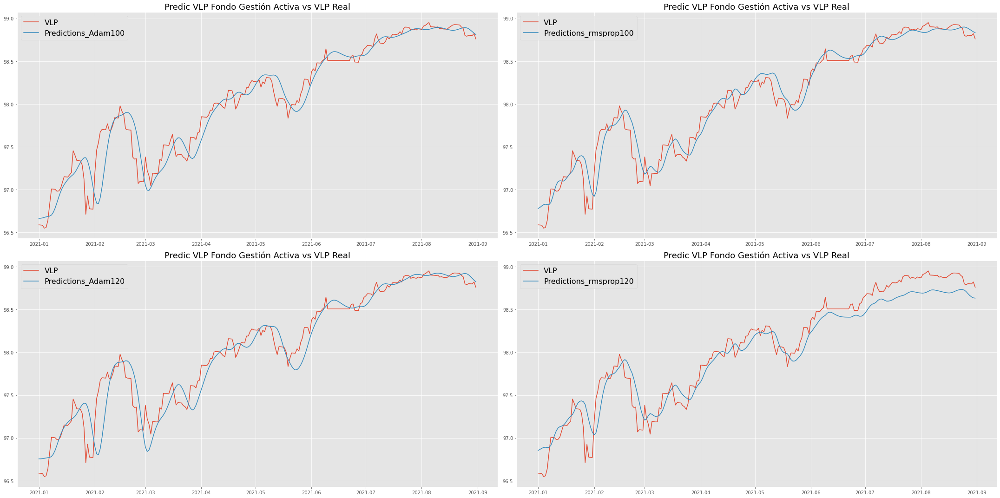

In [422]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_Gest_Alt_df_RNN_30.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Gestión Activa vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Gestión Activa vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Gestión Activa vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Gestión Activa vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [423]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI3_30 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI3_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI3_30 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI3_30 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI3_30 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI3_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI3_30 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI3_30 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI3_30 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI3_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI3_30 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI3_30 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI3_30 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI3_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI3_30 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI3_30 = round(r2_score(y_test,predictions_rmsprop120),5)

In [424]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mse_a100_FI3_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',rmse_a100_FI3_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mae_a100_FI3_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es:',r2_a100_FI3_30)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mse_a120_FI3_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',rmse_a120_FI3_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mae_a120_FI3_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es:',r2_a120_FI3_30)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mse_rms100_FI3_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',rmse_rms100_FI3_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mae_rms100_FI3_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',r2_rms100_FI3_30)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mse_rms120_FI3_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',rmse_rms120_FI3_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mae_rms120_FI3_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',r2_rms120_FI3_30)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.03004
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.17333
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.11496
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.93076
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.03263
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.18065
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.12047
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.92478
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 0.01893
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 0.1376
El Error Absoluto Medio para la Red Opti

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


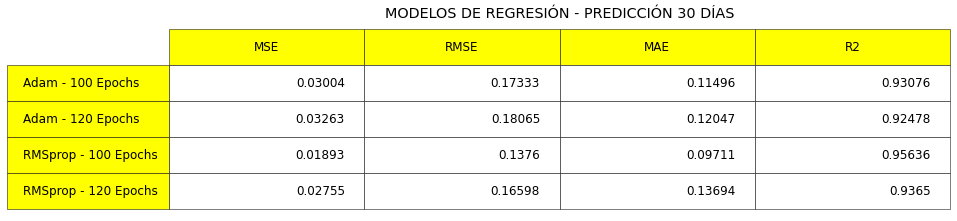

In [425]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI3_30 = [[mse_a100_FI3_30,rmse_a100_FI3_30,mae_a100_FI3_30,r2_a100_FI3_30],
               [mse_a120_FI3_30,rmse_a120_FI3_30,mae_a120_FI3_30,r2_a120_FI3_30],
               [mse_rms100_FI3_30,rmse_rms100_FI3_30,mae_rms100_FI3_30,r2_rms100_FI3_30],
               [mse_rms120_FI3_30,rmse_rms120_FI3_30,mae_rms120_FI3_30,r2_rms120_FI3_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI3_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [426]:
# Creación de dataset a partir del principal de Gestión Alternativa, indexando la Fecha
FI_Gest_Alt_df_RNN_60 = FI_Gest_Alt_df

In [427]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_Gest_Alt_df.iloc[:1096, 0:1].values
training_set

array([[98.921245],
       [98.94785 ],
       [99.027256],
       ...,
       [96.511994],
       [96.497274],
       [96.58956 ]])

In [428]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 60 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 60 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 60 pasos va a corresponder con 1 mes de datos financieros

In [429]:
# Estructura con 60 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 60 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 60 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [430]:
for i in range(60,1096):
  X_train.append(training_set_escalado[i-60:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 60, todos los valores a la derecha son los valores de los 60 dias previos al de la izquierda y asi sucesivamente.

In [431]:
X_train

array([[0.96692317, 0.96936994, 0.97667262, ..., 0.9191204 , 0.91625703,
        0.90482164],
       [0.96936994, 0.97667262, 0.98106862, ..., 0.91625703, 0.90482164,
        0.89618526],
       [0.97667262, 0.98106862, 0.9850515 , ..., 0.90482164, 0.89618526,
        0.89818811],
       ...,
       [0.56412327, 0.56391552, 0.5637085 , ..., 0.74747352, 0.7472631 ,
        0.74443219],
       [0.56391552, 0.5637085 , 0.5847289 , ..., 0.7472631 , 0.74443219,
        0.74535296],
       [0.5637085 , 0.5847289 , 0.60096226, ..., 0.74443219, 0.74535296,
        0.74399921]])

In [432]:
len(X_train)

1036

In [433]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.96692317],
        [0.96936994],
        [0.97667262],
        ...,
        [0.9191204 ],
        [0.91625703],
        [0.90482164]],

       [[0.96936994],
        [0.97667262],
        [0.98106862],
        ...,
        [0.91625703],
        [0.90482164],
        [0.89618526]],

       [[0.97667262],
        [0.98106862],
        [0.9850515 ],
        ...,
        [0.90482164],
        [0.89618526],
        [0.89818811]],

       ...,

       [[0.56412327],
        [0.56391552],
        [0.5637085 ],
        ...,
        [0.74747352],
        [0.7472631 ],
        [0.74443219]],

       [[0.56391552],
        [0.5637085 ],
        [0.5847289 ],
        ...,
        [0.7472631 ],
        [0.74443219],
        [0.74535296]],

       [[0.5637085 ],
        [0.5847289 ],
        [0.60096226],
        ...,
        [0.74443219],
        [0.74535296],
        [0.74399921]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [434]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 9s 60ms/step - loss: 0.0767
Epoch 2/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0141
Epoch 3/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0105
Epoch 4/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0097
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0083
Epoch 6/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0090
Epoch 7/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0080
Epoch 8/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0072
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0072
Epoch 10/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0069
Epoch 11/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0063
Epoch 12/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0072
Epoch 13/100
33/33 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [435]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 60ms/step - loss: 0.0694
Epoch 2/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0135
Epoch 3/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0108
Epoch 4/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0100
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0093
Epoch 6/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0093
Epoch 7/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0087
Epoch 8/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0086
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0074
Epoch 10/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0075
Epoch 11/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0078
Epoch 12/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0074
Epoch 13/100
33/33 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [436]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 10s 63ms/step - loss: 0.0516
Epoch 2/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0213
Epoch 3/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0204
Epoch 4/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0157
Epoch 5/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0158
Epoch 6/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0139
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0127
Epoch 8/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0129
Epoch 9/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0118
Epoch 10/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0108
Epoch 11/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0095
Epoch 12/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0092
Epoch 13/100
33/33 [====

2. Entrenamos con 120 iteraciones

In [437]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 9s 63ms/step - loss: 0.0518
Epoch 2/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0234
Epoch 3/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0210
Epoch 4/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0176
Epoch 5/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0146
Epoch 6/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0152
Epoch 7/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0124
Epoch 8/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0118
Epoch 9/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0109
Epoch 10/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0098
Epoch 11/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0086
Epoch 12/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0096
Epoch 13/100
33/33 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [438]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 60 valores del train
test_set = training_set[-60:]
test_set = np.append(test_set ,FI_Gest_Alt_df_RNN_60.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

303

In [439]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_Gest_Alt_df_RNN_60.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(60, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-60:i, 0])

In [440]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [441]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la prediccion con los diferentes optimizadores y los diferentes números de iteraciones

In [442]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

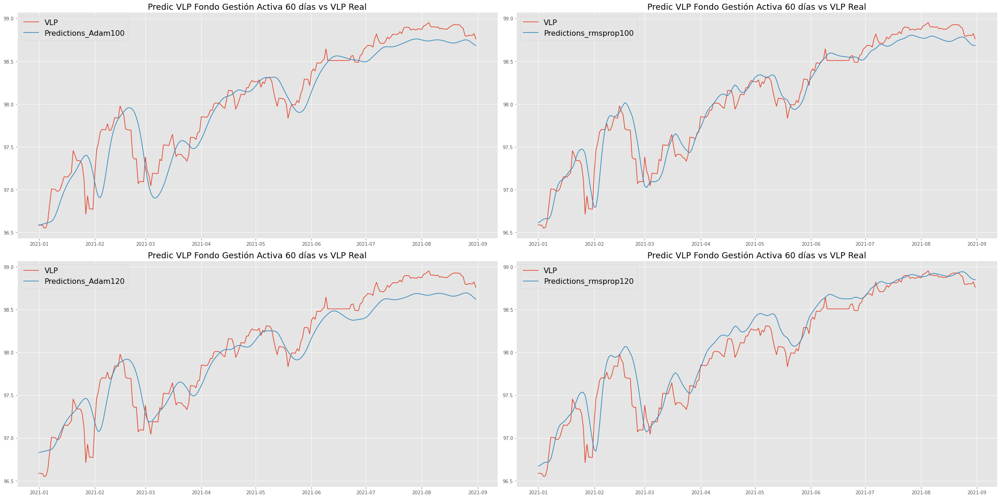

In [443]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_Gest_Alt_df_RNN_60.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Gestión Activa 60 días vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Gestión Activa 60 días vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Gestión Activa 60 días vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Gestión Activa 60 días vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [444]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI3_60 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI3_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI3_60 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI3_60 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI3_60 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI3_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI3_60 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI3_60 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI3_60 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI3_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI3_60 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI3_60 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI3_60 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI3_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI3_60 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI3_60 = round(r2_score(y_test,predictions_rmsprop120),5)

In [445]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mse_a100_FI3_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',rmse_a100_FI3_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mae_a100_FI3_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es:',r2_a100_FI3_60)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mse_a120_FI3_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',rmse_a120_FI3_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mae_a120_FI3_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es:',r2_a120_FI3_60)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mse_rms100_FI3_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',rmse_rms100_FI3_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mae_rms100_FI3_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',r2_rms100_FI3_60)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mse_rms120_FI3_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',rmse_rms120_FI3_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mae_rms120_FI3_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',r2_rms120_FI3_60)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.04865
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.22057
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.16508
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.88786
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.04225
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.20555
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.16231
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.90262
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 0.02649
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 0.16277
El Error Absoluto Medio para la Red Opt

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


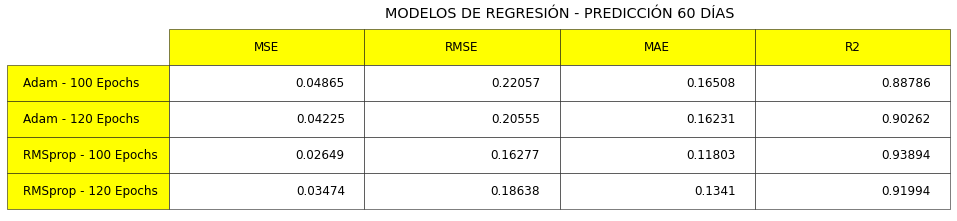

In [446]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI3_60 = [[mse_a100_FI3_60,rmse_a100_FI3_60,mae_a100_FI3_60,r2_a100_FI3_60],
               [mse_a120_FI3_60,rmse_a120_FI3_60,mae_a120_FI3_60,r2_a120_FI3_60],
               [mse_rms100_FI3_60,rmse_rms100_FI3_60,mae_rms100_FI3_60,r2_rms100_FI3_60],
               [mse_rms120_FI3_60,rmse_rms120_FI3_60,mae_rms120_FI3_60,r2_rms120_FI3_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI3_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

### **4. Fondo de Renta Variable Internacional: CaixaBank Renta Variable Global, FI Clase Universal**

#### *PREDICCIONES A 30 DÍAS*

In [461]:
# Creación de dataset a partir del principal de Renta Variable Internacional, indexando la Fecha
FI_RV_Int_df_RNN_30 = FI_RV_Int_df

In [462]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_RV_Int_df_RNN_30.iloc[:1096, 0:1].values
training_set

array([[105.942875],
       [105.946484],
       [106.647447],
       ...,
       [122.432425],
       [122.315681],
       [122.354632]])

In [463]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 30 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 30 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 30 pasos va a corresponder con 1 mes de datos financieros

In [464]:
# Estructura con 30 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 30 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 30 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [465]:
for i in range(30,1096):
  X_train.append(training_set_escalado[i-30:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 30, todos los valores a la derecha son los valores de los 30 dias previos al de la izquierda y asi sucesivamente.

In [466]:
X_train

array([[0.60368941, 0.60377615, 0.62062312, ..., 0.68340027, 0.68195402,
        0.65725752],
       [0.60377615, 0.62062312, 0.64291523, ..., 0.68195402, 0.65725752,
        0.65543774],
       [0.62062312, 0.64291523, 0.66310029, ..., 0.65725752, 0.65543774,
        0.64543143],
       ...,
       [0.95529398, 0.93110276, 0.94774789, ..., 0.97581882, 0.97564789,
        0.98874079],
       [0.93110276, 0.94774789, 0.93370329, ..., 0.97564789, 0.98874079,
        1.        ],
       [0.94774789, 0.93370329, 0.93471322, ..., 0.98874079, 1.        ,
        0.99719417]])

In [467]:
len(X_train)

1066

In [468]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.60368941],
        [0.60377615],
        [0.62062312],
        ...,
        [0.68340027],
        [0.68195402],
        [0.65725752]],

       [[0.60377615],
        [0.62062312],
        [0.64291523],
        ...,
        [0.68195402],
        [0.65725752],
        [0.65543774]],

       [[0.62062312],
        [0.64291523],
        [0.66310029],
        ...,
        [0.65725752],
        [0.65543774],
        [0.64543143]],

       ...,

       [[0.95529398],
        [0.93110276],
        [0.94774789],
        ...,
        [0.97581882],
        [0.97564789],
        [0.98874079]],

       [[0.93110276],
        [0.94774789],
        [0.93370329],
        ...,
        [0.97564789],
        [0.98874079],
        [1.        ]],

       [[0.94774789],
        [0.93370329],
        [0.93471322],
        ...,
        [0.98874079],
        [1.        ],
        [0.99719417]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [469]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 35ms/step - loss: 0.0521
Epoch 2/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0136
Epoch 3/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0107
Epoch 4/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0103
Epoch 5/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0094
Epoch 6/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0078
Epoch 7/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0091
Epoch 8/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0072
Epoch 9/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0072
Epoch 10/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0073
Epoch 11/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0068
Epoch 12/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0065
Epoch 13/100
34/34 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [470]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 7s 35ms/step - loss: 0.0524
Epoch 2/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0133
Epoch 3/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0113
Epoch 4/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0106
Epoch 5/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0092
Epoch 6/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0087
Epoch 7/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0085
Epoch 8/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0081
Epoch 9/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0103
Epoch 10/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0069
Epoch 11/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0067
Epoch 12/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0060
Epoch 13/100
34/34 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [471]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 9s 38ms/step - loss: 0.0488
Epoch 2/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0224
Epoch 3/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0181
Epoch 4/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0194
Epoch 5/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0167
Epoch 6/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0136
Epoch 7/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0142
Epoch 8/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0124
Epoch 9/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0105
Epoch 10/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0098
Epoch 11/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0092
Epoch 12/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0095
Epoch 13/100
34/34 [=====

2. Entrenamos con 120 iteraciones

In [472]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 38ms/step - loss: 0.0395
Epoch 2/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0204
Epoch 3/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0193
Epoch 4/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0159
Epoch 5/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0137
Epoch 6/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0150
Epoch 7/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0114
Epoch 8/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0106
Epoch 9/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0105
Epoch 10/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0092
Epoch 11/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0091
Epoch 12/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0085
Epoch 13/100
34/34 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [473]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 30 valores del train
test_set = training_set[-30:]
test_set = np.append(test_set ,FI_RV_Int_df_RNN_30.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

273

In [474]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_RV_Int_df_RNN_30.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(30, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-30:i, 0])

In [475]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [476]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la predicción con los diferentes optimizadores y los diferentes números de iteraciones

In [477]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

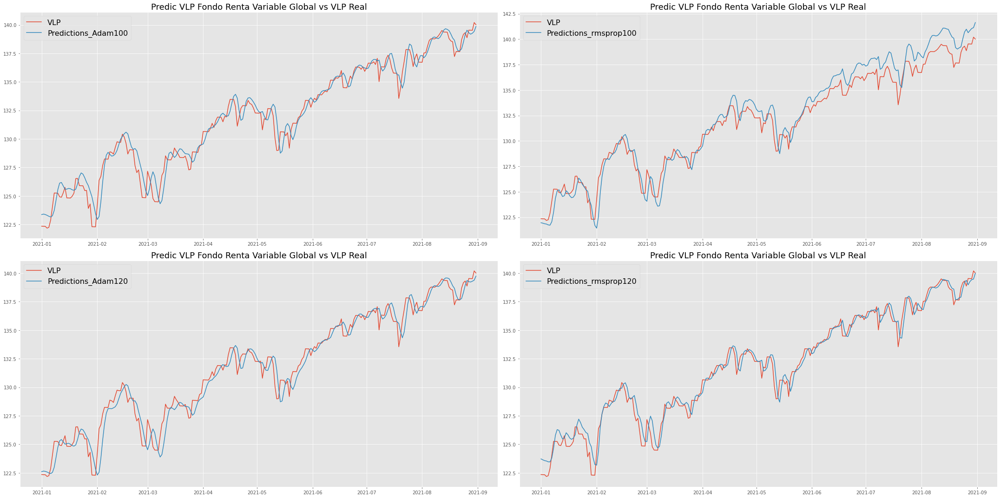

In [478]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_RV_Int_df_RNN_30.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Renta Variable Global vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Renta Variable Global vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Renta Variable Global vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Renta Variable Global vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [479]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI4_30 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI4_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI4_30 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI4_30 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI4_30 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI4_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI4_30 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI4_30 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI4_30 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI4_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI4_30 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI4_30 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI4_30 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI4_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI4_30 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI4_30 = round(r2_score(y_test,predictions_rmsprop120),5)

In [480]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mse_a100_FI4_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',rmse_a100_FI4_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mae_a100_FI4_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es:',r2_a100_FI4_30)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mse_a120_FI4_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',rmse_a120_FI4_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mae_a120_FI4_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es:',r2_a120_FI4_30)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mse_rms100_FI4_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',rmse_rms100_FI4_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mae_rms100_FI4_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',r2_rms100_FI4_30)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mse_rms120_FI4_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',rmse_rms120_FI4_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mae_rms120_FI4_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',r2_rms120_FI4_30)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.85995
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.92734
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.69204
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.96189
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.88477
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.94062
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.67722
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.96079
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 1.42743
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 1.19475
El Error Absoluto Medio para la Red Opt

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


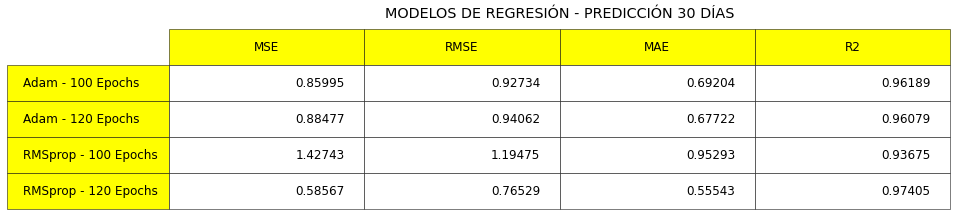

In [481]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI4_30 = [[mse_a100_FI4_30,rmse_a100_FI4_30,mae_a100_FI4_30,r2_a100_FI4_30],
               [mse_a120_FI4_30,rmse_a120_FI4_30,mae_a120_FI4_30,r2_a120_FI4_30],
               [mse_rms100_FI4_30,rmse_rms100_FI4_30,mae_rms100_FI4_30,r2_rms100_FI4_30],
               [mse_rms120_FI4_30,rmse_rms120_FI4_30,mae_rms120_FI4_30,r2_rms120_FI4_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI4_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [482]:
# Creación de dataset a partir del principal de Renta Variable Internacional, indexando la Fecha
FI_RV_Int_df_RNN_60 = FI_RV_Int_df

In [483]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_RV_Int_df_RNN_60.iloc[:1096, 0:1].values
training_set

array([[105.942875],
       [105.946484],
       [106.647447],
       ...,
       [122.432425],
       [122.315681],
       [122.354632]])

In [484]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 60 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 60 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 60 pasos va a corresponder con 1 mes de datos financieros

In [485]:
# Estructura con 60 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 60 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 60 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [486]:
for i in range(60,1096):
  X_train.append(training_set_escalado[i-60:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 60, todos los valores a la derecha son los valores de los 60 dias previos al de la izquierda y asi sucesivamente.

In [487]:
X_train

array([[0.60368941, 0.60377615, 0.62062312, ..., 0.59375539, 0.57806433,
        0.54700074],
       [0.60377615, 0.62062312, 0.64291523, ..., 0.57806433, 0.54700074,
        0.51255714],
       [0.62062312, 0.64291523, 0.66310029, ..., 0.54700074, 0.51255714,
        0.5162256 ],
       ...,
       [0.66337789, 0.66322549, 0.66306968, ..., 0.97581882, 0.97564789,
        0.98874079],
       [0.66322549, 0.66306968, 0.69288477, ..., 0.97564789, 0.98874079,
        1.        ],
       [0.66306968, 0.69288477, 0.73194173, ..., 0.98874079, 1.        ,
        0.99719417]])

In [488]:
len(X_train)

1036

In [489]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.60368941],
        [0.60377615],
        [0.62062312],
        ...,
        [0.59375539],
        [0.57806433],
        [0.54700074]],

       [[0.60377615],
        [0.62062312],
        [0.64291523],
        ...,
        [0.57806433],
        [0.54700074],
        [0.51255714]],

       [[0.62062312],
        [0.64291523],
        [0.66310029],
        ...,
        [0.54700074],
        [0.51255714],
        [0.5162256 ]],

       ...,

       [[0.66337789],
        [0.66322549],
        [0.66306968],
        ...,
        [0.97581882],
        [0.97564789],
        [0.98874079]],

       [[0.66322549],
        [0.66306968],
        [0.69288477],
        ...,
        [0.97564789],
        [0.98874079],
        [1.        ]],

       [[0.66306968],
        [0.69288477],
        [0.73194173],
        ...,
        [0.98874079],
        [1.        ],
        [0.99719417]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [490]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 61ms/step - loss: 0.0540
Epoch 2/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0128
Epoch 3/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0110
Epoch 4/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0093
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0089
Epoch 6/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0082
Epoch 7/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0075
Epoch 8/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0071
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0063
Epoch 10/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0078
Epoch 11/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0065
Epoch 12/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0070
Epoch 13/100
33/33 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [491]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 9s 60ms/step - loss: 0.0642
Epoch 2/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0132
Epoch 3/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0101
Epoch 4/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0104
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0089
Epoch 6/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0078
Epoch 7/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0073
Epoch 8/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0073
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0066
Epoch 10/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0068
Epoch 11/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0063
Epoch 12/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0067
Epoch 13/100
33/33 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [492]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 62ms/step - loss: 0.0498
Epoch 2/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0215
Epoch 3/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0176
Epoch 4/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0167
Epoch 5/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0153
Epoch 6/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0132
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0123
Epoch 8/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0099
Epoch 9/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0105
Epoch 10/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0096
Epoch 11/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0089
Epoch 12/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0086
Epoch 13/100
33/33 [=====

2. Entrenamos con 120 iteraciones

In [493]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 9s 63ms/step - loss: 0.0440
Epoch 2/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0209
Epoch 3/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0170
Epoch 4/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0157
Epoch 5/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0140
Epoch 6/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0129
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0106
Epoch 8/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0107
Epoch 9/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0106
Epoch 10/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0092
Epoch 11/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0100
Epoch 12/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0080
Epoch 13/100
33/33 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [494]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 60 valores del train
test_set = training_set[-60:]
test_set = np.append(test_set ,FI_RV_Int_df_RNN_60.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

303

In [495]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_RV_Int_df_RNN_60.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(60, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-60:i, 0])

In [496]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [497]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la prediccion con los diferentes optimizadores y los diferentes números de iteraciones

In [498]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

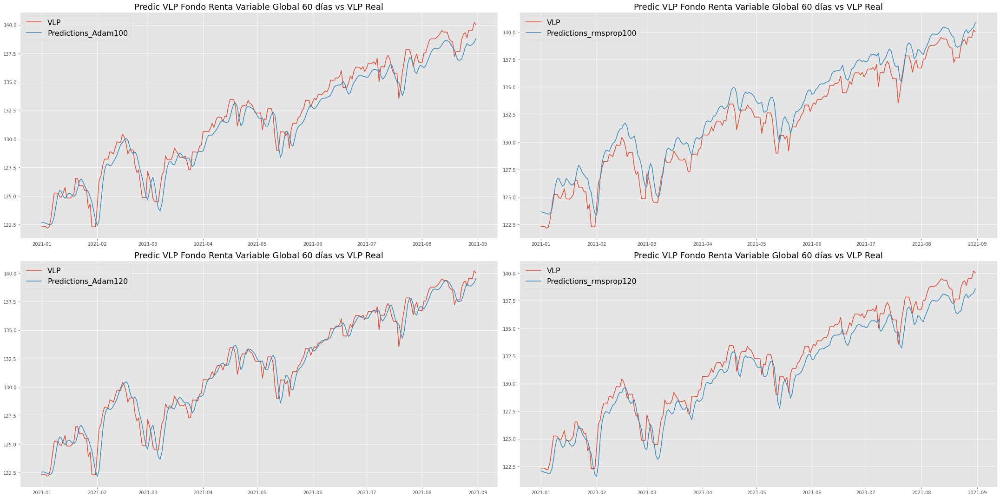

In [499]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_RV_Int_df_RNN_60.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Renta Variable Global 60 días vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Renta Variable Global 60 días vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Renta Variable Global 60 días vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Renta Variable Global 60 días vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [500]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI4_60 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI4_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI4_60 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI4_60 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI4_60 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI4_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI4_60 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI4_60 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI4_60 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI4_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI4_60 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI4_60 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI4_60 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI4_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI4_60 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI4_60 = round(r2_score(y_test,predictions_rmsprop120),5)

In [501]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mse_a100_FI4_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',rmse_a100_FI4_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mae_a100_FI4_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es:',r2_a100_FI4_60)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mse_a120_FI4_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',rmse_a120_FI4_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mae_a120_FI4_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es:',r2_a120_FI4_60)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mse_rms100_FI4_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',rmse_rms100_FI4_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mae_rms100_FI4_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',r2_rms100_FI4_60)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mse_rms120_FI4_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',rmse_rms120_FI4_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mae_rms120_FI4_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',r2_rms120_FI4_60)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 1.08126
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 1.03984
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.86038
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.95209
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.78953
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.88855
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.64461
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.96501
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 1.88696
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 1.37367
El Error Absoluto Medio para la Red Opt

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


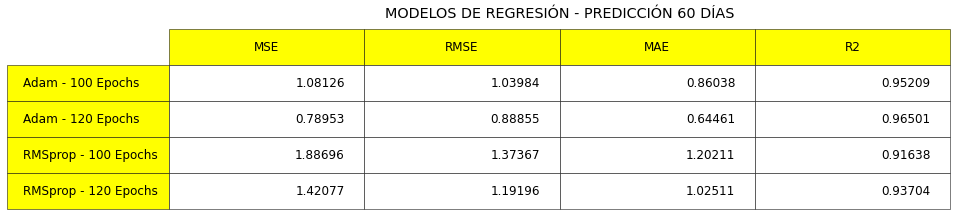

In [502]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI4_60 = [[mse_a100_FI4_60,rmse_a100_FI4_60,mae_a100_FI4_60,r2_a100_FI4_60],
               [mse_a120_FI4_60,rmse_a120_FI4_60,mae_a120_FI4_60,r2_a120_FI4_60],
               [mse_rms100_FI4_60,rmse_rms100_FI4_60,mae_rms100_FI4_60,r2_rms100_FI4_60],
               [mse_rms120_FI4_60,rmse_rms120_FI4_60,mae_rms120_FI4_60,r2_rms120_FI4_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI4_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()

### **5. Fondo de Renta Variable Global: CaixaBank Global Flexible, FI**

#### *PREDICCIONES A 30 DÍAS*

In [503]:
# Creación de dataset a partir del principal de Renta Variable Global, indexando la Fecha
FI_RV_Glob_df_RNN_30 = FI_RV_Glob_df

In [504]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_RV_Glob_df_RNN_30.iloc[:1096, 0:1].values
training_set

array([[ 99.015743],
       [ 99.026838],
       [ 99.514758],
       ...,
       [106.413153],
       [106.394432],
       [106.426464]])

In [505]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 30 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 30 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 30 pasos va a corresponder con 1 mes de datos financieros

In [506]:
# Estructura con 30 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 30 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 30 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [507]:
for i in range(30,1096):
  X_train.append(training_set_escalado[i-30:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 30, todos los valores a la derecha son los valores de los 30 dias previos al de la izquierda y asi sucesivamente.

In [508]:
X_train

array([[0.54975812, 0.55041413, 0.5792629 , ..., 0.67871452, 0.67497048,
        0.63410867],
       [0.55041413, 0.5792629 , 0.60854583, ..., 0.67497048, 0.63410867,
        0.6316019 ],
       [0.5792629 , 0.60854583, 0.64077696, ..., 0.63410867, 0.6316019 ,
        0.60625996],
       ...,
       [0.99726761, 0.99763212, 0.99350264, ..., 0.9875532 , 0.98739989,
        0.98671882],
       [0.99763212, 0.99350264, 0.99243418, ..., 0.98739989, 0.98671882,
        0.98713755],
       [0.99350264, 0.99243418, 0.9918739 , ..., 0.98671882, 0.98713755,
        0.98603065]])

In [509]:
len(X_train)

1066

In [510]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.54975812],
        [0.55041413],
        [0.5792629 ],
        ...,
        [0.67871452],
        [0.67497048],
        [0.63410867]],

       [[0.55041413],
        [0.5792629 ],
        [0.60854583],
        ...,
        [0.67497048],
        [0.63410867],
        [0.6316019 ]],

       [[0.5792629 ],
        [0.60854583],
        [0.64077696],
        ...,
        [0.63410867],
        [0.6316019 ],
        [0.60625996]],

       ...,

       [[0.99726761],
        [0.99763212],
        [0.99350264],
        ...,
        [0.9875532 ],
        [0.98739989],
        [0.98671882]],

       [[0.99763212],
        [0.99350264],
        [0.99243418],
        ...,
        [0.98739989],
        [0.98671882],
        [0.98713755]],

       [[0.99350264],
        [0.99243418],
        [0.9918739 ],
        ...,
        [0.98671882],
        [0.98713755],
        [0.98603065]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [511]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 35ms/step - loss: 0.0697
Epoch 2/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0160
Epoch 3/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0118
Epoch 4/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0108
Epoch 5/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0125
Epoch 6/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0106
Epoch 7/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0089
Epoch 8/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0085
Epoch 9/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0094
Epoch 10/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0084
Epoch 11/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0081
Epoch 12/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0082
Epoch 13/100
34/34 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [512]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 7s 35ms/step - loss: 0.0929
Epoch 2/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0172
Epoch 3/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0120
Epoch 4/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0116
Epoch 5/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0103
Epoch 6/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0103
Epoch 7/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0091
Epoch 8/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0089
Epoch 9/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0107
Epoch 10/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0098
Epoch 11/100
34/34 [==============================] - 1s 34ms/step - loss: 0.0094
Epoch 12/100
34/34 [==============================] - 1s 35ms/step - loss: 0.0086
Epoch 13/100
34/34 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [513]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 7s 38ms/step - loss: 0.0505
Epoch 2/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0258
Epoch 3/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0208
Epoch 4/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0181
Epoch 5/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0166
Epoch 6/100
34/34 [==============================] - 1s 39ms/step - loss: 0.0152
Epoch 7/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0145
Epoch 8/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0120
Epoch 9/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0112
Epoch 10/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0119
Epoch 11/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0102
Epoch 12/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0102
Epoch 13/100
34/34 [=====

2. Entrenamos con 120 iteraciones

In [514]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
34/34 [==============================] - 8s 38ms/step - loss: 0.0521
Epoch 2/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0267
Epoch 3/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0221
Epoch 4/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0183
Epoch 5/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0191
Epoch 6/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0169
Epoch 7/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0138
Epoch 8/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0136
Epoch 9/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0124
Epoch 10/100
34/34 [==============================] - 1s 37ms/step - loss: 0.0118
Epoch 11/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0097
Epoch 12/100
34/34 [==============================] - 1s 38ms/step - loss: 0.0103
Epoch 13/100
34/34 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [515]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 30 valores del train
test_set = training_set[-30:]
test_set = np.append(test_set ,FI_RV_Glob_df_RNN_30.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

273

In [516]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_RV_Glob_df_RNN_30.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(30, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-30:i, 0])

In [517]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [518]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la predicción con los diferentes optimizadores y los diferentes números de iteraciones

In [519]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

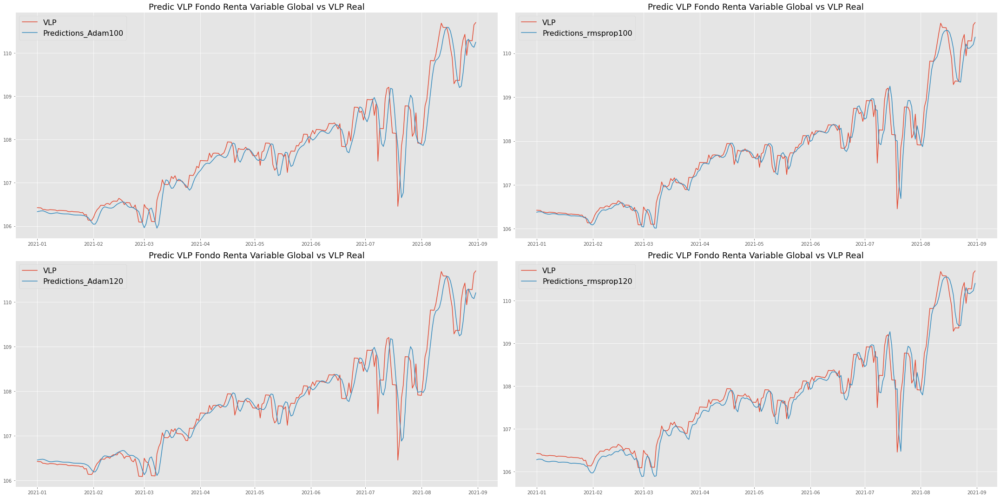

In [520]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_RV_Glob_df_RNN_30.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Renta Variable Global vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Renta Variable Global vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Renta Variable Global vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Renta Variable Global vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [521]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI5_30 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI5_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI5_30 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI5_30 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI5_30 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI5_30 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI5_30 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI5_30 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI5_30 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI5_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI5_30 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI5_30 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI5_30 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI5_30 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI5_30 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI5_30 = round(r2_score(y_test,predictions_rmsprop120),5)

In [522]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mse_a100_FI5_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',rmse_a100_FI5_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es:',mae_a100_FI5_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es:',r2_a100_FI5_30)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mse_a120_FI5_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',rmse_a120_FI5_30)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es:',mae_a120_FI5_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es:',r2_a120_FI5_30)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mse_rms100_FI5_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',rmse_rms100_FI5_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',mae_rms100_FI5_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 30 días es:',r2_rms100_FI5_30)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mse_rms120_FI5_30)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',rmse_rms120_FI5_30)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',mae_rms120_FI5_30)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 30 días es:',r2_rms120_FI5_30)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.1149
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.33896
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.22333
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 30 días es: 0.91578
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.10293
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.32082
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.20888
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 30 días es: 0.92455
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 0.07284
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 30 días es: 0.26989
El Error Absoluto Medio para la Red Opti

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


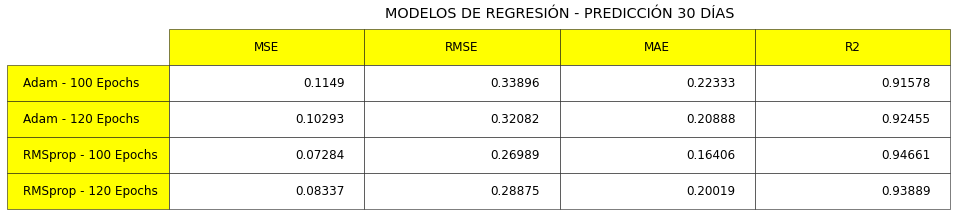

In [523]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI5_30 = [[mse_a100_FI5_30,rmse_a100_FI5_30,mae_a100_FI5_30,r2_a100_FI5_30],
               [mse_a120_FI5_30,rmse_a120_FI5_30,mae_a120_FI5_30,r2_a120_FI5_30],
               [mse_rms100_FI5_30,rmse_rms100_FI5_30,mae_rms100_FI5_30,r2_rms100_FI5_30],
               [mse_rms120_FI5_30,rmse_rms120_FI5_30,mae_rms120_FI5_30,r2_rms120_FI5_30]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI5_30,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 30 DÍAS')
plt.show()

#### *PREDICCIONES A 60 DÍAS*

In [524]:
# Creación de dataset a partir del principal de Renta Variable Global, indexando la Fecha
FI_RV_Glob_df_RNN_60 = FI_RV_Glob_df

In [525]:
# Creacion del set de entrenamiento y converción en matriz
training_set = FI_RV_Glob_df_RNN_60.iloc[:1096, 0:1].values
training_set

array([[ 99.015743],
       [ 99.026838],
       [ 99.514758],
       ...,
       [106.413153],
       [106.394432],
       [106.426464]])

In [526]:
# Escalado de características (Normalizacion)
sc = MinMaxScaler(feature_range=(0, 1))
training_set_escalado = sc.fit_transform(training_set)

Con esto ya hemos escalado la información

En el siguiente paso, vamos a crear estructura con 60 pasos temporales y 1 salida. Esto quiere decir que nuestro modelo va a ver los 60 precios anteriores del fondo y basado en estos precios va a intentar predecir el proximo valor de salida (el output). Se puede usar cualquier numero. 60 pasos va a corresponder con 1 mes de datos financieros

In [527]:
# Estructura con 60 pasos temporales y 1 salida
# Vamos a crear 2 objetos, el primero va a ser X_train (input de la red neuronal) y Y_train (output)
# Quiere decir que por cada predicción, X_train va a contener los ultimos 60 dias financieros e Y_train el siguiente dia
# vamos a inicialiarlos como listas vacias
X_train = []
y_train = []

Como queremos encontrar los últimos 60 datos, vamos a utilizar un ciclo *for* para encontrarlos

In [528]:
for i in range(60,1096):
  X_train.append(training_set_escalado[i-60:i,0])
  y_train.append(training_set_escalado[i,0])
X_train,y_train = np.array(X_train),np.array(y_train)

Si visualizamos la matriz X_train, vemos que la primera fila corresponde al tiempo t = 60, todos los valores a la derecha son los valores de los 60 dias previos al de la izquierda y asi sucesivamente.

In [529]:
X_train

array([[0.54975812, 0.55041413, 0.5792629 , ..., 0.51990829, 0.49377849,
        0.44928853],
       [0.55041413, 0.5792629 , 0.60854583, ..., 0.49377849, 0.44928853,
        0.40805995],
       [0.5792629 , 0.60854583, 0.64077696, ..., 0.44928853, 0.40805995,
        0.41606   ],
       ...,
       [0.91659394, 0.91645801, 0.91622369, ..., 0.9875532 , 0.98739989,
        0.98671882],
       [0.91645801, 0.91622369, 0.92646846, ..., 0.98739989, 0.98671882,
        0.98713755],
       [0.91622369, 0.92646846, 0.93685979, ..., 0.98671882, 0.98713755,
        0.98603065]])

In [530]:
len(X_train)

1036

In [531]:
# Rediseño
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))
X_train

array([[[0.54975812],
        [0.55041413],
        [0.5792629 ],
        ...,
        [0.51990829],
        [0.49377849],
        [0.44928853]],

       [[0.55041413],
        [0.5792629 ],
        [0.60854583],
        ...,
        [0.49377849],
        [0.44928853],
        [0.40805995]],

       [[0.5792629 ],
        [0.60854583],
        [0.64077696],
        ...,
        [0.44928853],
        [0.40805995],
        [0.41606   ]],

       ...,

       [[0.91659394],
        [0.91645801],
        [0.91622369],
        ...,
        [0.9875532 ],
        [0.98739989],
        [0.98671882]],

       [[0.91645801],
        [0.91622369],
        [0.92646846],
        ...,
        [0.98739989],
        [0.98671882],
        [0.98713755]],

       [[0.91622369],
        [0.92646846],
        [0.93685979],
        ...,
        [0.98671882],
        [0.98713755],
        [0.98603065]]])

Construcción del modelo LSTM

Para la construcción, se van a tomar dos tipos de optimizadores *Adam* y *RMSprop*. Por otro lado, también se va a realizar mediante 100 y 120 iteraciones (epochs)

Optimizador *Adam*

1. Entrenamos con 100 iteraciones

In [532]:
# Inicialización del modelo
model_Adam100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam100.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_Adam = model_Adam100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 60ms/step - loss: 0.0664
Epoch 2/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0136
Epoch 3/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0124
Epoch 4/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0129
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0111
Epoch 6/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0101
Epoch 7/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0094
Epoch 8/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0083
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0085
Epoch 10/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0073
Epoch 11/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0083
Epoch 12/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0081
Epoch 13/100
33/33 [=====

-------------------------------------------------------------------------------------

2. Entrenamos con 120 iteraciones

In [533]:
# Inicialización del modelo
model_Adam120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_Adam120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_Adam120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_Adam120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_Adam120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_Adam120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_Adam120.compile(optimizer='adam',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_Adam = model_Adam120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 60ms/step - loss: 0.0827
Epoch 2/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0194
Epoch 3/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0132
Epoch 4/100
33/33 [==============================] - 2s 59ms/step - loss: 0.0107
Epoch 5/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0109
Epoch 6/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0103
Epoch 7/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0097
Epoch 8/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0085
Epoch 9/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0095
Epoch 10/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0084
Epoch 11/100
33/33 [==============================] - 2s 61ms/step - loss: 0.0079
Epoch 12/100
33/33 [==============================] - 2s 60ms/step - loss: 0.0079
Epoch 13/100
33/33 [=====

Optimizador *RMSprop*

1. Entrenamos con 100 iteraciones

In [534]:
# Inicialización del modelo
model_RMSprop100  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop100.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop100.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop100.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop100.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop100.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop100.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo100_RMSprop = model_RMSprop100.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 9s 63ms/step - loss: 0.0632
Epoch 2/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0243
Epoch 3/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0207
Epoch 4/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0162
Epoch 5/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0141
Epoch 6/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0156
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0131
Epoch 8/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0121
Epoch 9/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0119
Epoch 10/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0105
Epoch 11/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0115
Epoch 12/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0093
Epoch 13/100
33/33 [=====

2. Entrenamos con 120 iteraciones

In [535]:
# Inicialización del modelo
model_RMSprop120  = Sequential()

# Agregado Primera Capa LSTM y Regularizacion de Desercion
model_RMSprop120.add(LSTM(units=50,return_sequences=True, input_shape=(X_train.shape[1],1))) # True es porque vamos a añadir mas capas y lo otro es porque es la primera capa
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Segunda Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Tercera Capa LSTM
model_RMSprop120.add(LSTM(units=50,return_sequences=True)) # True es porque vamos a añadir mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado Cuarta Capa LSTM (La última)
model_RMSprop120.add(LSTM(units=50)) # eliminamos return_sequences porque no vamos a agregar mas capas
model_RMSprop120.add(Dropout(0.2)) # Vamos a añadir la regularizacion de desercion 

# Agregado capa de salida - output
model_RMSprop120.add(Dense(units=1)) # 1 unidad porque solo tenemos una salida

# Optimizador y funcion de Perdida (Compilacion)
model_RMSprop120.compile(optimizer='rmsprop',loss='mean_squared_error')

# Entrenamiento del modelo red neuronal en Set de entrenamiento
modelo120_RMSprop = model_RMSprop120.fit(X_train,y_train,epochs=100,batch_size=32)

Epoch 1/100
33/33 [==============================] - 8s 64ms/step - loss: 0.0587
Epoch 2/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0278
Epoch 3/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0239
Epoch 4/100
33/33 [==============================] - 2s 62ms/step - loss: 0.0193
Epoch 5/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0176
Epoch 6/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0141
Epoch 7/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0171
Epoch 8/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0136
Epoch 9/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0134
Epoch 10/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0115
Epoch 11/100
33/33 [==============================] - 2s 63ms/step - loss: 0.0106
Epoch 12/100
33/33 [==============================] - 2s 64ms/step - loss: 0.0105
Epoch 13/100
33/33 [=====

PARTE 3 - PREDICCION Y VISUALIZACION

In [536]:
# Creación del dataset de testeo
# Creamos nuevo array que contenga valores escalados para el test_set
# Vamos a convertir el set de datos test en matriz y le vamos a agregar los últimos 60 valores del train
test_set = training_set[-60:]
test_set = np.append(test_set ,FI_RV_Glob_df_RNN_60.iloc[1096:, 0:1].values).reshape(-1,1)

# Escalamos el array
testing_set_escalado = sc.fit_transform(test_set)
len(testing_set_escalado)

303

In [537]:
# Creación de los sets X_test e y_set
X_test = []
y_test = FI_RV_Glob_df_RNN_60.iloc[1096:, 0:1].values.reshape(-1,1)
for i in range(60, len(testing_set_escalado)):
  X_test.append(testing_set_escalado[i-60:i, 0])

In [538]:
# Convertimos los datos a un array con numpy
X_test = np.array(X_test)

In [539]:
# Reshape de los datos
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

Realizamos la prediccion con los diferentes optimizadores y los diferentes números de iteraciones

In [540]:
# Prediccion con Adam y 100 epochs
predictions_Adam100 = model_Adam100.predict(X_test)
predictions_Adam100 = sc.inverse_transform(predictions_Adam100)

# Prediccion con Adam y 120 epochs
predictions_Adam120 = model_Adam120.predict(X_test)
predictions_Adam120 = sc.inverse_transform(predictions_Adam120)

# Prediccion con RMS prop y 100 epochs
predictions_rmsprop100 = model_RMSprop100.predict(X_test)
predictions_rmsprop100 = sc.inverse_transform(predictions_rmsprop100)

# Prediccion con RMS prop y 120 epochs
predictions_rmsprop120 = model_RMSprop120.predict(X_test)
predictions_rmsprop120 = sc.inverse_transform(predictions_rmsprop120)

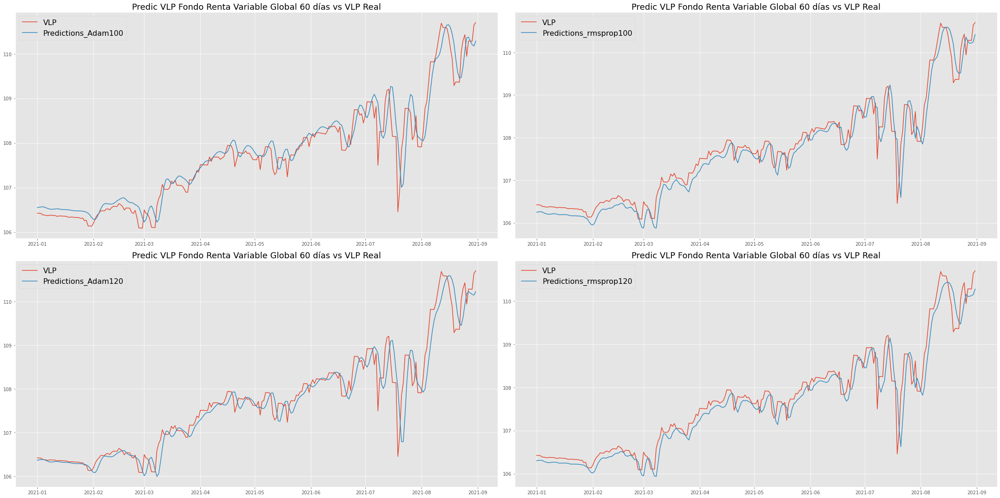

In [541]:
# Visualizamos
x = pd.date_range(start='1/1/2021', end='31/08/2021')
y = FI_RV_Glob_df_RNN_60.iloc[1096:, 0:1]
y['Predictions_Adam100'] = predictions_Adam100
y['Predictions_Adam120'] = predictions_Adam120
y['Predictions_rmsprop100'] = predictions_rmsprop100
y['Predictions_rmsprop120'] = predictions_rmsprop120

#Plot
fig, axs = plt.subplots(2, 2, figsize=(30,15))
axs[0, 0].plot(x, y[['VLP','Predictions_Adam100']])
axs[0, 0].set_title("Predic VLP Fondo Renta Variable Global 60 días vs VLP Real", fontsize=18)
axs[0, 0].legend(y[['VLP','Predictions_Adam100']], fontsize=16)
axs[1, 0].plot(x, y[['VLP','Predictions_Adam120']])
axs[1, 0].set_title("Predic VLP Fondo Renta Variable Global 60 días vs VLP Real", fontsize=18)
axs[1, 0].legend(y[['VLP','Predictions_Adam120']], fontsize=16)
axs[0, 1].plot(x, y[['VLP','Predictions_rmsprop100']])
axs[0, 1].set_title("Predic VLP Fondo Renta Variable Global 60 días vs VLP Real", fontsize=18)
axs[0, 1].legend(y[['VLP','Predictions_rmsprop100']], fontsize=16)
axs[1, 1].plot(x, y[['VLP','Predictions_rmsprop120']])
axs[1, 1].set_title("Predic VLP Fondo Renta Variable Global 60 días vs VLP Real", fontsize=18)
axs[1, 1].legend(y[['VLP','Predictions_rmsprop120']], fontsize=16)
fig.tight_layout()

In [542]:
# Calculos de indicadores (MSE, RMSE, MAE y R2) para cada red Neuronal

# Calculo indicadores Red Optimizador Adam - 100 Epochs
mse_a100_FI5_60 = round(mean_squared_error(y_test,predictions_Adam100),5)
rmse_a100_FI5_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam100)),5)
mae_a100_FI5_60 = round(mean_absolute_error(y_test,predictions_Adam100),5)
r2_a100_FI5_60 = round(r2_score(y_test,predictions_Adam100),5)

# Calculo indicadores Red Optimizador Adam - 120 Epochs
mse_a120_FI5_60 = round(mean_squared_error(y_test,predictions_Adam120),5)
rmse_a120_FI5_60 = round(sqrt(mean_squared_error(y_test,predictions_Adam120)),5)
mae_a120_FI5_60 = round(mean_absolute_error(y_test,predictions_Adam120),5)
r2_a120_FI5_60 = round(r2_score(y_test,predictions_Adam120),5)

# Calculo indicadores Red Optimizador RMSprop - 100 Epochs
mse_rms100_FI5_60 = round(mean_squared_error(y_test,predictions_rmsprop100),5)
rmse_rms100_FI5_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop100)),5)
mae_rms100_FI5_60 = round(mean_absolute_error(y_test,predictions_rmsprop100),5)
r2_rms100_FI5_60 = round(r2_score(y_test,predictions_rmsprop100),5)

# Calculo indicadores Red Optimizador RMSprop - 120 Epochs
mse_rms120_FI5_60 = round(mean_squared_error(y_test,predictions_rmsprop120),5)
rmse_rms120_FI5_60 = round(sqrt(mean_squared_error(y_test,predictions_rmsprop120)),5)
mae_rms120_FI5_60 = round(mean_absolute_error(y_test,predictions_rmsprop120),5)
r2_rms120_FI5_60 = round(r2_score(y_test,predictions_rmsprop120),5)

In [543]:
# Print de resultados
# Resultados Red Optimizador Adam - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mse_a100_FI5_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',rmse_a100_FI5_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es:',mae_a100_FI5_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es:',r2_a100_FI5_60)

# Resultados Red Optimizador Adam - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mse_a120_FI5_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',rmse_a120_FI5_60)
print('El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es:',mae_a120_FI5_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es:',r2_a120_FI5_60)

# Resultados Red Optimizador RMSprop - 100 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mse_rms100_FI5_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',rmse_rms100_FI5_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',mae_rms100_FI5_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 100 Epochs de 60 días es:',r2_rms100_FI5_60)

# Resultados Red Optimizador RMSprop - 120 Epochs
print('El Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mse_rms120_FI5_60)
print('La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',rmse_rms120_FI5_60)
print('El Error Absoluto Medio para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',mae_rms120_FI5_60)
print('El Coeficiente de Determinación (R2) para la Red Optimizador RMSprop - 120 Epochs de 60 días es:',r2_rms120_FI5_60)

El Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.10775
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.32825
El Error Absoluto Medio para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.22836
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 100 Epochs de 60 días es: 0.92102
El Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.11573
La Raíz del Error Cuadrático Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.3402
El Error Absoluto Medio para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.2185
El Coeficiente de Determinación (R2) para la Red Optimizador Adam - 120 Epochs de 60 días es: 0.91517
El Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 0.09323
La Raíz del Error Cuadrático Medio para la Red Optimizador RMSprop - 100 Epochs de 60 días es: 0.30533
El Error Absoluto Medio para la Red Optim

/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


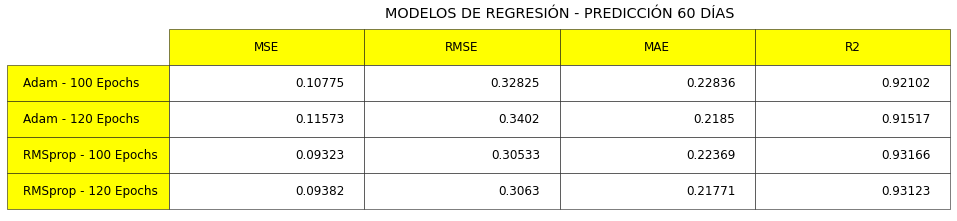

In [544]:
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
fig, axs = plt.subplots(1, 1)
data_FI5_60 = [[mse_a100_FI5_60,rmse_a100_FI5_60,mae_a100_FI5_60,r2_a100_FI5_60],
               [mse_a120_FI5_60,rmse_a120_FI5_60,mae_a120_FI5_60,r2_a120_FI5_60],
               [mse_rms100_FI5_60,rmse_rms100_FI5_60,mae_rms100_FI5_60,r2_rms100_FI5_60],
               [mse_rms120_FI5_60,rmse_rms120_FI5_60,mae_rms120_FI5_60,r2_rms120_FI5_60]]
column_labels = ["MSE", "RMSE", "MAE", "R2"]
axs.axis('tight')
axs.axis('off')
df=pd.DataFrame(data_FI5_60,columns=column_labels)
the_table = axs.table(cellText=df.values,
                      colLabels=df.columns,
                      rowLabels=["Adam - 100 Epochs","Adam - 120 Epochs","RMSprop - 100 Epochs","RMSprop - 120 Epochs"],
                      rowColours =["yellow"] * 4,  
                      colColours =["yellow"] * 4,
                      loc="center",
                      )
the_table.auto_set_font_size(False)
the_table.set_fontsize(12)
the_table.scale(2,3)
plt.title('MODELOS DE REGRESIÓN - PREDICCIÓN 60 DÍAS')
plt.show()